# Documentation
**Author:** Spencer Ressel

**Created:** February 20th, 2024

***

This notebook analyzes aqua-planet simulation data from the CAM6 model run by Mu-Ting Chien.
For simulation details, see: https://doi.org/10.1029/2024MS004378

In particular, regression analysis is performed on variable data to understand the structure of the Madden-Julian Oscillation in the simulation data

### This file requires other files in the aquaplanet_analysis folder and in the auxiliary_functions folder
 - config.py
 - load_aquaplanet_data.py

***

# Imports

In [1]:
%load_ext autoreload
%autoreload 2

print("Loading imports...")
# Aquaplanet analysis config file
from config import *

import warnings
warnings.filterwarnings('ignore', category=FutureWarning)

# File management
import glob
import os
import sys
from datetime import datetime, timedelta
import copy
import cftime

# Data anaylsis
import numpy as np
import scipy
import xarray as xr
import xeofs
xr.set_options(keep_attrs=True)
import scipy.signal as signal
from scipy.stats import t

# Plotting
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors
from matplotlib import ticker as mticker
from matplotlib.gridspec import GridSpec
import matplotlib.patches as patches
from cartopy import util as cutil
from plotting_functions import *

# Auxiliary functions
sys.path.insert(0, "/glade/u/home/sressel/thesis-work/python/auxiliary_functions/")
from load_aquaplanet_data import *
from processing_functions import *
from standardize_data import standardize_data
from modified_colormap import modified_colormap
from bmh_colors import bmh_colors
from one_two_one_filter import one_two_one_filter
from tick_labeller import tick_labeller
from rounding_functions import round_out

print("Imports loaded")

Loading imports...
Imports loaded


# Specify analysis parameters

In [2]:
# Set latitude bounds
LATITUDE_SOUTH = -30
LATITUDE_NORTH = 30
latitude_subset_bounds = slice(LATITUDE_SOUTH, LATITUDE_NORTH)

# Set central longitude
CENTRAL_LONGITUDE = 0

# Set longitude bounds
LONGITUDE_MIN = 0
LONGITUDE_MAX = 360

# Set time bounds
missing_days = [
    cftime.DatetimeNoLeap(7, 2, 5, 0, 0, 0, 0, has_year_zero=True),
    cftime.DatetimeNoLeap(7, 2, 6, 0, 0, 0, 0, has_year_zero=True),
    cftime.DatetimeNoLeap(7, 2, 7, 0, 0, 0, 0, has_year_zero=True),
]

START_TIME = cftime.DatetimeNoLeap(3, 1, 3, 0, 0, 0, 0, has_year_zero=True)
END_TIME = cftime.DatetimeNoLeap(13, 1, 3, 0, 0, 0, 0, has_year_zero=True)
first_half_subset_bounds = slice(START_TIME, missing_days[0] - timedelta(days=1))
second_half_subset_bounds = slice(missing_days[-1] + timedelta(days=1), END_TIME)

# Cut-off periods for intraseasonal filtering
INTRASEASONAL_LOWCUT = 100
INTRASEASONAL_HIGHCUT = 20
frequency_subset_bounds = slice(INTRASEASONAL_LOWCUT, INTRASEASONAL_HIGHCUT)

# Cut-off wavenumbers for MJO-filtering
LARGE_SCALE_CUTOFF = 1
SMALL_SCALE_CUTOFF = 3
wavenumber_bounds = slice(LARGE_SCALE_CUTOFF, SMALL_SCALE_CUTOFF)

# Column-integrated bounds
LOWER_LEVEL_PRESSURE = 950
UPPER_LEVEL_PRESSURE = 100
pressure_subset_bounds = slice(UPPER_LEVEL_PRESSURE, LOWER_LEVEL_PRESSURE)

# Load data

In [19]:
reload_variables = False

# experiment_to_load = '4K'
variables_to_load = [
    "Precipitation",
    # "Outgoing Longwave Radiation",
    "Zonal Wind",
    "Meridional Wind",
    "Vertical Wind",
    # "Temperature",
    "Moisture",
    # "Relative Humidity",
    # "Geopotential Height",
    # "Longwave Heating Rate",
    # "Shortwave Heating Rate",
    # "Latent Heat Flux",
    # "Sensible Heat Flux",
    # "Surface Pressure",
    # "Moist Static Energy",
    # "Column Moist Static Energy",
    "Column Water Vapor",
    # "Column Temperature",
    # "Column Longwave Heating",
    # "Column Shortwave Heating",
    # "Potential Temperature",
    # "Saturation Specific Humidity",
    # "Column Relative Humidity",
    # "Diabatic Heating",
    # "Chikira alpha"
    # "Zonal Moisture Advection",
    # "Meridional Moisture Advection",
    # "Vertical Moisture Advection",
    # 'Moisture Tendency',
    # 'Zonal Advection',
    # 'Meridional Advection',
    # 'Vertical Advection',
    # 'Evaporation',
    # 'Residual'
    # "Upper Level Moisture",
    # "Lower Level Moisture"
]

# if reload_variables or 'variables_dict' not in globals():
#     variables_dict = load_aquaplanet_data(variables_to_load, experiment_to_load)
# else:
#     new_variables_dict = load_aquaplanet_data(variables_to_load, experiment_to_load)

#     # If not reloading, append new variables to existing dict
#     for variable_name, variable_data in new_variables_dict.items():
#         if variable_name not in variables_dict.keys():
#             print(f"Adding {variable_name} to Active Variables...", end="")
#             variables_dict[variable_name] = variable_data
#             print(rf"{'✔':>1}")

# print('=' * str_width)
# print(f"\nActive Variables:")
# print("\n".join([key for key in variables_dict.keys()]))

# Load pre-processed data

## Subset data

In [18]:
if not 'multi_experiment_variables_subset' in locals() or reload_variables:
    multi_experiment_variables_subset = load_multi_experiment_processed_data(
        variables_to_load,
        # ['Moisture'],
        'subset'
    )
else:
    multi_experiment_variables_subset = load_multi_experiment_processed_data(
        variables_to_load,
        # ['Column Water Vapor'],
        'subset',
        multi_experiment_variables_subset,
        False
    )

          Loading subset data           
(1/6) Precipitation...                  
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(2/6) Zonal Wind...                     
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(3/6) Meridional Wind...                
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(4/6) Vertical Wind...                  
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                

## Budget Variables

In [4]:
data_directory = r"/glade/campaign/univ/uwas0152/post_processed_data/"
budget_to_load = 'moisture'
data_source_to_load = 'daily_model-level'
budget_data_location = f"{data_directory}/{budget_to_load}_budget_terms/{data_source_to_load}_data"
multi_experiment_budget_variables = {}

budget_variables_to_load = [
            'Moisture',
            'Moisture Tendency',
            'Zonal Advection',
            'Meridional Advection',
            'Vertical Advection',
            'Evaporation',
            'Precipitation',
            'Residual'
        ]

for index, variable_name in enumerate(budget_variables_to_load):
    data = xr.open_dataset(f"{budget_data_location}/multi_experiment_{variable_name.lower().replace(' ', '_')}.nc")
    for variable_data in data.data_vars.values():
        print(f"{f'({index+1}/{len(budget_variables_to_load)}) {variable_name}...':<{str_width-1}}", end="")
        multi_experiment_budget_variables[variable_name] = variable_data
        print(rf"{'✔':>1}")

print(f"{'='*str_width}")
print("Finished")

(1/8) Moisture...                      ✔
(2/8) Moisture Tendency...             ✔
(3/8) Zonal Advection...               ✔
(4/8) Meridional Advection...          ✔
(5/8) Vertical Advection...            ✔
(6/8) Evaporation...                   ✔
(7/8) Precipitation...                 ✔
(8/8) Residual...                      ✔
Finished


## MJO-filtered

In [5]:
if not 'multi_experiment_variables_mjo_filtered' in locals():
    multi_experiment_variables_mjo_filtered = load_multi_experiment_processed_data(
        ['Precipitation', 'Upper Level Moisture', 'Lower Level Moisture'],
        'mjo_filtered'
    )
else:
    multi_experiment_variables_mjo_filtered = load_multi_experiment_processed_data(
        ['Precipitation', 'Upper Level Moisture', 'Lower Level Moisture'],
        'mjo_filtered',
        multi_experiment_variables_mjo_filtered,
        False
    )

       Loading mjo_filtered data        
(1/3) Precipitation...                  
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(2/3) Upper Level Moisture...           
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
(3/3) Lower Level Moisture...           
----------------------------------------
Loading data...
    Experiment: -4K                    ✔
    Experiment: 0K                     ✔
    Experiment: 4K                     ✔
Concatenating data...                  ✔
----------------------------------------
Data Loaded


In [6]:
# if not 'multi_experiment_variables_rossby_filtered' in locals():
#     multi_experiment_variables_rossby_filtered = load_multi_experiment_processed_data(
#         variables_to_load,
#         'rossby_filtered'
#     )
# else:
#     multi_experiment_variables_rossby_filtered = load_multi_experiment_processed_data(
#         variables_to_load,
#         'rossby_filtered',
#         multi_experiment_variables_rossby_filtered,
#         False
#     )

## Pre-processed Regression data

In [9]:
data_type = 'regressed'
# reference_variable = 'QU-QL'
reference_variable = 'PRCP'
regression_wave_type = 'MJO'

print(f"{f'Loading {data_type.title()} data':^{str_width}}")
# print(f"{'='*str_width}")

reload_regressed = True
if not 'multi_experiment_variables_regressed' in globals() or reload_regressed:
    multi_experiment_variables_regressed = {}
if not 'multi_experiment_significant_indices' in globals() or reload_regressed:
    multi_experiment_significant_indices = {}

if reference_variable == 'PRCP':
    for index, variable_name in enumerate(variables_to_load):
        # Print the variable name
        print(f"{'='*str_width}")
        print(f"{f'({index+1}/{len(variables_to_load)}) {variable_name}...':<{str_width}}")
        print(f"{'-'*str_width}")

        # For each variable, loop over the experiments and find/load the data
        print("Loading data...")
        file_location = rf"{data_directory}/multi_experiment_variables_{data_type}"
        regressed_files = glob.glob(
            # f"{file_location}/multi_experiment_{('rescaled_' if data_type == 'regressed' else '')}{variable_name.lower().replace(' ', '_')}"
            f"{file_location}/multi_experiment_{('' if data_type == 'regressed' else '')}{variable_name.lower().replace(' ', '_')}"
            + f"_{regression_wave_type}-{reference_variable}.nc"
        )

        # Does the variable have data?
        if regressed_files:
            # Append it to the list
            for index, file in enumerate(regressed_files):
                regression_data = xr.open_dataset(file)
                print(f"{f'    Coefficients...':<{str_width-1}}", end="")
                multi_experiment_variables_regressed[variable_name] = regression_data[f"{variable_name} - Coefficients"]
                multi_experiment_variables_regressed[variable_name].name = variable_name
                print(rf"{'✔':>1}")

                print(f"{f'    Significant Indices...':<{str_width-1}}", end="")
                multi_experiment_significant_indices[variable_name] = regression_data[f"{variable_name} - Significance"]
                multi_experiment_significant_indices[variable_name].name = variable_name
                print(rf"{'✔':>1}")

        else:
            # Move on to the next variable
            print(rf"{'✘':>1}")
            print(f"    No data")

elif reference_variable == 'QU-QL':
    for index, variable_name in enumerate(variables_to_load):
        # Print the variable name
        print(f"{'='*str_width}")
        print(f"{f'({index+1}/{len(variables_to_load)}) {variable_name}...':<{str_width}}")
        print(f"{'-'*str_width}")

        multi_experiment_variables_regressed[variable_name] = {}
        multi_experiment_significant_indices[variable_name] = {}
        for reference_variable in ['QU', 'QL']:

            # For each variable, loop over the experiments and find/load the data
            print(f"Loading {reference_variable} data...")
            file_location = rf"{data_directory}/multi_experiment_variables_{data_type}"
            regressed_files = glob.glob(
                f"{file_location}/multi_experiment_{('rescaled_' if data_type == 'regressed' else '')}{variable_name.lower().replace(' ', '_')}"
                + f"_{regression_wave_type}-{reference_variable}.nc"
            )

            # Does the variable have data?
            if regressed_files:
                # Append it to the list
                for index, file in enumerate(regressed_files):
                    regression_data = xr.open_dataset(file)
                    print(f"{f'    Coefficients...':<{str_width-1}}", end="")
                    multi_experiment_variables_regressed[variable_name][reference_variable] = regression_data[f"{variable_name} - Coefficients"]
                    multi_experiment_variables_regressed[variable_name][reference_variable].name = variable_name
                    print(rf"{'✔':>1}")

                    print(f"{f'    Significant Indices...':<{str_width-1}}", end="")
                    multi_experiment_significant_indices[variable_name][reference_variable] = regression_data[f"{variable_name} - Significance"]
                    multi_experiment_significant_indices[variable_name][reference_variable].name = variable_name
                    print(rf"{'✔':>1}")

            else:
                # Move on to the next variable
                print(rf"{'✘':>1}")
                print(f"    No data")

        multi_experiment_variables_regressed[variable_name] = xr.concat(
            [multi_experiment_variables_regressed[variable_name][reference_variable] for reference_variable in ['QU', 'QL']],
            dim=xr.DataArray(data=['upper', 'lower'], dims='level', coords={'level':['upper', 'lower']})
        )

        multi_experiment_significant_indices[variable_name] = xr.concat(
            [multi_experiment_significant_indices[variable_name][reference_variable] for reference_variable in ['QU', 'QL']],
            dim=xr.DataArray(data=['upper', 'lower'], dims='level', coords={'level':['upper', 'lower']})
        )

print(f"{'='*str_width}")
print("Finished")

         Loading Regressed data         
(1/12) Precipitation...                 
----------------------------------------
Loading data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(2/12) Zonal Wind...                    
----------------------------------------
Loading data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(3/12) Meridional Wind...               
----------------------------------------
Loading data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(4/12) Vertical Wind...                 
----------------------------------------
Loading data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(5/12) Moisture...                      
----------------------------------------
Loading data...
    Coefficients...                    ✔
    Significant Indices...             ✔
(6/12) Column Water Vapor...            
------------------

# Calculate regressions

## Define Reference Timeseries

## Regress variables

In [20]:
underline = "\033[4m"
reset = "\033[0m"

save_regressed_variables = False
reference_variable = 'Precipitation'
# reference_variable = 'Lower Level Moisture'
data_type = 'regressed'

# Initialize the dictionary to hold the regressed values
# multi_experiment_variables_regressed = {}

# # Identify the location of the reference time series
reference_latitude = (
    multi_experiment_variables_mjo_filtered['Precipitation']
).var(dim='time').mean(dim='lon').idxmax(dim='lat')
reference_longitude = 180*xr.ones_like(reference_latitude)

reference_latitude = xr.zeros_like(reference_latitude)
reference_longitude = 180*xr.ones_like(reference_latitude)

# selected_data = [
#     ds.sel(
#         lon=reference_longitude.sel(experiment=experiment),
#         lat=reference_latitude.sel(experiment=experiment),
#         method="nearest"
#     )
#     for experiment, ds in zip(experiments_list, multi_experiment_variables_mjo_filtered[reference_variable])
#     # for experiment, ds in zip(experiments_list, mjo_filtered_moisture.sel(plev=slice(100,975)).integrate('plev'))
# ]

# # Concatenate along the 'experiment' dimension
# reference_timeseries = xr.concat(selected_data, dim="experiment")
# reference_longitude = 180
# reference_latitude = 0
reference_timeseries = multi_experiment_variables_mjo_filtered[reference_variable].sel(lat=0, lon=180, method='nearest')
# longitude_bounds = (175, 185)
# latitude_bounds = (-5, 5)
# reference_timeseries = multi_experiment_variables_mjo_filtered[reference_variable].sel(
#         lat=slice(*latitude_bounds),
#         lon=slice(*longitude_bounds)
# ).mean(dim=['lat', 'lon'])
standardized_reference_timeseries = standardize_data(reference_timeseries, unit_variance=True, dim='time')

N = len(standardized_reference_timeseries.time)
t_critical = t.ppf(0.95, df=N-2)

significant_regression_indices = {}

print(f"{'Regressions':^{str_width}}")
print(f"{f'Regression Variable: {reference_variable}':^{str_width}}")
print(f"{'='*str_width}")

for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_subset.items()):
# for index, (variable_name, variable_data) in enumerate(multi_experiment_budget_variables.items()):

    if not variable_name in variables_to_load:
        print(f"{variable_name} not in variables to load, skipping...")
        continue

    print(f'{f"({index+1}/{len(multi_experiment_variables_subset)}) {variable_name}...":<{str_width-1}}', end="")
    # print(f'{f"({index+1}/{len(multi_experiment_budget_variables)}) {variable_name}...":<{str_width-1}}', end="")

    # Remove the time mean of the variables to be regressed
    variable_data_anomalies = standardize_data(variable_data, unit_variance=False, dim='time')

    # Regress the variable anomalies onto the reference timeseries
    multi_experiment_variables_regressed[variable_name] = xr.dot(
        standardized_reference_timeseries,
        variable_data_anomalies,
        dim='time'
    ) / len(standardized_reference_timeseries.time)
    multi_experiment_variables_regressed[variable_name].attrs = variable_data_anomalies.attrs
    multi_experiment_variables_regressed[variable_name].name = variable_name

    # Calculate the statstical significance of the regression coefficients
    predicted_value = multi_experiment_variables_regressed[variable_name] * standardized_reference_timeseries
    residual_sum_of_squares = ((variable_data_anomalies - predicted_value) ** 2).sum(dim='time')
    residual_variance = residual_sum_of_squares / (N - 2)
    standard_error_slope = np.sqrt(residual_variance / (N - 1))
    t_statistic = multi_experiment_variables_regressed[variable_name] / standard_error_slope
    significant_regression_indices[variable_name] = np.abs(t_statistic) > t_critical

    print(rf"{'✔':>1}")

print(f"{'-'*str_width}")
rescaled_multi_experiment_variables_regressed = {}
rescaled_multi_experiment_variables_regressed = copy.deepcopy(multi_experiment_variables_regressed)
# print("Re-scaling regressed timeseries")
# print(f"{'-'*str_width}")

# rescaling_constant = {}
# rescaling_constant['Outgoing Longwave Radiation'] = -40
# rescaling_constant['Precipitation'] = 15
# rescaling_constant['Upper Level Moisture'] = 10
# rescaling_constant['Lower Level Moisture'] = 10

# for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_regressed.items()):
#     print(f'{f"({index+1}/{len(multi_experiment_variables_regressed)}) {variable_name}...":<{str_width-1}}', end="")

#     for ((experiment_index, experiment), latitude, longitude) in zip(enumerate(experiments_list), reference_latitude, reference_longitude):
#         # print(f'{f"{experiment}...":<{str_width-1}}', end="")
#         rescaling_factor = (
#             rescaling_constant[reference_variable]
#             / multi_experiment_variables_regressed[reference_variable].sel(experiment=experiment).sel(lat=latitude, lon=longitude, method='nearest')
#         )
#         rescaled_multi_experiment_variables_regressed[variable_name][experiment_index] = (
#             rescaling_factor.copy(deep=True)
#             * multi_experiment_variables_regressed[variable_name].sel(experiment=experiment)
#         )
#         rescaled_multi_experiment_variables_regressed[variable_name].attrs['rescaled'] = 'True'
#     print(rf"{'✔':>1}")
# print(f"{'-'*str_width}")

# if save_regressed_variables:
#     print(f"{'Saving regressed variables':^{str_width}}")
#     print(f"{'='*str_width}")

#     for index, (variable_name, variable_data) in enumerate(rescaled_multi_experiment_variables_regressed.items()):
#         print(f"{f'({index+1}/{len(rescaled_multi_experiment_variables_regressed)}) {variable_name}...':<{str_width-1}}", end="")
#         rescaled_multi_experiment_variables_regressed[variable_name].name = variable_name
#         significant_regression_indices[variable_name].name = variable_name

#         filename = (
#             f"{data_directory}/multi_experiment_variables_regressed/"
#             + f"multi_experiment_rescaled_{variable_name.lower().replace(' ', '_')}_"
#             # + f"MJO-{rescaled_multi_experiment_variables_regressed[reference_variable].attrs['file_id']}.nc"
#             + f"MJO-{multi_experiment_variables_mjo_filtered[reference_variable].attrs['file_id']}.nc"
#         )
#         combined_data = xr.Dataset(
#             {
#                 f"{variable_name} - Coefficients": rescaled_multi_experiment_variables_regressed[variable_name],
#                 f"{variable_name} - Significance": significant_regression_indices[variable_name]
#             }
#         )
#         if os.path.exists(filename):
#             # Prompt user for confirmation
#             response = input(f"\nFile '{filename}' already exists. Overwrite? (y/n): ").strip().lower()
#             # response = 'y'
#             if response == 'y':
#                 os.remove(filename)  # Delete the existing file

#                 # combined_data["name"] = variable_data.name
#                 combined_data.to_netcdf(filename)  # Save the new file
#                 print(rf"{'✔ (overwritten)':>1}")
#             else:
#                 print(rf"{'✘ (skipped)':>1}")
#         else:
#             combined_data.to_netcdf(filename)  # Save the new file
#             print(rf"{'✔':>1}")
# else:
#     print(f"{'Not saving regressed variables':<{str_width}}")

print(f"{'='*str_width}")
print("Finished")

              Regressions               
   Regression Variable: Precipitation   
(1/6) Precipitation...                 ✔
(2/6) Zonal Wind...                    ✔
(3/6) Meridional Wind...               ✔
(4/6) Vertical Wind...                 ✔
(5/6) Moisture...                      ✔
(6/6) Column Water Vapor...            ✔
----------------------------------------
Finished


In [29]:
variables_to_regress = {
    'Moisture': multi_experiment_budget_variables['Moisture'],
    'Moisture Tendency': multi_experiment_budget_variables['Moisture Tendency'],
    'Precipitation': multi_experiment_budget_variables['Precipitation'],
    'Evaporation': multi_experiment_budget_variables['Evaporation'],
    'Residual': multi_experiment_budget_variables['Residual'],
    'Zonal Advection': multi_experiment_variables_subset['Zonal Moisture Advection'],
    'Meridional Advection': multi_experiment_variables_subset['Meridional Moisture Advection'],
    'Vertical Advection': multi_experiment_variables_subset['Vertical Moisture Advection'],
}

# Initialize the dictionary to hold the regressed values
multi_experiment_variables_regressed_moisture = {}
significant_regression_indices_moisture = {}

print(f"{'Regressions':^{str_width}}")
print(f"{f'Regression Variable: {reference_variable}':^{str_width}}")
print(f"{'='*str_width}")

for reference_timeseries in [multi_experiment_lower_level_moisture, multi_experiment_upper_level_moisture]:
    print(reference_timeseries.name)
    # Concatenate along the 'experiment' dimension
    standardized_reference_timeseries = standardize_data(reference_timeseries, unit_variance=True, dim='time')

    N = len(standardized_reference_timeseries.time)
    t_critical = t.ppf(0.95, df=N-2)

    significant_regression_indices = {}

    multi_experiment_variables_regressed_moisture[reference_timeseries.name] = {}
    significant_regression_indices_moisture[reference_timeseries.name] = {}

    for index, (variable_name, variable_data) in enumerate(variables_to_regress.items()):

        print(f'{f"({index+1}/{len(variables_to_regress)}) {variable_name}...":<{str_width-1}}', end="")

        # Remove the time mean of the variables to be regressed
        variable_data_anomalies = standardize_data(variable_data, unit_variance=False, dim='time')

        # Regress the variable anomalies onto the reference timeseries
        multi_experiment_variables_regressed_moisture[reference_timeseries.name][variable_name] = xr.dot(
            standardized_reference_timeseries,
            variable_data_anomalies,
            dim='time'
        ) / len(standardized_reference_timeseries.time)
        multi_experiment_variables_regressed_moisture[reference_timeseries.name][variable_name].attrs = variable_data_anomalies.attrs
        multi_experiment_variables_regressed_moisture[reference_timeseries.name][variable_name].name = variable_name

        # Calculate the statstical significance of the regression coefficients
        predicted_value = multi_experiment_variables_regressed_moisture[reference_timeseries.name][variable_name] * standardized_reference_timeseries
        residual_sum_of_squares = ((variable_data_anomalies - predicted_value) ** 2).sum(dim='time')
        residual_variance = residual_sum_of_squares / (N - 2)
        standard_error_slope = np.sqrt(residual_variance / (N - 1))
        t_statistic = multi_experiment_variables_regressed_moisture[reference_timeseries.name][variable_name] / standard_error_slope
        significant_regression_indices_moisture[reference_timeseries.name][variable_name] = np.abs(t_statistic) > t_critical

        print(rf"{'✔':>1}")

print(f"{'='*str_width}")
print("Finished")

              Regressions               
Regression Variable: Lower Level Moisture
Lower Level Moisture
(1/8) Moisture...                      ✔
(2/8) Moisture Tendency...             ✔
(3/8) Precipitation...                 ✔
(4/8) Evaporation...                   ✔
(5/8) Residual...                      ✔
(6/8) Zonal Advection...               ✔
(7/8) Meridional Advection...          ✔
(8/8) Vertical Advection...            ✔
Upper Level Moisture
(1/8) Moisture...                      ✔
(2/8) Moisture Tendency...             ✔
(3/8) Precipitation...                 ✔
(4/8) Evaporation...                   ✔
(5/8) Residual...                      ✔
(6/8) Zonal Advection...               ✔
(7/8) Meridional Advection...          ✔
(8/8) Vertical Advection...            ✔
Finished


## Correlate variables

In [386]:
save_correlated_variables = True
# reference_variable = 'Precipitation'
data_type = 'correlated'
reference_variable = 'Upper Level Moisture'

# Initialize the dictionary to hold the correlated values
multi_experiment_variables_correlated = {}

# # Identify the location of the reference time series
reference_latitude = (
    multi_experiment_variables_mjo_filtered['Precipitation']
).var(dim='time').mean(dim='lon').idxmax(dim='lat')
reference_longitude = 180*xr.ones_like(reference_latitude)

reference_latitude = xr.zeros_like(reference_latitude)
reference_longitude = 180*xr.ones_like(reference_latitude)

# selected_data = [
#     ds.sel(
#         lon=reference_longitude.sel(experiment=experiment),
#         lat=reference_latitude.sel(experiment=experiment),
#         method="nearest"
#     )
#     for experiment, ds in zip(experiments_list, multi_experiment_variables_mjo_filtered[reference_variable])
#     # for experiment, ds in zip(experiments_list, mjo_filtered_moisture.sel(plev=slice(100,975)).integrate('plev'))
# ]

# # Concatenate along the 'experiment' dimension
# reference_timeseries = xr.concat(selected_data, dim="experiment")
# reference_longitude = 180
# reference_latitude = 0
reference_timeseries = multi_experiment_variables_mjo_filtered[reference_variable]
standardized_reference_timeseries = standardize_data(reference_timeseries, unit_variance=True, dim='time')

N = len(standardized_reference_timeseries.time)
t_critical = t.ppf(0.95, df=N-2)

significant_correlation_indices = {}

print(f"{'Correlations':^{str_width}}")
print(f"{f'Correlation Variable: {reference_variable}':^{str_width}}")
print(f"{'='*str_width}")

# for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_subset.items()):
for index, (variable_name, variable_data) in enumerate(multi_experiment_budget_variables.items()):

    # if not variable_name in variables_to_load:
    #     print(f"{variable_name} not in variables to load, skipping...")
    #     continue

    print(f'{f"({index+1}/{len(multi_experiment_budget_variables)}) {variable_name}...":<{str_width-1}}', end="")

    # Remove the time mean of the variables to be correlated
    variable_data_anomalies = standardize_data(variable_data, unit_variance=True, dim='time')

    # Regress the variable anomalies onto the reference timeseries
    multi_experiment_variables_correlated[variable_name] = xr.dot(
        standardized_reference_timeseries,
        variable_data_anomalies,
        dim='time'
    ) / len(standardized_reference_timeseries.time)
    multi_experiment_variables_correlated[variable_name].attrs = variable_data_anomalies.attrs
    multi_experiment_variables_correlated[variable_name].name = variable_name

    # Calculate the statstical significance of the correlation coefficients
    predicted_value = multi_experiment_variables_correlated[variable_name] * standardized_reference_timeseries
    residual_sum_of_squares = ((variable_data_anomalies - predicted_value) ** 2).sum(dim='time')
    residual_variance = residual_sum_of_squares / (N - 2)
    standard_error_slope = np.sqrt(residual_variance / (N - 1))
    t_statistic = multi_experiment_variables_correlated[variable_name] / standard_error_slope
    significant_correlation_indices[variable_name] = np.abs(t_statistic) > t_critical

    print(rf"{'✔':>1}")

print(f"{'-'*str_width}")

if save_correlated_variables:
    print(f"{'Saving correlated variables':^{str_width}}")
    print(f"{'='*str_width}")

    for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_correlated.items()):
        print(f"{f'({index+1}/{len(multi_experiment_variables_correlated)}) {variable_name}...':<{str_width-1}}", end="")
        multi_experiment_variables_correlated[variable_name].name = variable_name
        significant_correlation_indices[variable_name].name = variable_name

        filename = (
            f"{data_directory}/multi_experiment_variables_correlated/"
            + f"multi_experiment_{variable_name.lower().replace(' ', '_')}_"
            + f"MJO-{multi_experiment_variables_mjo_filtered[reference_variable].attrs['file_id']}.nc"
        )
        combined_data = xr.Dataset(
            {
                f"{variable_name} - Coefficients": multi_experiment_variables_correlated[variable_name],
                f"{variable_name} - Significance": significant_correlation_indices[variable_name]
            }
        )
        if os.path.exists(filename):
            # Prompt user for confirmation
            response = input(f"\nFile '{filename}' already exists. Overwrite? (y/n): ").strip().lower()
            # response = 'y'
            if response == 'y':
                os.remove(filename)  # Delete the existing file

                # combined_data["name"] = variable_data.name
                combined_data.to_netcdf(filename)  # Save the new file
                print(rf"{'✔ (overwritten)':>1}")
            else:
                print(rf"{'✘ (skipped)':>1}")
        else:
            combined_data.to_netcdf(filename)  # Save the new file
            print(rf"{'✔':>1}")
else:
    print(f"{'Not saving correlated variables':<{str_width}}")

print(f"{'='*str_width}")
print("Finished")

              Correlations              
Correlation Variable: Upper Level Moisture
(1/8) Moisture...                      ✔
(2/8) Moisture Tendency...             ✔
(3/8) Zonal Advection...               ✔
(4/8) Meridional Advection...          ✔
(5/8) Vertical Advection...            ✔
(6/8) Evaporation...                   ✔
(7/8) Precipitation...                 ✔
(8/8) Residual...                      ✔
----------------------------------------
      Saving correlated variables       
(1/8) Moisture...                      


File '/glade/campaign/univ/uwas0152/post_processed_data//multi_experiment_variables_correlated/multi_experiment_moisture_MJO-QU.nc' already exists. Overwrite? (y/n):  n


✘ (skipped)
(2/8) Moisture Tendency...             ✔
(3/8) Zonal Advection...               ✔
(4/8) Meridional Advection...          ✔
(5/8) Vertical Advection...            ✔
(6/8) Evaporation...                   ✔
(7/8) Precipitation...                 


File '/glade/campaign/univ/uwas0152/post_processed_data//multi_experiment_variables_correlated/multi_experiment_precipitation_MJO-QU.nc' already exists. Overwrite? (y/n):  n


✘ (skipped)
(8/8) Residual...                      ✔
Finished


# Plot regressed variables

## Latitude-Longitude

### Single reference variable

Output directory: /glade/u/home/sressel/thesis-work/python/aquaplanet_analysis/output/
Output filename: precipitation_Precipitation_longitude_latitude/regression_analysis
Not Saving


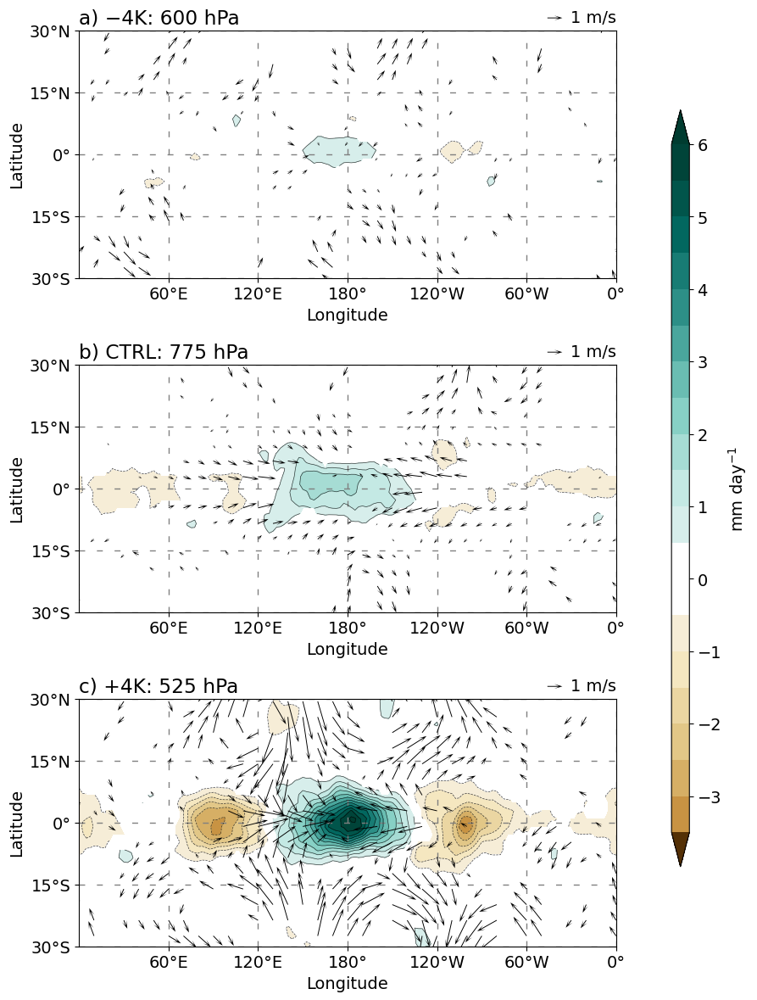

In [66]:
savefig = False
statistically_significant = True
fontsize = 14
plt.rcParams.update({'font.size':fontsize})
cmap = modified_colormap('BrBG', 'white', 0.05, 0.05)
cmap.set_bad('white')

longitude_bounds = {}
longitude_bounds['-4K'] = (30, 260)
longitude_bounds['0K'] = (30, 300)
longitude_bounds['4K'] = (60, 300)

latitude_bounds = {}
latitude_bounds['-4K'] = (-5, 5)
latitude_bounds['0K'] = (-10, 10)
latitude_bounds['4K'] = (-15, 15)

# plev_to_plot = {}
# plev_to_plot['-4K'] = 850
# plev_to_plot['0K'] = 775
# plev_to_plot['4K'] = 750
# plev_to_plot['-4K'] = 600
# plev_to_plot['0K'] = 650
# plev_to_plot['4K'] = 750

contourf_variable = 'Precipitation'
# contourf_variable = 'Moisture'
# contourf_variable = 'Meridional Moisture Advection'
# contour_variable = 'Vertical Advection'
# contour_variable = 'Column Water Vapor'
contour_variable = 'Precipitation'

contourf_scale = 1
contour_scale = 1
if data_type == 'regressed':
    if 'Moisture Advection' in contourf_variable:
        contourf_scale = 1000*SECONDS_PER_DAY
        # contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"
    elif 'Moisture' in contourf_variable:
        contourf_scale = 1000

    if 'Moisture Advection' in contour_variable:
        contour_scale = 1000*SECONDS_PER_DAY
        # contour_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"
    elif 'Moisture' in contour_variable:
        contour_scale = 1000

contourf_data = contourf_scale*multi_experiment_variables_regressed[contourf_variable].where(
     (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
)

contour_data = contour_scale*multi_experiment_variables_regressed[contour_variable].where(
    (multi_experiment_significant_indices[contour_variable] if statistically_significant else True)
)

#### Wind Variables
zonal_wind_data = multi_experiment_variables_regressed['Zonal Wind'].where(
    (multi_experiment_significant_indices['Zonal Wind'] if statistically_significant else True)
)
meridional_wind_data = multi_experiment_variables_regressed['Meridional Wind'].where(
    (multi_experiment_significant_indices['Meridional Wind'] if statistically_significant else True)
)

letter = ['a', 'b', 'c']

fig = plt.figure(figsize=(8, 12))
gs = GridSpec(3, 2, width_ratios=[30,1], height_ratios=[1,1,1], figure=fig)
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.35, wspace=0.2)

axes = []
axes.append(fig.add_subplot(gs[0,0]))
axes.append(fig.add_subplot(gs[1,0]))
axes.append(fig.add_subplot(gs[2,0]))
cbar_ax = fig.add_subplot(gs[:, 1])

for index, (ax, experiment) in enumerate(zip(axes, experiments_list)):

    ax.set_title(f"{letter[index]}) {experiments_array.sel(experiment=experiment)['name'].item()}: {plev_to_plot[experiment]} hPa", loc='left')
    ax.set_facecolor('white')

    grand_max = contourf_data.sel(
        **({'plev': [plev for plev in plev_to_plot.values()]} if 'plev' in contourf_data.coords else {})
    ).max()
    grand_min = contourf_data.sel(
        **({'plev': [plev for plev in plev_to_plot.values()]} if 'plev' in contourf_data.coords else {})
    ).min()

    data_order = min(
        np.floor(np.log10(np.abs(grand_min))),
        np.floor(np.log10(np.abs(grand_max)))
    )
    step = 1/2
    increment = 2
    levels = np.arange(
        round_out(grand_min, data_order+increment, step=step),
        round_out(grand_max, data_order+increment, step=step)+(10**data_order),
        (10**data_order)
    )
    index = 1
    while len(levels) < 15:
        levels = np.arange(
        round_out(grand_min, data_order+increment, step=step),
        round_out(grand_max, data_order+increment, step=step)+((10**data_order)/(2**index)),
        (10**data_order)/(2**index)
        )
        index += 1
    levels -= np.min(np.abs(levels))

    cdata, clon = cutil.add_cyclic_point(
            contourf_data.sel(experiment=experiment).sel(
                **({'plev': plev_to_plot[experiment]} if 'plev' in multi_experiment_variables_regressed[contourf_variable].coords else {})
            ),
            coord=contourf_data.lon,
        )

    # Plot data
    im = ax.contourf(
        clon,
        contourf_data.lat,
        cdata,
        cmap=cmap,
        levels=levels,
        norm=mcolors.CenteredNorm(vcenter=0),
        extend='both'
    )
    # Add colorbar
    cbar = fig.colorbar(
        im,
        cax=cbar_ax,
        label=contourf_data.attrs['units'],
        orientation="vertical",
    )
    cbar.ax.tick_params(labelsize=fontsize)

    if contour_variable != 'None':
        cq, clon = cutil.add_cyclic_point(
            contour_data.sel(experiment=experiment).sel(
                **({'plev': plev_to_plot[experiment]} if 'plev' in multi_experiment_variables_regressed[contour_variable].coords else {})
            ),
            coord=contour_data.lon,
        )

        cs = ax.contour(
            clon,
            contour_data.lat,
            cq,
            colors='black',
            levels=(im.levels[im.levels != 0] if contour_variable == contourf_variable else 11),
            linewidths=0.5,
            alpha=0.75
        )
        # ax.clabel(cs, inline=True, fontsize=6)

    # Add cyclic point
    cu, clon = cutil.add_cyclic_point(
        zonal_wind_data.sel(experiment=experiment, plev=plev_to_plot[experiment]),
        coord=zonal_wind_data.lon,
    )

    cv, clon = cutil.add_cyclic_point(
        meridional_wind_data.sel(experiment=experiment, plev=plev_to_plot[experiment]),
        coord=meridional_wind_data.lon,
    )

    lon_skip = 4
    lat_skip = 2
    # scale = 0.75
    scale = 0.1
    quiv = ax.quiver(
        clon[::lon_skip],
        zonal_wind_data.lat[::lat_skip],
        cu[::lat_skip, ::lon_skip],
        cv[::lat_skip, ::lon_skip],
        scale_units='xy',
        angles='xy',
        scale=scale,
        width=0.0015,
        headwidth=6,
        headlength=10,
        minlength=2,
        zorder=10,
        color='black'
    )
    scale_label = 1
    ax.quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')

    # Axis parameters
    ax.set_aspect("auto")

    ax.set_xlim(0, 360)
    x_ticks = np.arange(0, 360 + 60, 60)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(tick_labeller(x_ticks, "lon", precision=0))
    ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
    ax.set_xlabel("Longitude")

    ax.set_ylim(-30, 30)
    y_ticks = np.arange(-30, 45, 15)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(tick_labeller(y_ticks, "lat", precision=0))
    ax.set_ylabel("Latitude")

    grid_kwargs = {"linewidth": 1, "linestyle": (0, (5, 10)), "color": "gray"}
    ax.grid(True, **grid_kwargs)

    # ax.add_patch(
    #     patches.Rectangle(
    #         (longitude_bounds[experiment][0], latitude_bounds[experiment][0]),
    #         longitude_bounds[experiment][1]-longitude_bounds[experiment][0],
    #         latitude_bounds[experiment][1]-latitude_bounds[experiment][0],
    #         linewidth=1,
    #         edgecolor='k',
    #         facecolor='lightgray',
    #         alpha=0.25
    #     )
    # )


# if plev_to_plot != 'None':
#     # fig.suptitle(f"{plev_to_plot}-hPa {contourf_data.name} (colors) \n& {plev_to_plot}-hPa {contour_data.name} (contours) \n regressed onto {reference_variable}", y=1.025)
#     fig.suptitle(
#     (f"{plev_to_plot}-hPa {contourf_data.name} (colors), {plev_to_plot}-hPa {contour_data.name} (contours)" + (f"\n & Winds (vectors) " if data_type == 'regressed' else "\n ")
#     + f"{('regressed onto' if data_type == 'regressed' else 'correlated with')} Precipitation"),
#     x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#     ha='center',
#     y=1.025,
#     fontsize=16
#     )
# else:
#     # fig.suptitle(f"{contourf_data.name} (colors) \n& {contour_data.name} (contours) \n regressed onto {reference_variable}", y=1.025)
#     fig.suptitle(
#         (f"{contourf_data.name} (colors), {contour_data.name} (contours)" + (f"\n & Winds (vectors) " if data_type == 'regressed' else "\n ")
#         + f"{('regressed onto' if data_type == 'regressed' else 'correlated with')} Precipitation"),
#         x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#         ha='center',
#         y=1.025,
#         fontsize=16
#     )
# fig.suptitle(
#         (f"{contourf_data.name} (colors), {contour_data.name} (contours)" + (f"\n & Winds (vectors) " if data_type == 'regressed' else "\n ")
#         + f"{('regressed onto' if data_type == 'regressed' else 'correlated with')} Precipitation"),
#         x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#         ha='center',
#         y=1.025,
#         fontsize=16
#     )

# #### Set suptitle
# fig.suptitle(
#     (f"{contourf_data.name} (colors), {contour_data.name} (contours)" + (f"\n & Winds (vectors) " if data_type == 'regressed' else "\n ")
#     + f"{('regressed onto' if data_type == 'regressed' else 'correlated with')} Precipitation"),
#     x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#     ha='center',
#     y=1.025,
#     fontsize=16
# )

# fig.suptitle(
#     fig_title,
#     x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#     ha='center',
#     y=1.025
# )

# Save figure
output_filename = f"{contourf_variable.lower().replace(" ", "_")}_{reference_variable}_longitude_latitude"
print(f"Output directory: {aquaplanet_output_directory}")
print(f"Output filename: {output_filename}/regression_analysis")
if savefig:
    print(f"{f'Saving...':<{str_width-1}}", end="")
    plt.savefig(
        f"{aquaplanet_output_directory}/regression_analysis/{output_filename}.png",
        dpi=500,
        bbox_inches="tight",
    )
    print(rf"{'✔':>1}")
else:
    print("Not Saving")
    plt.show()

In [13]:
multi_experiment_variables_regressed['Precipitation'].max(dim=['lat', 'lon'])
# multi_experiment_variables_regressed['Column Water Vapor'].max(dim=['lat', 'lon'])
# multi_experiment_significant_indices = significant_regression_indices

<xarray.DataArray 'Precipitation' (experiment: 3)> Size: 24B
array([0.94786824, 1.87121412, 6.13435361])
Coordinates:
  * experiment  (experiment) <U3 36B '-4K' '0K' '4K'
Attributes:
    description:  Sum of large scale and convective precipitation
    units:        mm day$^{-1}$
    file_id:      PRCP
    short_name:   PRCP
    subset:       True

### Multiple reference variables

(upper, -4K) Colorbar captures all data? False
(upper, 0K) Colorbar captures all data? False
(upper, 4K) Colorbar captures all data? False
(lower, -4K) Colorbar captures all data? False
(lower, 0K) Colorbar captures all data? False
(lower, 4K) Colorbar captures all data? False
Output directory: /glade/u/home/sressel/thesis-work/python/aquaplanet_analysis/output/
Output file: /mjo_regressed_upper_level_moisture_QL_longitude_latitude
Not Saving


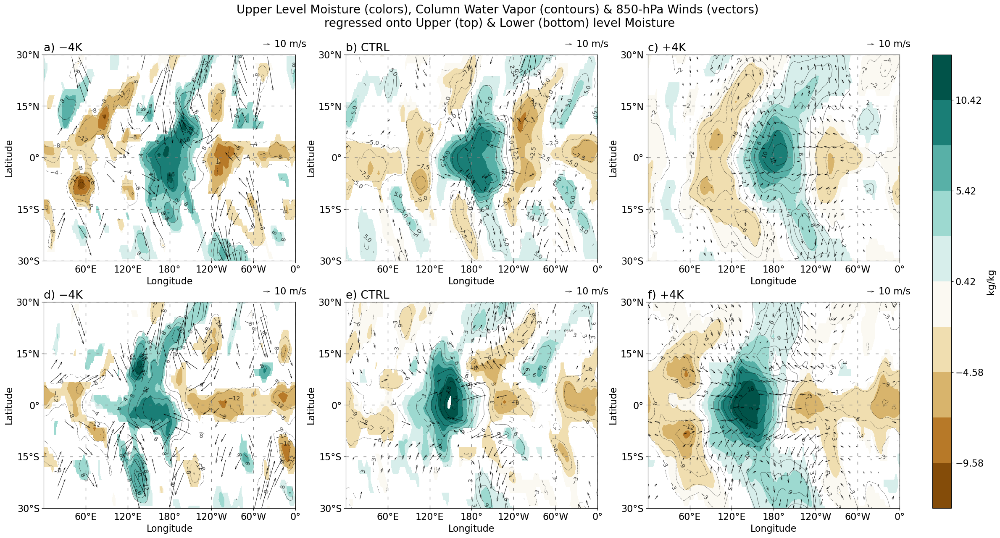

In [17]:
savefig = False
statistically_significant = True

longitude_bounds = {}
longitude_bounds['-4K'] = (30, 260)
longitude_bounds['0K'] = (30, 300)
longitude_bounds['4K'] = (60, 300)

latitude_bounds = {}
latitude_bounds['-4K'] = (-5, 5)
latitude_bounds['0K'] = (-10, 10)
latitude_bounds['4K'] = (-15, 15)

fontsize = 16
plt.style.use('default')
plt.rcParams.update({'font.size':fontsize})
fig = plt.figure(figsize=(24, 12))
gs_main = fig.add_gridspec(1, 2, width_ratios = [45, 1], wspace=0.075)
gs_main.update(left=0.05, right=0.95, bottom=0.05, top=0.95)
gs_axes = gs_main[0].subgridspec(2, 3)
gs_cbar = gs_main[1].subgridspec(1, 1)

axes = [[],[]]
axes[0].append(fig.add_subplot(gs_axes[0,0]))
axes[0].append(fig.add_subplot(gs_axes[0,1]))
axes[0].append(fig.add_subplot(gs_axes[0,2]))

axes[1].append(fig.add_subplot(gs_axes[1,0]))
axes[1].append(fig.add_subplot(gs_axes[1,1]))
axes[1].append(fig.add_subplot(gs_axes[1,2]))

# cbar_ax = fig.add_subplot(gs[:, 1])
# cbar_axes = []
cbar_axes = fig.add_subplot(gs_cbar[0])
# cbar_axes.append(fig.add_subplot(gs_cbar[1]))

data_type = 'regressed'
contour_variable = 'Column Water Vapor'
# contourf_variable = 'Evaporation'
contourf_variable = 'Upper Level Moisture'
plev_to_plot = 'None'
# plev_to_plot = 850

if data_type == 'regressed':
    #### Contourf variable
    if 'Moisture Advection' in contourf_variable:
        ### Advection Variables
        contourf_data = 1000*SECONDS_PER_DAY*multi_experiment_variables_regressed[contourf_variable].where(
             (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).sel(plev=plev_to_plot)
        contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"

    else:
        contourf_data = multi_experiment_variables_regressed[contourf_variable].where(
            (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_regressed[contourf_variable].coords else {})
        )

    #### Contour Variable
    if contour_variable != 'None':
        contour_data = multi_experiment_variables_regressed[contour_variable].where(
            (multi_experiment_significant_indices[contour_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_regressed[contour_variable].coords else {})
        )

    #### Wind Variables
    zonal_wind_data = multi_experiment_variables_regressed['Zonal Wind'].where(
        (multi_experiment_significant_indices['Zonal Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )
    meridional_wind_data = multi_experiment_variables_regressed['Meridional Wind'].where(
        (multi_experiment_significant_indices['Meridional Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )

elif data_type == 'correlated':
    #### Contourf variable
    contourf_data = multi_experiment_variables_correlated[contourf_variable].where(
            (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_correlated[contourf_variable].coords else {})
        )

    #### Contour Variable
    if contour_variable != 'None':
        contour_data = multi_experiment_variables_correlated[contour_variable].where(
            (multi_experiment_significant_indices[contour_variable] if statistically_significant else True)
        ).sel(
            **({'plev': plev_to_plot} if 'plev' in multi_experiment_variables_correlated[contour_variable].coords else {})
        )

    #### Wind Variables
    zonal_wind_data = multi_experiment_variables_correlated['Zonal Wind'].where(
        (multi_experiment_significant_indices['Zonal Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )
    meridional_wind_data = multi_experiment_variables_correlated['Meridional Wind'].where(
        (multi_experiment_significant_indices['Meridional Wind'] if statistically_significant else True)
    ).sel(
        **({'plev': plev_to_plot} if plev_to_plot != 'None' else {'plev': 850})
    )

if plev_to_plot != 'None':
    fig.suptitle(
        f"{plev_to_plot}-hPa {contourf_data.name} (colors), "
        + f"{(f'{plev_to_plot}-hPa ' if 'plev' in contour_data.dims else '')}{contour_data.name} (contours) "
        + (f" & {(f'{plev_to_plot}-hPa ' if 'plev' in contour_data.dims else '')}Winds (vectors) \n " if data_type == 'regressed' else "\n")
        + f"\n {('regressed onto' if data_type == 'regressed' else 'correlated with')} Upper (top) & Lower (bottom) level Moisture",
        y=1.05,
        fontsize=20
    )
else:
    fig.suptitle(
        f"{contourf_data.name} (colors), {contour_data.name} (contours)"
        + (f" & 850-hPa Winds (vectors)" if data_type == 'regressed' else "")
        + f"\n {('regressed onto' if data_type == 'regressed' else 'correlated with')} Upper (top) & Lower (bottom) level Moisture",
        y=1.05,
        fontsize=20
    )

letter = [['a', 'b', 'c'], ['d', 'e', 'f']]

for level_index, level in enumerate(multi_experiment_variables_regressed['Moisture'].level):
    for experiment_index, experiment in enumerate(experiments_list):

        axes[level_index][experiment_index].set_title(
            f"{letter[level_index][experiment_index]}) "
            + f"{experiments_array.sel(experiment=experiment)['name'].item()}",
            loc='left'
        )
        axes[level_index][experiment_index].set_facecolor('white')

        cdata, clon = cutil.add_cyclic_point(
            contourf_data.sel(experiment=experiment, level=level),
            coord=contourf_data.lon,
        )

        grand_max = contourf_data.max()
        grand_min = contourf_data.min()
        data_order = min(
            np.floor(np.log10(np.abs(grand_min))),
            np.floor(np.log10(np.abs(grand_max)))
        )

        if data_type == 'regressed':
            levels = np.arange(
                round_out(grand_min, data_order+1),
                round_out(grand_max, data_order+1)+10**data_order,
                10**data_order
            )
            index = 1
            while len(levels) < 11:
                levels = np.arange(
                round_out(grand_min, data_order+1),
                round_out(grand_max, data_order+1)+(10**data_order/2**index),
                10**data_order/2**index
                )
                index += 1
            levels -= np.min(np.abs(levels))
        else:
            magnitude_max = max(np.abs(grand_min), np.abs(grand_max))
            step=1/4
            increment = 0
            levels = np.arange(
                -round_out(magnitude_max, -data_order-increment),
                round_out(magnitude_max, -data_order-increment)+10**data_order,
                10**data_order
            )
            index = 1
            while len(levels) < 15:
                levels = np.arange(
                    -round_out(magnitude_max, -data_order-increment, step=step),
                    round_out(magnitude_max, -data_order-increment, step=step)+10**data_order/2**index,
                    10**data_order/2**index
                )
                index += 1

            levels -= levels[np.argmin(np.abs(levels))]

        data_captured = (grand_max.values < np.max(levels))*(grand_min.values > np.min(levels))
        print(f"({level.values}, {experiment}) Colorbar captures all data? {data_captured}")
        cmap = modified_colormap('BrBG', 'white', 0.05, 0.05)
        cmap.set_bad('white')
        # Plot data
        im = axes[level_index][experiment_index].contourf(
            clon,
            contourf_data.lat,
            cdata,
            cmap=cmap,
            # levels=levels,
            levels = levels,
            norm=mcolors.CenteredNorm(vcenter=0, halfrange=max(np.abs(grand_min.values), np.abs(grand_max.values))),
            # extend='both'
        )

        # Add colorbar
        cbar = fig.colorbar(
            im,
            # cax=cbar_axes[index],
            cax=cbar_axes,
            label=(contourf_data.attrs['units'] if data_type == 'regressed' else ''),
            orientation="vertical",
        )
        # cbar.set_ticks()
        cbar.ax.tick_params(labelsize=fontsize)

        if contour_variable != 'None':
            cq, clon = cutil.add_cyclic_point(
                contour_data.sel(experiment=experiment, level=level),
                coord=contour_data.lon,
            )

            cs = axes[level_index][experiment_index].contour(
                clon,
                contour_data.lat,
                cq,
                colors='black',
                levels=11,
                linewidths=0.5,
                alpha=0.75
            )
            ax.clabel(cs, inline=True, fontsize=10)

        if data_type == 'regressed':
            # Add cyclic point
            cu, clon = cutil.add_cyclic_point(
                zonal_wind_data.sel(experiment=experiment, level=level),
                coord=zonal_wind_data.lon,
            )

            cv, clon = cutil.add_cyclic_point(
                meridional_wind_data.sel(experiment=experiment, level=level),
                coord=meridional_wind_data.lon,
            )

            lon_skip = 4
            lat_skip = 2
            scale = 1
            quiv = axes[level_index][experiment_index].quiver(
                clon[::lon_skip],
                zonal_wind_data.lat[::lat_skip],
                cu[::lat_skip, ::lon_skip],
                cv[::lat_skip, ::lon_skip],
                # width=0.00125,
                scale_units='xy',
                angles='xy',
                scale=scale,
                width=0.0015,
                headwidth=6,
                headlength=10,
                minlength=2,
                zorder=10,
                color='black'
            )
            scale_label = 10
            axes[level_index][experiment_index].quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')

        # if reference_point is not None:
        #     ax.plot(reference_point[0], reference_point[1].sel(experiment=experiment), marker='x', ms=14, color='k')

        for ax in axes[level_index]:
            # Axis parameters
            ax.set_aspect("auto")

            # if experiment == '-4K':
            #     rect = patches.Rectangle((0, -5), 300, 10, linewidth=1, edgecolor='k')

            ax.set_xlim(0, 360)
            x_ticks = np.arange(0, 360 + 60, 60)
            ax.set_xticks(x_ticks)
            ax.set_xticklabels(tick_labeller(x_ticks, "lon", precision=0))
            ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
            ax.set_xlabel("Longitude")

            ax.set_ylim(-30, 30)
            y_ticks = np.arange(-30, 45, 15)
            ax.set_yticks(y_ticks)
            ax.set_yticklabels(tick_labeller(y_ticks, "lat", precision=0))
            ax.set_ylabel("Latitude")

            grid_kwargs = {"linewidth": 1, "linestyle": (0, (5, 10)), "color": "gray"}
            ax.grid(True, **grid_kwargs)

        # ax.add_patch(
        #     patches.Rectangle(
        #         (longitude_bounds[experiment][0], latitude_bounds[experiment][0]),
        #         longitude_bounds[experiment][1]-longitude_bounds[experiment][0],
        #         latitude_bounds[experiment][1]-latitude_bounds[experiment][0],
        #         linewidth=1,
        #         edgecolor='k',
        #         facecolor='lightgray',
        #         alpha=0.25
        #     )
        # )

# fig.suptitle(
#     fig_title,
#     x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#     ha='center',
#     y=1.025
# )

output_filename = (
    f"/mjo_{data_type}_"
    + f"{(f"{plev_to_plot}-hPa-" if plev_to_plot != 'None' else '')}{contourf_variable.lower().replace(" ", "_")}"
    + f"_{reference_variable}_longitude_latitude"
)
print(f"Output directory: {aquaplanet_output_directory}")
print(f"Output file: {output_filename}")
if savefig:
    print(f"{f'Saving...':<{str_width-1}}", end="")
    plt.savefig(
        f"{aquaplanet_output_directory}/{output_filename}.png",
        dpi=500,
        bbox_inches="tight"
    )
    print(rf"{'✔':>1}")
else:
    print("Not Saving")
    plt.show()

In [ ]:
# output_directory = f"/glade/u/home/sressel/aquaplanet_analysis/output/"
# savefig=False

# plt.style.use("default")
# plt.rcParams.update({"font.size": 24})

# variables_to_plot = [
#     multi_experiment_variables_regressed['precipitation'.title()],
#     multi_experiment_variables_regressed['outgoing longwave radiation'.title()],
#     multi_experiment_variables_regressed['zonal wind'.title()].sel(plev=200),
#     multi_experiment_variables_regressed['zonal wind'.title()].sel(plev=850),
#     multi_experiment_variables_regressed['vertical wind'.title()].sel(plev=500),
#     # multi_experiment_variables_regressed['column temperature'.title()],
#     # multi_experiment_variables_regressed['column water vapor'.title()],
#     multi_experiment_variables_regressed['moist static energy'.title()].sel(plev=850),
#     # multi_experiment_variables_regressed['column longwave heating'.title()],
#     # multi_experiment_variables_regressed['column shortwave heating'.title()],
#     multi_experiment_variables_regressed['latent heat flux'.title()],
#     multi_experiment_variables_regressed['sensible heat flux'.title()],
# ]

# # print(f'{f"Regressions onto PC {regression_PC}":^{str_width}}')
# print(f"{'='*str_width}")
# for variable_data in variables_to_plot:
#     grand_max = variable_data.max()
#     grand_min = variable_data.min()

#     fig = plt.figure(figsize=(16, 12))
#     gs = GridSpec(3, 2, width_ratios=[30,1], height_ratios=[1,1,1], figure=fig)
#     gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.2, wspace=0.1)

#     axes = []
#     axes.append(fig.add_subplot(gs[0,0]))
#     axes.append(fig.add_subplot(gs[1,0]))
#     axes.append(fig.add_subplot(gs[2,0]))
#     cb_ax = fig.add_subplot(gs[:, 1])

#     for ax, experiment in zip(axes, experiments_list):
#         ax.set_title(f"{experiment}")

#         # Add cyclic point
#         cdata, clon = cutil.add_cyclic_point(
#             variable_data.sel(experiment=experiment),
#             coord=variable_data.lon,
#         )

#         # Plot data
#         im = ax.contourf(
#             clon,
#             variable_data.lat,
#             cdata,
#             levels=np.linspace(grand_min, grand_max, 21),
#             norm=mcolors.CenteredNorm(vcenter=0),
#             **{k: copy.deepcopy(v) for k, v in {
#                 # "norm": plotting_attributes[variable_data.name].get("norm"),
#                 "cmap": plotting_attributes[variable_data.name].get("d_cmap")
#             }.items() if v is not None}
#         )

#         # Add colorbar
#         cbar = fig.colorbar(
#             im,
#             cax=cb_ax,
#             label=variable_data.attrs['units'],
#             orientation="vertical",
#         )
#         cbar.ax.tick_params(labelsize=20)

#         ax.plot(reference_longitude, reference_latitude.sel(experiment=experiment), marker='x', color='k', ms=14)

#         # Axis parameters
#         ax.set_aspect("equal")

#         ax.set_xlim(0, 360)
#         x_ticks = np.arange(0, 360 + 60, 60)
#         ax.set_xticks(x_ticks)
#         ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
#         ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
#         ax.set_xlabel("Longitude")

#         ax.set_ylim(-30, 30)
#         y_ticks = np.arange(-30, 45, 15)
#         ax.set_yticks(y_ticks)
#         ax.set_yticklabels(tick_labeller(y_ticks, "lat"))
#         ax.set_ylabel("Latitude")

#         grid_kwargs = {"linewidth": 1, "linestyle": (0, (5, 10)), "color": "gray"}
#         ax.grid(True, **grid_kwargs)

#     fig.suptitle(
#         (
#             f"{(' ' + (str(variable_data.plev.values) + '-hPa') if 'plev' in variable_data.coords else '')}"
#             + f" {variable_data.name} regressed onto \n{regression_variable}{(regression_index+1 if regression_variable == 'PCs' else '')}"
#         ),
#         x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#         ha='center',
#         y=1.025
#     )

#     if not savefig:
#         plt.show()
#     else:
#         save_string = (
#             f"multi-experiment_{variable_data.attrs['file_id']}"
#           + f"{((str(variable_data.plev.values)) if 'plev' in variable_data.coords else '')}"
#           + f"_regressed-on-{regression_variable.replace(' ', '-')}{(regression_index+1 if regression_variable == 'PCs' else '')}"
#           + f".png"
#             )
#         print(
#             f"Saving {(' ' + (str(variable_data.plev.values) + '-hPa') if 'plev' in variable_data.coords else '')} {variable_data.name} plot as {save_string}"
#         )
#         plt.savefig(
#             f"{output_directory}/regressions/latitude-longitude/{save_string}",
#             dpi=500,
#             bbox_inches="tight",
#         )

# print(f"{'='*40}")
# print("Finished")

## Longitude-Height

### Single reference variable

Output directory: /glade/u/home/sressel/thesis-work/python/aquaplanet_analysis/output/
Output file: /mjo_regressed_moisture_Precipitation_longitude_height
Not Saving


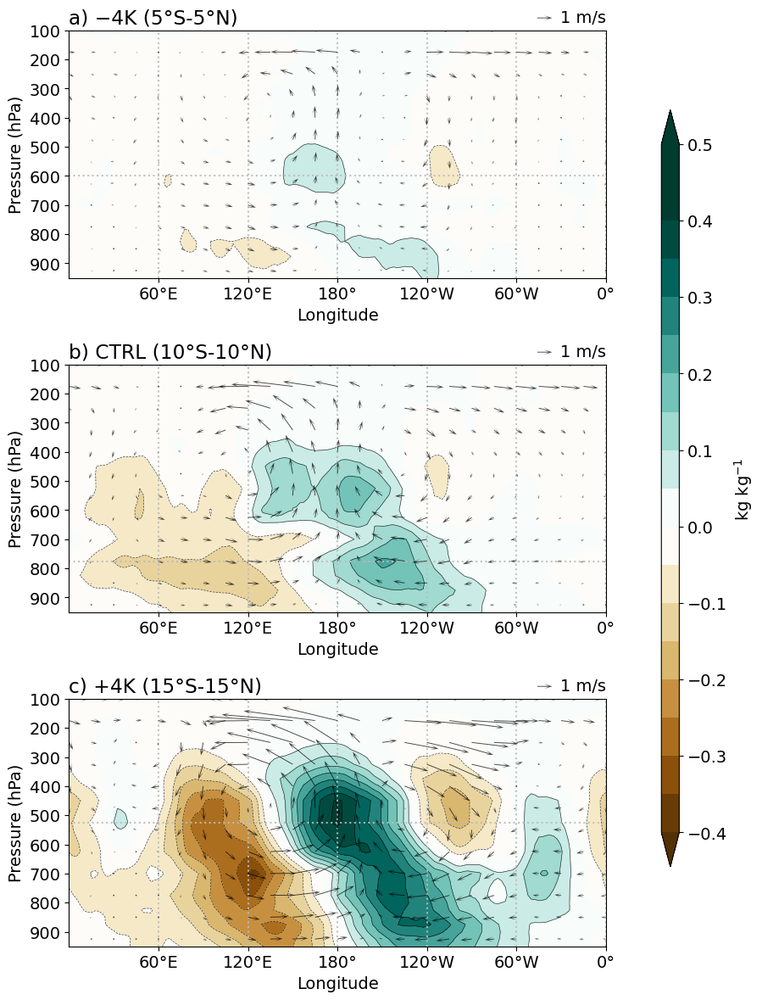

In [62]:
savefig = False
statistically_significant = False

longitude_bounds = {}
# longitude_bounds['-4K'] = (30, 260)
# longitude_bounds['0K'] = (30, 300)
# longitude_bounds['4K'] = (60, 300)

latitude_bounds = {}
latitude_bounds['-4K'] = (-5, 5)
latitude_bounds['0K'] = (-10, 10)
latitude_bounds['4K'] = (-15, 15)

# plev_to_plot = {}
# plev_to_plot['-4K'] = 600
# plev_to_plot['0K'] = 650
# plev_to_plot['4K'] = 750

plev_to_plot = level_of_max_moisture

# cbar_axes = []
# cbar_axes.append(fig.add_subplot(gs[0,-1]))
# cbar_axes.append(fig.add_subplot(gs[1,-1]))
# cbar_axes.append(fig.add_subplot(gs[2,-1]))

# contourf_data = 1000*SECONDS_PER_DAY*multi_experiment_variables_regressed['Vertical Moisture Advection'].transpose("experiment", "lat", "lon", "plev")
# contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"

# contourf_variable = 'Meridional Moisture Advection'
contourf_variable = 'Moisture'
contour_variable = 'Moisture'

contourf_scale = 1
contour_scale = 1
if data_type == 'regressed':
    if 'Moisture Advection' in contourf_variable:
        contourf_scale = 1000*SECONDS_PER_DAY
        # contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"
    elif 'Moisture' in contourf_variable:
        contourf_scale = 1000

    if 'Moisture Advection' in contour_variable:
        contour_scale = 1000*SECONDS_PER_DAY
        # contour_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"
    elif 'Moisture' in contour_variable:
        contour_scale = 1000

contourf_data = contourf_scale*multi_experiment_variables_regressed[contourf_variable]
# contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"
contour_data = contour_scale*multi_experiment_variables_regressed[contour_variable]
contour_data.attrs['units'] = r"g kg$^{-1}$"

meridional_mean_contourf_data_by_experiment = []
meridional_mean_contour_data_by_experiment = []
meridional_mean_zonal_wind_by_experiment = []
meridional_mean_vertical_wind_by_experiment = []

# Take a meridional mean over the specified domain
if not statistically_significant:
    for experiment in experiments_list:
        meridional_mean_contourf_data_by_experiment.append(
            contourf_data.sel(
                experiment=experiment
            ).sel(
                lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
        )

        meridional_mean_contour_data_by_experiment.append(
            contour_data.sel(
                experiment=experiment
            ).sel(
                lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
        )

        meridional_mean_zonal_wind_by_experiment.append(
            multi_experiment_variables_regressed['Zonal Wind'].sel(
                experiment=experiment
            ).sel(
                lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
        )
        meridional_mean_vertical_wind_by_experiment.append(
            multi_experiment_variables_regressed['Vertical Wind'].sel(
                experiment=experiment
            ).sel(
                lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
        )

meridional_mean_contourf_data = xr.concat(
    meridional_mean_contourf_data_by_experiment,
    dim=experiments_array
)

meridional_mean_contour_data = xr.concat(
    meridional_mean_contour_data_by_experiment,
    dim=experiments_array
)

meridional_mean_zonal_wind = xr.concat(
    meridional_mean_zonal_wind_by_experiment,
    dim=experiments_array
)
meridional_mean_vertical_wind = xr.concat(
    meridional_mean_vertical_wind_by_experiment,
    dim=experiments_array
)

# rescaled_meridional_mean_zonal_wind = meridional_mean_zonal_wind / meridional_mean_zonal_wind.std(dim=['plev', 'lon'])
# rescaled_meridional_mean_vertical_wind = meridional_mean_vertical_wind / meridional_mean_vertical_wind.std(dim=['plev', 'lon'])

rescaled_meridional_mean_zonal_wind = meridional_mean_zonal_wind
rescaled_meridional_mean_vertical_wind = (3600/10)*meridional_mean_vertical_wind

letter = ['a', 'b', 'c']

fontsize = 14
plt.rcParams.update({'font.size':fontsize})
fig = plt.figure(figsize=(8, 12))
gs = GridSpec(3, 2, width_ratios=[30,1], height_ratios=[1,1,1], figure=fig)
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.35, wspace=0.2)

axes = []
axes.append(fig.add_subplot(gs[0,0]))
axes.append(fig.add_subplot(gs[1,0]))
axes.append(fig.add_subplot(gs[2,0]))
cbar_ax = fig.add_subplot(gs[:, 1])

grand_max = meridional_mean_contourf_data.max()
grand_min = meridional_mean_contourf_data.min()
data_order = min(
    np.floor(np.log10(np.abs(grand_min))),
    np.floor(np.log10(np.abs(grand_max)))
)
step = 1
increment = 2
levels = np.arange(
    round_out(grand_min, data_order+increment, step=step),
    round_out(grand_max, data_order+increment, step=step)+(10**data_order),
    (10**data_order)
)
index = 1
while len(levels) < 18:
    levels = np.arange(
    round_out(grand_min, data_order+increment, step=step),
    round_out(grand_max, data_order+increment, step=step)+((10**data_order)/(2**index)),
    (10**data_order)/(2**index)
    )
    index += 1
# levels -= np.min(np.abs(levels))
levels -= np.sign(levels[np.argmin(np.abs(levels))])*np.min(np.abs(levels))

for index, (ax, experiment) in enumerate(zip(axes, experiments_list)):

    ax.set_title(
        f"{letter[index]}) {experiments_array.sel(experiment=experiment)['name'].item()}"
        + f" ({tick_labeller(latitude_bounds[experiment], 'lat', precision=0)[0]}"
        + f"-{tick_labeller(latitude_bounds[experiment], 'lat', precision=0)[1]})",
        loc='left'
    )

    contourf_cdata, clon = cutil.add_cyclic_point(
        meridional_mean_contourf_data.sel(experiment=experiment).T,
        coord=meridional_mean_contourf_data.lon,
    )

    # Plot data
    im = ax.contourf(
        clon,
        meridional_mean_contourf_data.plev,
        contourf_cdata,
        cmap=modified_colormap('BrBG', 'white', 0.05, 0.05),
        levels=levels,
        norm=mcolors.CenteredNorm(
            vcenter=0,
            halfrange=max(np.abs(grand_min.values),
                          np.abs(grand_max.values))
        ),
        extend='both'
    )
    # Add colorbar
    cbar = fig.colorbar(
        im,
        # cax=cbar_axes[index],
        cax=cbar_ax,
        label=meridional_mean_contourf_data.attrs['units'],
        orientation="vertical",
    )
    cbar.ax.tick_params(labelsize=fontsize)

    contour_cdata, clon = cutil.add_cyclic_point(
        meridional_mean_contour_data.sel(experiment=experiment).T,
        coord=meridional_mean_contour_data.lon,
    )

    cs = ax.contour(
        clon,
        meridional_mean_contour_data.plev,
        contour_cdata,
        colors='black',
        levels=(im.levels[im.levels != 0] if contour_variable == contourf_variable else 11),
        linewidths=0.5,
        alpha=0.75
    )
    # ax.clabel(cs, inline=True, fontsize=10)

    cu, clon = cutil.add_cyclic_point(
        rescaled_meridional_mean_zonal_wind.sel(experiment=experiment).T,
        coord=meridional_mean_zonal_wind.lon,
    )

    comega, clon = cutil.add_cyclic_point(
        rescaled_meridional_mean_vertical_wind.sel(experiment=experiment).T,
        coord=meridional_mean_vertical_wind.lon,
    )

    lon_spacing = 6
    height_spacing = 3
    # scale = 0.5
    scale = 0.1
    quiv = ax.quiver(
        clon[::lon_spacing],
        meridional_mean_vertical_wind.plev[::height_spacing],
        cu[::height_spacing, ::lon_spacing],
        comega[::height_spacing, ::lon_spacing],
        scale_units='xy',
        angles='xy',
        scale=scale,
        width=0.0015,
        headwidth=6,
        headlength=10,
        minlength=2,
        zorder=10,
        color='black',
        alpha=0.7
    )
    scale_label = 1
    ax.quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')

    # Axis parameters
    ax.set_aspect("auto")

    ax.set_xlim(0, 360)
    x_ticks = np.arange(0, 360 + 60, 60)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(tick_labeller(x_ticks, "lon", precision=0))
    ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
    ax.set_xlabel("Longitude")

    ax.set_ylim(100, 950)
    ax.set_yticks(np.arange(100, 1000, 100))
    ax.set_ylabel("Pressure (hPa)")
    ax.invert_yaxis()

    [ax.axvline(x=tick, color='#bcbcbc', alpha=0.9, ls=':') for tick in x_ticks]
    ax.axhline(y=plev_to_plot[experiment], color='#bcbcbc', alpha=0.9, ls=':')

#### Set suptitle
# fig.suptitle(
#     (f"{contourf_data.name} (colors), {contour_data.name} (contours)" + (f"\n & Winds (vectors) " if data_type == 'regressed' else "\n ")
#     + f"{('regressed onto' if data_type == 'regressed' else 'correlated with')} Precipitation"),
#     x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
#     ha='center',
#     y=1.025,
#     fontsize=16
# )

output_filename = (
    f"/mjo_{data_type}_"
    + f"{contourf_variable.lower().replace(" ", "_")}"
    + f"_{reference_variable}_longitude_height"
)
print(f"Output directory: {aquaplanet_output_directory}")
print(f"Output file: {output_filename}")
if savefig:
    print(f"{f'Saving...':<{str_width-1}}", end="")
    plt.savefig(
        f"{aquaplanet_output_directory}/{output_filename}.png",
        dpi=500,
        bbox_inches="tight"
    )
    print(rf"{'✔':>1}")
else:
    print("Not Saving")
    plt.show()

Output directory: /glade/u/home/sressel/thesis-work/python/aquaplanet_analysis/output/
Output filename: moisture_Precipitation_longitude_latitude/regression_analysis
Not Saving


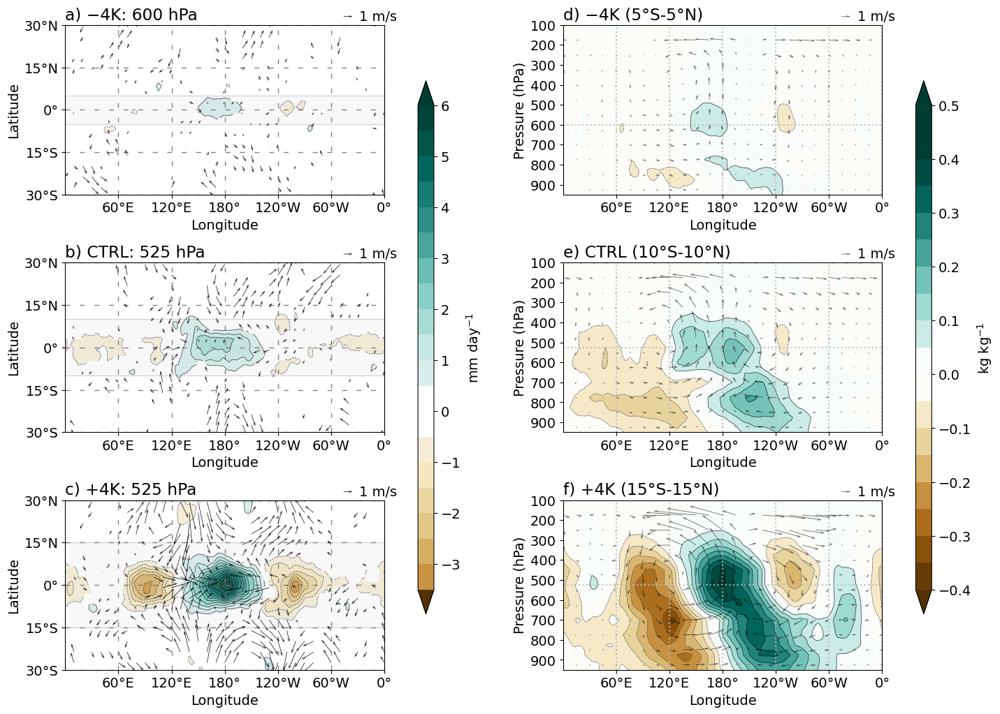

In [97]:
savefig = False
statistically_significant = True
fontsize = 14
plt.rcParams.update({'font.size':fontsize})
cmap = modified_colormap('BrBG', 'white', 0.05, 0.05)
cmap.set_bad('white')

longitude_bounds = {}
longitude_bounds['-4K'] = (30, 260)
longitude_bounds['0K'] = (30, 300)
longitude_bounds['4K'] = (60, 300)

latitude_bounds = {}
latitude_bounds['-4K'] = (-5, 5)
latitude_bounds['0K'] = (-10, 10)
latitude_bounds['4K'] = (-15, 15)

# plev_to_plot = {}
# plev_to_plot['-4K'] = 850
# plev_to_plot['0K'] = 775
# plev_to_plot['4K'] = 750
# plev_to_plot['-4K'] = 600
# plev_to_plot['0K'] = 650
# plev_to_plot['4K'] = 750

contourf_variable = 'Precipitation'
# contourf_variable = 'Moisture'
# contourf_variable = 'Meridional Moisture Advection'
# contour_variable = 'Vertical Advection'
# contour_variable = 'Column Water Vapor'
contour_variable = 'Precipitation'

contourf_scale = 1
contour_scale = 1
if data_type == 'regressed':
    if 'Moisture Advection' in contourf_variable:
        contourf_scale = 1000*SECONDS_PER_DAY
        # contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"
    elif 'Moisture' in contourf_variable:
        contourf_scale = 1000

    if 'Moisture Advection' in contour_variable:
        contour_scale = 1000*SECONDS_PER_DAY
        # contour_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"
    elif 'Moisture' in contour_variable:
        contour_scale = 1000

contourf_data = contourf_scale*multi_experiment_variables_regressed[contourf_variable].where(
     (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
)

contour_data = contour_scale*multi_experiment_variables_regressed[contour_variable].where(
    (multi_experiment_significant_indices[contour_variable] if statistically_significant else True)
)

#### Wind Variables
zonal_wind_data = multi_experiment_variables_regressed['Zonal Wind'].where(
    (multi_experiment_significant_indices['Zonal Wind'] if statistically_significant else True)
)
meridional_wind_data = multi_experiment_variables_regressed['Meridional Wind'].where(
    (multi_experiment_significant_indices['Meridional Wind'] if statistically_significant else True)
)

letter = ['a', 'b', 'c']

fig = plt.figure(figsize=(16, 12))
gs_main = fig.add_gridspec(1, 2, width_ratios=[1,1], wspace=0.35)
gs_left = gs_main[0].subgridspec(3, 2, width_ratios=[20,1], wspace=0.2, hspace=0.4)
gs_right = gs_main[1].subgridspec(3, 2, width_ratios=[20,1], wspace=0.2, hspace=0.4)

# gs = GridSpec(3, 4, width_ratios=[30, 1, 30, 1], height_ratios=[1,1,1], figure=fig)
# gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.35, wspace=0.3)

axes = []
axes.append(fig.add_subplot(gs_left[0,0]))
axes.append(fig.add_subplot(gs_left[1,0]))
axes.append(fig.add_subplot(gs_left[2,0]))
axes.append(fig.add_subplot(gs_right[0,0]))
axes.append(fig.add_subplot(gs_right[1,0]))
axes.append(fig.add_subplot(gs_right[2,0]))
cbar_ax = []
cbar_ax.append(fig.add_subplot(gs_left[:, -1]))
cbar_ax.append(fig.add_subplot(gs_right[:, -1]))

for index, (ax, experiment) in enumerate(zip(axes[:3], experiments_list)):

    ax.set_title(f"{letter[index]}) {experiments_array.sel(experiment=experiment)['name'].item()}: {plev_to_plot[experiment]} hPa", loc='left')
    ax.set_facecolor('white')

    grand_max = contourf_data.sel(
        **({'plev': [plev for plev in plev_to_plot.values()]} if 'plev' in contourf_data.coords else {})
    ).max()
    grand_min = contourf_data.sel(
        **({'plev': [plev for plev in plev_to_plot.values()]} if 'plev' in contourf_data.coords else {})
    ).min()

    data_order = min(
        np.floor(np.log10(np.abs(grand_min))),
        np.floor(np.log10(np.abs(grand_max)))
    )
    step = 1/2
    increment = 2
    levels = np.arange(
        round_out(grand_min, data_order+increment, step=step),
        round_out(grand_max, data_order+increment, step=step)+(10**data_order),
        (10**data_order)
    )
    index = 1
    while len(levels) < 15:
        levels = np.arange(
        round_out(grand_min, data_order+increment, step=step),
        round_out(grand_max, data_order+increment, step=step)+((10**data_order)/(2**index)),
        (10**data_order)/(2**index)
        )
        index += 1
    # levels -= np.min(np.abs(levels))
    levels -= np.sign(levels[np.argmin(np.abs(levels))])*np.min(np.abs(levels))

    cdata, clon = cutil.add_cyclic_point(
            contourf_data.sel(experiment=experiment).sel(
                **({'plev': plev_to_plot[experiment]} if 'plev' in multi_experiment_variables_regressed[contourf_variable].coords else {})
            ),
            coord=contourf_data.lon,
        )

    # Plot data
    im = ax.contourf(
        clon,
        contourf_data.lat,
        cdata,
        cmap=cmap,
        levels=levels,
        norm=mcolors.CenteredNorm(vcenter=0),
        extend='both'
    )
    # Add colorbar
    cbar = fig.colorbar(
        im,
        cax=cbar_ax[0],
        label=contourf_data.attrs['units'],
        orientation="vertical",
    )
    cbar.ax.tick_params(labelsize=fontsize)

    if contour_variable != 'None':
        cq, clon = cutil.add_cyclic_point(
            contour_data.sel(experiment=experiment).sel(
                **({'plev': plev_to_plot[experiment]} if 'plev' in multi_experiment_variables_regressed[contour_variable].coords else {})
            ),
            coord=contour_data.lon,
        )

        cs = ax.contour(
            clon,
            contour_data.lat,
            cq,
            colors='black',
            levels=(im.levels[im.levels != 0] if contour_variable == contourf_variable else 11),
            linewidths=0.5,
            alpha=0.75
        )
        # ax.clabel(cs, inline=True, fontsize=6)

    # Add cyclic point
    cu, clon = cutil.add_cyclic_point(
        zonal_wind_data.sel(experiment=experiment, plev=plev_to_plot[experiment]),
        coord=zonal_wind_data.lon,
    )

    cv, clon = cutil.add_cyclic_point(
        meridional_wind_data.sel(experiment=experiment, plev=plev_to_plot[experiment]),
        coord=meridional_wind_data.lon,
    )

    lon_skip = 4
    lat_skip = 2
    # scale = 0.75
    scale = 0.1
    quiv = ax.quiver(
        clon[::lon_skip],
        zonal_wind_data.lat[::lat_skip],
        cu[::lat_skip, ::lon_skip],
        cv[::lat_skip, ::lon_skip],
        scale_units='xy',
        angles='xy',
        scale=scale,
        width=0.0015,
        headwidth=6,
        headlength=10,
        minlength=2,
        zorder=10,
        color='black'
    )
    scale_label = 1
    ax.quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')

    # Axis parameters
    ax.set_aspect("auto")

    ax.set_xlim(0, 360)
    x_ticks = np.arange(0, 360 + 60, 60)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(tick_labeller(x_ticks, "lon", precision=0))
    ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
    ax.set_xlabel("Longitude")

    ax.set_ylim(-30, 30)
    y_ticks = np.arange(-30, 45, 15)
    ax.set_yticks(y_ticks)
    ax.set_yticklabels(tick_labeller(y_ticks, "lat", precision=0))
    ax.set_ylabel("Latitude")

    grid_kwargs = {"linewidth": 1, "linestyle": (0, (5, 10)), "color": "gray"}
    ax.grid(True, **grid_kwargs)

    # ax.add_patch(
    #     patches.Rectangle(
    #         (longitude_bounds[experiment][0], latitude_bounds[experiment][0]),
    #         longitude_bounds[experiment][1]-longitude_bounds[experiment][0],
    #         latitude_bounds[experiment][1]-latitude_bounds[experiment][0],
    #         linewidth=1,
    #         edgecolor='k',
    #         facecolor='lightgray',
    #         alpha=0.25
    #     )
    # )
    ax.add_patch(
            patches.Rectangle(
                (0, latitude_bounds[experiment][0]),
                360,
                latitude_bounds[experiment][1]-latitude_bounds[experiment][0],
                linewidth=1,
                edgecolor='k',
                facecolor='lightgray',
                alpha=0.15
            )
        )


letter = ['d', 'e', 'f']

contourf_variable = 'Moisture'
contour_variable = 'Moisture'

contourf_scale = 1
contour_scale = 1
if data_type == 'regressed':
    if 'Moisture Advection' in contourf_variable:
        contourf_scale = 1000*SECONDS_PER_DAY
        # contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"
    elif 'Moisture' in contourf_variable:
        contourf_scale = 1000

    if 'Moisture Advection' in contour_variable:
        contour_scale = 1000*SECONDS_PER_DAY
        # contour_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"
    elif 'Moisture' in contour_variable:
        contour_scale = 1000

contourf_data = contourf_scale*multi_experiment_variables_regressed[contourf_variable]
# contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"
contour_data = contour_scale*multi_experiment_variables_regressed[contour_variable]
contour_data.attrs['units'] = r"g kg$^{-1}$"

meridional_mean_contourf_data_by_experiment = []
meridional_mean_contour_data_by_experiment = []
meridional_mean_zonal_wind_by_experiment = []
meridional_mean_vertical_wind_by_experiment = []

statistically_significant = False

# Take a meridional mean over the specified domain
if not statistically_significant:
    for experiment in experiments_list:
        meridional_mean_contourf_data_by_experiment.append(
            contourf_data.sel(
                experiment=experiment
            ).sel(
                lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
        )

        meridional_mean_contour_data_by_experiment.append(
            contour_data.sel(
                experiment=experiment
            ).sel(
                lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
        )

        meridional_mean_zonal_wind_by_experiment.append(
            multi_experiment_variables_regressed['Zonal Wind'].sel(
                experiment=experiment
            ).sel(
                lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
        )
        meridional_mean_vertical_wind_by_experiment.append(
            multi_experiment_variables_regressed['Vertical Wind'].sel(
                experiment=experiment
            ).sel(
                lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
        )

meridional_mean_contourf_data = xr.concat(
    meridional_mean_contourf_data_by_experiment,
    dim=experiments_array
)

meridional_mean_contour_data = xr.concat(
    meridional_mean_contour_data_by_experiment,
    dim=experiments_array
)

meridional_mean_zonal_wind = xr.concat(
    meridional_mean_zonal_wind_by_experiment,
    dim=experiments_array
)
meridional_mean_vertical_wind = xr.concat(
    meridional_mean_vertical_wind_by_experiment,
    dim=experiments_array
)

# rescaled_meridional_mean_zonal_wind = meridional_mean_zonal_wind / meridional_mean_zonal_wind.std(dim=['plev', 'lon'])
# rescaled_meridional_mean_vertical_wind = meridional_mean_vertical_wind / meridional_mean_vertical_wind.std(dim=['plev', 'lon'])

rescaled_meridional_mean_zonal_wind = meridional_mean_zonal_wind
rescaled_meridional_mean_vertical_wind = (3600/10)*meridional_mean_vertical_wind

grand_max = meridional_mean_contourf_data.max()
grand_min = meridional_mean_contourf_data.min()
data_order = min(
    np.floor(np.log10(np.abs(grand_min))),
    np.floor(np.log10(np.abs(grand_max)))
)
step = 1
increment = 2
levels = np.arange(
    round_out(grand_min, data_order+increment, step=step),
    round_out(grand_max, data_order+increment, step=step)+(10**data_order),
    (10**data_order)
)
index = 1
while len(levels) < 18:
    levels = np.arange(
    round_out(grand_min, data_order+increment, step=step),
    round_out(grand_max, data_order+increment, step=step)+((10**data_order)/(2**index)),
    (10**data_order)/(2**index)
    )
    index += 1
# levels -= np.min(np.abs(levels))
levels -= np.sign(levels[np.argmin(np.abs(levels))])*np.min(np.abs(levels))

for index, (ax, experiment) in enumerate(zip(axes[3:], experiments_list)):

    ax.set_title(
        f"{letter[index]}) {experiments_array.sel(experiment=experiment)['name'].item()}"
        + f" ({tick_labeller(latitude_bounds[experiment], 'lat', precision=0)[0]}"
        + f"-{tick_labeller(latitude_bounds[experiment], 'lat', precision=0)[1]})",
        loc='left'
    )

    contourf_cdata, clon = cutil.add_cyclic_point(
        meridional_mean_contourf_data.sel(experiment=experiment).T,
        coord=meridional_mean_contourf_data.lon,
    )

    # Plot data
    im = ax.contourf(
        clon,
        meridional_mean_contourf_data.plev,
        contourf_cdata,
        cmap=modified_colormap('BrBG', 'white', 0.05, 0.05),
        levels=levels,
        norm=mcolors.CenteredNorm(
            vcenter=0,
            halfrange=max(np.abs(grand_min.values),
                          np.abs(grand_max.values))
        ),
        extend='both'
    )
    # Add colorbar
    cbar = fig.colorbar(
        im,
        # cax=cbar_axes[index],
        cax=cbar_ax[1],
        label=meridional_mean_contourf_data.attrs['units'],
        orientation="vertical",
    )
    cbar.ax.tick_params(labelsize=fontsize)

    contour_cdata, clon = cutil.add_cyclic_point(
        meridional_mean_contour_data.sel(experiment=experiment).T,
        coord=meridional_mean_contour_data.lon,
    )

    cs = ax.contour(
        clon,
        meridional_mean_contour_data.plev,
        contour_cdata,
        colors='black',
        levels=(im.levels[im.levels != 0] if contour_variable == contourf_variable else 11),
        linewidths=0.5,
        alpha=0.75
    )
    # ax.clabel(cs, inline=True, fontsize=10)

    cu, clon = cutil.add_cyclic_point(
        rescaled_meridional_mean_zonal_wind.sel(experiment=experiment).T,
        coord=meridional_mean_zonal_wind.lon,
    )

    comega, clon = cutil.add_cyclic_point(
        rescaled_meridional_mean_vertical_wind.sel(experiment=experiment).T,
        coord=meridional_mean_vertical_wind.lon,
    )

    lon_spacing = 6
    height_spacing = 3
    # scale = 0.5
    scale = 0.1
    quiv = ax.quiver(
        clon[::lon_spacing],
        meridional_mean_vertical_wind.plev[::height_spacing],
        cu[::height_spacing, ::lon_spacing],
        comega[::height_spacing, ::lon_spacing],
        scale_units='xy',
        angles='xy',
        scale=scale,
        width=0.0015,
        headwidth=6,
        headlength=10,
        minlength=2,
        zorder=10,
        color='black',
        alpha=0.7
    )
    scale_label = 1
    ax.quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')

    # Axis parameters
    ax.set_aspect("auto")

    ax.set_xlim(0, 360)
    x_ticks = np.arange(0, 360 + 60, 60)
    ax.set_xticks(x_ticks)
    ax.set_xticklabels(tick_labeller(x_ticks, "lon", precision=0))
    ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
    ax.set_xlabel("Longitude")

    ax.set_ylim(100, 950)
    ax.set_yticks(np.arange(100, 1000, 100))
    ax.set_ylabel("Pressure (hPa)")
    ax.invert_yaxis()

    [ax.axvline(x=tick, color='#bcbcbc', alpha=0.9, ls=':') for tick in x_ticks]
    ax.axhline(y=plev_to_plot[experiment], color='#bcbcbc', alpha=0.9, ls=':')

# Save figure
output_filename = f"{contourf_variable.lower().replace(" ", "_")}_{reference_variable}_longitude_latitude"
print(f"Output directory: {aquaplanet_output_directory}")
print(f"Output filename: {output_filename}/regression_analysis")
if savefig:
    print(f"{f'Saving...':<{str_width-1}}", end="")
    plt.savefig(
        f"{aquaplanet_output_directory}/regression_analysis/{output_filename}.png",
        dpi=500,
        bbox_inches="tight",
    )
    print(rf"{'✔':>1}")
else:
    print("Not Saving")
    plt.show()

In [71]:
meridional_mean_contourf_data_by_experiment

[]

In [96]:
# print(meridional_mean_contourf_data.sel(plev=slice(300, 900)).idxmax('lon').idxmax('plev'))
level_of_max_moisture = {}
for experiment in experiments_list:
    indices = np.unravel_index(
        multi_experiment_variables_regressed['Moisture'].sel(experiment=experiment, plev=slice(300, 700)).sel(lat=slice(*latitude_bounds[experiment])).mean(dim='lat').argmax(),
        multi_experiment_variables_regressed['Moisture'].sel(experiment=experiment, plev=slice(300, 700)).sel(lat=slice(*latitude_bounds[experiment])).mean(dim='lat').shape
    )
    level_of_max_moisture[experiment] = multi_experiment_variables_regressed['Moisture'].sel(experiment=experiment, plev=slice(300, 700)).sel(lat=slice(*latitude_bounds[experiment])).mean(dim='lat')[indices].plev.values
plev_to_plot = level_of_max_moisture

#### Phase Shift

In [392]:
longitude_bounds = {}
longitude_bounds['-4K'] = (30, 260)
longitude_bounds['0K'] = (30, 300)
longitude_bounds['4K'] = (60, 300)

level_of_maximum_moisture = {}
phase_shift = {}
delta_lon = 2.5

for experiment in experiments_list:
    level_of_maximum_moisture[experiment] = meridional_mean_contour_data.sel(experiment=experiment).where(
                meridional_mean_contour_data.sel(experiment=experiment) == meridional_mean_contour_data.sel(experiment=experiment).max(),
            drop=True
        ).squeeze().plev

    moisture_at_maximum_level = meridional_mean_contour_data.sel(experiment=experiment, plev=level_of_maximum_moisture[experiment].values)
    meridional_advection_at_maximum_level = meridional_mean_contourf_data.sel(experiment=experiment, plev=level_of_maximum_moisture[experiment].values)

    mask = np.concatenate(
        [
            np.zeros_like(moisture_at_maximum_level.sel(lon=slice(0, longitude_bounds[experiment][0])).lon),
            np.hanning(len(moisture_at_maximum_level.sel(lon=slice(*longitude_bounds[experiment])).lon[1:-1])),
            np.zeros_like(moisture_at_maximum_level.sel(lon=slice(longitude_bounds[experiment][1], 360)).lon)
        ]
    )

    # Signals
    signal1 = standardize_data(mask*moisture_at_maximum_level, dim='lon', unit_variance=False)
    signal2 = standardize_data(mask*meridional_advection_at_maximum_level, dim='lon', unit_variance=False)

    # FFT for dominant wavelength
    fft = np.fft.fft(signal1)
    freqs = np.fft.fftfreq(len(signal1), d=delta_lon)
    dominant_idx = np.argmax(np.abs(fft[1:])) + 1  # skip zero freq
    dominant_fft = fft[dominant_idx]

    #FFR 2
    fft2 = np.fft.fft(signal2)
    dominant_idx2= np.argmax(np.abs(fft2[1:])) + 1
    dominant_fft2 = fft2[dominant_idx]

    phase_shift[experiment] = (
        (180/np.pi)*np.angle(dominant_fft)
        - (180/np.pi)*np.angle(dominant_fft2)
    )

print(f"Phase Angle between Moisture \n& Meridional Moisture Advection")
for experiment in experiments_list:
    print(f"{experiments_array.sel(experiment=experiment)['name'].item():<4} ({level_of_maximum_moisture[experiment].values} hPa): {phase_shift[experiment]:>6.1f}°")

Phase Angle between Moisture 
& Meridional Moisture Advection
−4K  (600 hPa):  149.7°
CTRL (775 hPa):   54.0°
+4K  (525 hPa):  101.3°


### Multiple reference variables

(upper, -4K) Colorbar captures all data? True
(upper, 0K) Colorbar captures all data? True
(upper, 4K) Colorbar captures all data? True
(lower, -4K) Colorbar captures all data? True
(lower, 0K) Colorbar captures all data? True
(lower, 4K) Colorbar captures all data? True
Output directory: /glade/u/home/sressel/aquaplanet_analysis/output
Output file: /mjo_regressed_meridional_moisture_advection_QL_longitude_height
Not saving


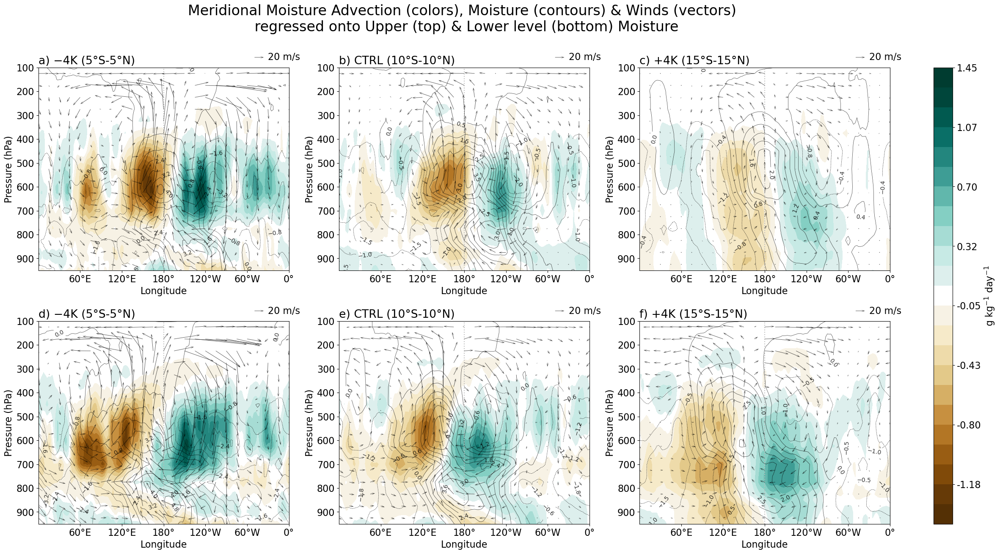

In [10]:
savefig = False
statistically_significant = False

latitude_bounds = {}
latitude_bounds['-4K'] = (-5, 5)
latitude_bounds['0K'] = (-10, 10)
latitude_bounds['4K'] = (-15, 15)

fontsize = 16
plt.rcParams.update({'font.size':fontsize})
fig = plt.figure(figsize=(24, 12))
gs_main = fig.add_gridspec(1, 2, width_ratios = [45, 1], wspace=0.1)
gs_main.update(left=0.05, right=0.95, bottom=0.05, top=0.95)
gs_axes = gs_main[0].subgridspec(2, 3, hspace=0.25)
gs_cbar = gs_main[1].subgridspec(1, 1)

axes = [[],[]]
axes[0].append(fig.add_subplot(gs_axes[0,0]))
axes[0].append(fig.add_subplot(gs_axes[0,1]))
axes[0].append(fig.add_subplot(gs_axes[0,2]))

axes[1].append(fig.add_subplot(gs_axes[1,0]))
axes[1].append(fig.add_subplot(gs_axes[1,1]))
axes[1].append(fig.add_subplot(gs_axes[1,2]))

# cbar_ax = fig.add_subplot(gs[:, 1])
# cbar_axes = []
cbar_axes = fig.add_subplot(gs_cbar[0])
# cbar_axes.append(fig.add_subplot(gs_cbar[1]))

data_type = 'regressed'

contourf_variable = 'Meridional Moisture Advection'
contour_variable = 'Moisture'

if data_type == 'regressed':
     #### Contourf variable
    if 'Moisture Advection' in contourf_variable:
        ### Advection Variables
        contourf_data = 1000*SECONDS_PER_DAY*multi_experiment_variables_regressed[contourf_variable].where(
             (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).transpose('experiment', 'level', 'plev', 'lon', 'lat')
        contourf_data.attrs['units'] = r"g kg$^{-1}$ day$^{-1}$"

    else:
        contourf_data = multi_experiment_variables_regressed[contourf_variable].where(
            (multi_experiment_significant_indices[contourf_variable] if statistically_significant else True)
        ).transpose('experiment', 'level', 'plev', 'lon', 'lat')

    #### Contour Variable
    if contour_variable != 'None':
        contour_data = 1000*multi_experiment_variables_regressed[contour_variable].where(
            (multi_experiment_significant_indices[contour_variable] if statistically_significant else True)
        ).transpose('experiment', 'level', 'plev', 'lon', 'lat')

    #### Wind Variables
    zonal_wind_data = multi_experiment_variables_regressed['Zonal Wind'].where(
        (multi_experiment_significant_indices['Zonal Wind'] if statistically_significant else True)
    ).transpose('experiment', 'level', 'plev', 'lon', 'lat')
    vertical_wind_data = multi_experiment_variables_regressed['Vertical Wind'].where(
        (multi_experiment_significant_indices['Vertical Wind'] if statistically_significant else True)
    ).transpose('experiment', 'level', 'plev', 'lon', 'lat')

elif data_type == 'correlated':
    contourf_data = multi_experiment_variables_correlated[contourf_variable].transpose('experiment', 'level', 'plev', 'lon', 'lat')
    contour_data = multi_experiment_variables_correlated[contour_variable].transpose('experiment', 'level', 'plev', 'lon', 'lat')

meridional_mean_contourf_data = xr.concat(
    [
        contourf_data.sel(
            experiment=experiment, lat=slice(*latitude_bounds[experiment])
        ).mean(dim=['lat'])
        for experiment
        in experiments_list
    ],
    dim=experiments_array
)
meridional_mean_contour_data = xr.concat(
    [
        contour_data.sel(
            experiment=experiment, lat=slice(*latitude_bounds[experiment])
        ).mean(dim=['lat'])
        for experiment
        in experiments_list
    ],
    dim=experiments_array
)

if data_type == 'regressed':
    meridional_mean_zonal_wind = xr.concat(
        [
            zonal_wind_data.sel(
                experiment=experiment, lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
            for experiment
            in experiments_list
        ],
        dim=experiments_array
    )
    meridional_mean_vertical_wind = xr.concat(
        [
            vertical_wind_data.sel(
                experiment=experiment, lat=slice(*latitude_bounds[experiment])
            ).mean(dim=['lat'])
            for experiment
            in experiments_list
        ],
        dim=experiments_array
    )

    # rescaled_meridional_mean_zonal_wind = meridional_mean_zonal_wind / meridional_mean_zonal_wind.std(dim=['plev', 'lon'])
    rescaled_meridional_mean_vertical_wind = meridional_mean_vertical_wind / meridional_mean_vertical_wind.std(dim=['plev', 'lon'])

    rescaled_meridional_mean_zonal_wind = meridional_mean_zonal_wind
    rescaled_meridional_mean_vertical_wind = 500*meridional_mean_vertical_wind

letter = [['a', 'b', 'c'], ['d', 'e', 'f']]


for level_index, level in enumerate(multi_experiment_variables_regressed['Moisture'].level):
    for experiment_index, experiment in enumerate(experiments_list):

        #### Title
        axes[level_index][experiment_index].set_title(
            f"{letter[level_index][experiment_index]}) {experiments_array.sel(experiment=experiment)['name'].item()}"
            + f" ({tick_labeller(latitude_bounds[experiment], 'lat', precision=0)[0]}"
            + f"-{tick_labeller(latitude_bounds[experiment], 'lat', precision=0)[1]})",
            loc='left'
        )

        #### Contourf Data
        grand_max = meridional_mean_contourf_data.max()
        grand_min = meridional_mean_contourf_data.min()
        data_order = min(
            np.floor(np.log10(np.abs(grand_min))),
            np.floor(np.log10(np.abs(grand_max)))
        )

        if data_type == 'regressed':
            levels = np.arange(
                round_out(grand_min, data_order+1),
                round_out(grand_max, data_order+1)+10**data_order,
                10**data_order
            )
            index = 1
            while len(levels) < 18:
                levels = np.arange(
                round_out(grand_min, data_order+1),
                round_out(grand_max, data_order+1)+(10**data_order/2**index),
                10**data_order/2**index
                )
                index += 1
            levels -= np.min(np.abs(levels))
        else:
            magnitude_max = max(np.abs(grand_min), np.abs(grand_max))
            step=1
            increment = -2
            levels = np.arange(
                -round_out(magnitude_max, -data_order-increment),
                round_out(magnitude_max, -data_order-increment)+10**data_order,
                10**data_order
            )
            index = 1
            while len(levels) < 18:
                levels = np.arange(
                    -round_out(magnitude_max, 1, step=step),
                    round_out(magnitude_max, 1, step=step)+10**data_order/2**index,
                    10**data_order/2**index
                )
                index += 1

            # levels -= levels[np.argmin(np.abs(levels))]

        data_captured = (grand_max.values < np.max(levels))*(grand_min.values > np.min(levels))
        print(f"({level.values}, {experiment}) Colorbar captures all data? {data_captured}")

        contourf_cdata, clon = cutil.add_cyclic_point(
            meridional_mean_contourf_data.sel(experiment=experiment, level=level),
            coord=meridional_mean_contourf_data.lon,
        )

        im = axes[level_index][experiment_index].contourf(
            clon,
            meridional_mean_contourf_data.plev,
            contourf_cdata,
            cmap=modified_colormap('BrBG', 'white', 0.05, 0.05),
            levels=levels,
            norm=mcolors.CenteredNorm(vcenter=0, halfrange=max(np.abs(grand_min.values), np.abs(grand_max.values)))
        )

        cbar = fig.colorbar(
            im,
            # cax=cbar_axes[index],
            cax=cbar_axes,
            label=(meridional_mean_contourf_data.attrs['units'] if data_type == 'regressed' else ''),
            orientation="vertical",
        )
        cbar.ax.tick_params(labelsize=fontsize)
        cbar.set_ticklabels([f"{level:0.2f}" for level in im.levels])

        #### Contour Data
        contour_cdata, clon = cutil.add_cyclic_point(
            meridional_mean_contour_data.sel(experiment=experiment, level=level),
            coord=meridional_mean_contour_data.lon,
        )

        cs = axes[level_index][experiment_index].contour(
            clon,
            meridional_mean_contour_data.plev,
            contour_cdata,
            colors='black',
            levels=11,
            # levels = im.levels[::2],
            linewidths=0.5,
            alpha=0.8
        )
        axes[level_index][experiment_index].clabel(cs, inline=True, fontsize=10)

        #### Quiver Data
        if data_type == 'regressed':
            cu, clon = cutil.add_cyclic_point(
                rescaled_meridional_mean_zonal_wind.sel(experiment=experiment, level=level),
                coord=meridional_mean_zonal_wind.lon,
            )

            comega, clon = cutil.add_cyclic_point(
                rescaled_meridional_mean_vertical_wind.sel(experiment=experiment, level=level),
                coord=meridional_mean_vertical_wind.lon,
            )

            lon_spacing = 6
            height_spacing = 2
            scale = 1.5
            quiv = axes[level_index][experiment_index].quiver(
                clon[::lon_spacing],
                meridional_mean_vertical_wind.plev[::height_spacing],
                cu[::height_spacing, ::lon_spacing],
                comega[::height_spacing, ::lon_spacing],
                scale_units='xy',
                angles='xy',
                scale=scale,
                width=0.0015,
                headwidth=6,
                headlength=10,
                minlength=2,
                zorder=10,
                color='black',
                alpha=0.7
            )
            scale_label = 20
            axes[level_index][experiment_index].quiverkey(quiv, X=0.9, Y=1.05, U=scale_label, label=f"{scale_label} m/s", labelpos='E')


    #### Configure axes
    for ax in axes[level_index]:
        # Axis parameters
        ax.set_aspect("auto")

        ax.set_xlim(0, 360)
        x_ticks = np.arange(0, 360 + 60, 60)
        ax.set_xticks(x_ticks)
        ax.set_xticklabels(tick_labeller(x_ticks, "lon", precision=0))
        ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
        ax.set_xlabel("Longitude")

        ax.set_ylim(100, 950)
        ax.set_yticks(np.arange(100, 1000, 100))
        ax.set_ylabel("Pressure (hPa)")
        ax.invert_yaxis()
        ax.axvline(x=180, color='#bcbcbc', ls=':')

#### Set suptitle
fig.suptitle(
    (f"{contourf_data.name} (colors), {contour_data.name} (contours)" + (f" & Winds (vectors) \n " if data_type == 'regressed' else "\n")
    + f"{('regressed onto' if data_type == 'regressed' else 'correlated with')} Upper (top) & Lower level (bottom) Moisture"),
    x=(axes[0][1].get_position().x0 + axes[0][1].get_position().x1)/2,
    ha='center',
    y=1.075,
    fontsize=24
)

output_directory = "/glade/u/home/sressel/aquaplanet_analysis/output"
output_filename = (
    f"/mjo_{data_type}_"
    + f"{contourf_variable.lower().replace(" ", "_")}"
    + f"_{reference_variable}_longitude_height"
)

print(f"Output directory: {output_directory}")
print(f"Output file: {output_filename}")
#### Save output
if savefig:
    print(f"{f'Saving...':<12}", end="")
    plt.savefig(
        f"{output_directory}/{output_filename}.png",
        dpi=500,
        bbox_inches="tight"
    )
    print(rf"{'✔':>1}")
else:
    print("Not saving")
    plt.show()

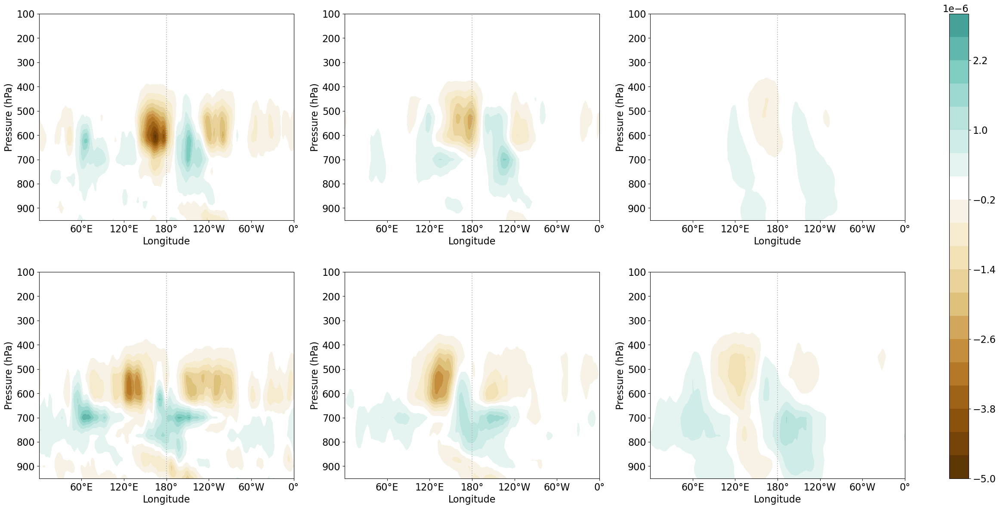

In [22]:
# plt.rcParams.update({'font.size':fontsize})
fig = plt.figure(figsize=(24, 12))
gs_main = fig.add_gridspec(1, 2, width_ratios = [45, 1], wspace=0.1)
gs_main.update(left=0.05, right=0.95, bottom=0.05, top=0.95)
gs_axes = gs_main[0].subgridspec(2, 3, hspace=0.25)
gs_cbar = gs_main[1].subgridspec(1, 1)

axes = [[],[]]
axes[0].append(fig.add_subplot(gs_axes[0,0]))
axes[0].append(fig.add_subplot(gs_axes[0,1]))
axes[0].append(fig.add_subplot(gs_axes[0,2]))

axes[1].append(fig.add_subplot(gs_axes[1,0]))
axes[1].append(fig.add_subplot(gs_axes[1,1]))
axes[1].append(fig.add_subplot(gs_axes[1,2]))

cbar_axes = fig.add_subplot(gs_cbar[0])

contribution = SECONDS_PER_DAY*(
    multi_experiment_variables_regressed['Meridional Moisture Advection']
    *multi_experiment_variables_regressed['Moisture']
)

for level_index, level in enumerate(multi_experiment_variables_regressed['Moisture'].level):
    for experiment_index, experiment in enumerate(experiments_list):

        contourf_cdata, clon = cutil.add_cyclic_point(
            contribution.sel(experiment=experiment, level=level, lat=slice(*latitude_bounds[experiment])).mean(dim='lat'),
            coord=meridional_mean_contourf_data.lon,
        )
        grand_min = contribution.min()
        grand_max = contribution.max()
        levels = np.linspace(grand_min, grand_max, 21)

        im = axes[level_index][experiment_index].contourf(
            clon,
            contribution.plev,
            contourf_cdata,
            cmap=modified_colormap('BrBG', 'white', 0.05, 0.05),
            # levels=levels,
            levels=np.linspace(-5*10e-7, 3*10e-7, 21),
            norm=mcolors.CenteredNorm(vcenter=0)
        )

        # im = axes[level_index][experiment_index].contourf(
        #     multi_experiment_variables_regressed[process].lon,
        #     multi_experiment_variables_regressed[process].plev,
        #     contribution,
        #     levels=np.linspace(contribution.,
        #     # norm=mcolors.CenteredNorm
        # )

        fig.colorbar(im, cax=cbar_axes)

    #### Configure axes
    for ax in axes[level_index]:
        # Axis parameters
        ax.set_aspect("auto")

        ax.set_xlim(0, 360)
        x_ticks = np.arange(0, 360 + 60, 60)
        ax.set_xticks(x_ticks)
        ax.set_xticklabels(tick_labeller(x_ticks, "lon", precision=0))
        ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
        ax.set_xlabel("Longitude")

        ax.set_ylim(100, 950)
        ax.set_yticks(np.arange(100, 1000, 100))
        ax.set_ylabel("Pressure (hPa)")
        ax.invert_yaxis()
        ax.axvline(x=180, color='#bcbcbc', ls=':')

plt.show()

In [96]:
contribution

<xarray.DataArray (level: 2, experiment: 3, plev: 40, lat: 34, lon: 144)> Size: 9MB
array([[[[[-2.23203049e-15, -2.50657228e-15, -2.32562685e-15, ...,
           -4.09829727e-16, -8.93913233e-16, -1.66716195e-15],
          [-1.13615908e-15, -1.07061684e-15, -1.00398890e-15, ...,
           -4.38315068e-16, -9.34144193e-16, -1.15187721e-15],
          [ 2.21498182e-16,  4.42801506e-16,  4.91677166e-16, ...,
           -4.17247906e-16, -3.34025449e-16, -5.52503862e-17],
          ...,
          [-6.05975416e-16, -3.68980535e-16, -6.08822382e-17, ...,
           -1.23517506e-15, -1.13342188e-15, -9.11456777e-16],
          [-6.10960674e-16, -1.78445876e-16,  2.10974542e-16, ...,
           -4.74669897e-16, -9.13623353e-16, -9.47732894e-16],
          [-4.16906746e-16, -2.61545994e-16, -1.18301851e-17, ...,
            2.56953475e-16, -7.82940491e-17, -3.64701840e-16]],

         [[ 2.66357604e-15,  3.37199835e-15,  4.06970642e-15, ...,
            1.50169311e-15,  1.62797134e-15,  2.03968659e-15],
          [ 3.53634928e-15,  4.02019953e-15,  3.83852402e-15, ...,
            1.52799234e-15,  1.92442369e-15,  2.74856543e-15],
          [ 1.37201663e-15,  1.09719722e-15,  6.49825874e-16, ...,
            5.24373173e-16,  8.64599141e-16,  1.25520491e-15],
...
          [ 2.57142715e-07,  3.22255980e-07,  3.48186986e-07, ...,
            2.82632136e-07,  1.75562244e-07,  1.34363537e-07],
          [ 7.37451280e-08,  2.00696798e-07,  2.23979267e-07, ...,
            3.48481763e-07,  2.36252203e-07,  7.94589653e-08],
          [ 4.62202359e-08,  8.91570616e-08,  1.48886676e-07, ...,
            2.64670408e-07,  3.34760064e-07,  2.15103883e-07]],

         [[            nan,             nan,             nan, ...,
                       nan,             nan,             nan],
          [            nan,             nan,             nan, ...,
                       nan,             nan,             nan],
          [            nan,             nan,             nan, ...,
                       nan,             nan,             nan],
          ...,
          [ 1.75621457e-07,             nan,             nan, ...,
                       nan,             nan,  4.82461513e-09],
          [            nan,             nan,             nan, ...,
                       nan,             nan,             nan],
          [            nan,             nan,             nan, ...,
                       nan,             nan,             nan]]]]])
Coordinates:
  * experiment  (experiment) <U3 36B '-4K' '0K' '4K'
  * lat         (lat) float64 272B -31.26 -29.37 -27.47 ... 27.47 29.37 31.26
  * lon         (lon) float64 1kB 0.0 2.5 5.0 7.5 ... 350.0 352.5 355.0 357.5
  * plev        (plev) float64 320B 25.0 50.0 75.0 100.0 ... 950.0 975.0 1e+03
  * level       (level) <U5 40B 'upper' 'lower'
Attributes:
    units:        kg s$^{-1}$
    description:  Meridional Moisture Advection
    file_id:      meridional_advection
    short_name:   meridional_advection
    subset:       True
    rescaled:     True

In [68]:
maintenance_contribution = {}
# budget_propagation_contribution = {}
for process in ['Zonal Moisture Advection', 'Meridional Moisture Advection', 'Vertical Moisture Advection']:
    maintenance_contribution[process] = []
    for experiment in experiments_list:
        numerator = (
            multi_experiment_variables_regressed[process].sel(experiment=experiment, level='upper', lat=slice(*latitude_bounds[experiment])).mean(dim='lat')
            *multi_experiment_variables_regressed['Moisture'].sel(experiment=experiment, level='upper', lat=slice(*latitude_bounds[experiment])).mean(dim='lat')
        ).integrate('plev').integrate('lon')
        denominator = (
            multi_experiment_variables_regressed['Moisture'].sel(experiment=experiment, level='upper', lat=slice(*latitude_bounds[experiment])).mean(dim='lat')**2
        ).integrate('plev').integrate('lon')
        maintenance_contribution[process].append(numerator/denominator)

    maintenance_contribution[process] = xr.concat(
        [term for term in maintenance_contribution[process]],
        dim=experiments_array
    )

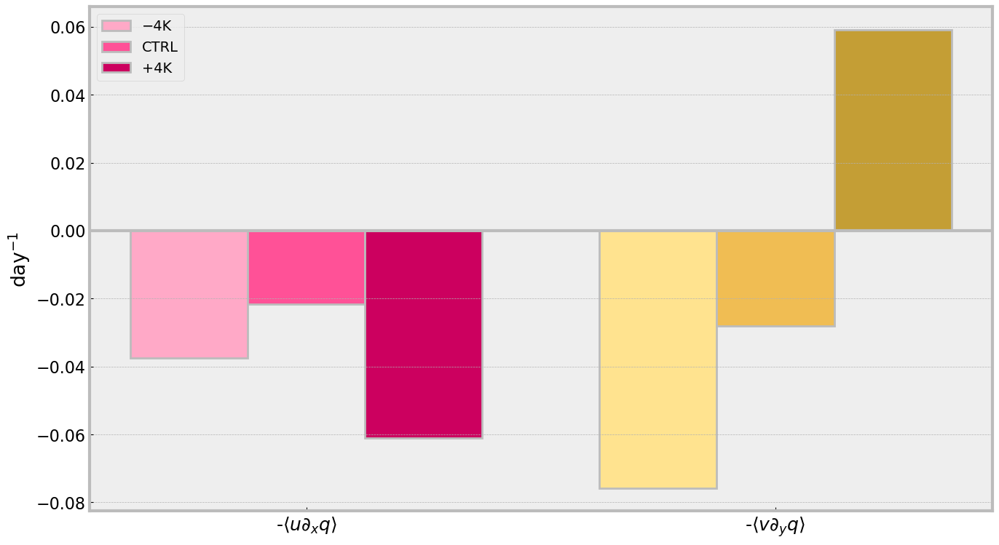

In [70]:
# projected_variable = "Moist Static Energy"

budget_term_attributes = {
    'Zonal Moisture Advection': {
        'label': r'-$\langle u \partial_{x} q \rangle$',
        'color': mcolors.LinearSegmentedColormap.from_list("HighContrastPinks", ["#fff0f5", "#ffb3cc", "#ff80b3", "#ff3385", "#cc005f"], N=256)
    },
    'Meridional Moisture Advection': {
        'label': r'-$\langle v \partial_{y} q \rangle$',
        'color': mcolors.LinearSegmentedColormap.from_list("Golden",["#fff9cc", "#ffe999", "#ffcc66",  "#e6b347", "#c49e35"], N=256),
    },
    'Vertical Moisture Advection': {
        'label': r"-$\langle \omega \partial_{p} q \rangle$",
        'color': plt.get_cmap('Purples'),
    },
}

processes_to_plot = [
    'Zonal Moisture Advection',
    'Meridional Moisture Advection',
    # 'Vertical Moisture Advection',
]

plt.style.use('bmh')
plt.rcParams.update({'font.size': 16, 'mathtext.fontset': 'dejavusans'})

fig, ax = plt.subplots(1, 1, figsize=(16, 9))
# ax.set_title(
#     (
#         f"{projection_variable} Budget Maintenance Contributions "
#     + f"\n Ressel Code, {budget_maintenance_contribution[projection_variable].attrs['Regression Method']} Regression Method"
#     ),
#     pad=15
# )

bar_width = 0.25
x_positions = np.arange(len(processes_to_plot))

# Plot bars for each experiment
for i, experiment in enumerate(experiments_list):
    ax.bar(
        x_positions + i * bar_width,
        [SECONDS_PER_DAY*maintenance_contribution[process].sel(experiment=experiment).values for process in processes_to_plot],
        width=bar_width,
        label=experiments_array.sel(experiment=experiment)['name'].item(),
        color=[budget_term_attributes[process]['color'](0.3 + 0.35 * i) for process in processes_to_plot],
        edgecolor='#bcbcbc',
        lw=2,
    )

ax.set_ylabel(r'day$^{-1}$')
ax.set_xticks(x_positions + bar_width, labels=[budget_term_attributes[process]['label'] for process in processes_to_plot], fontsize=18)
ax.axhline(y=0, color='#bcbcbc', lw=3)
ax.grid(axis='x')

for spine in ax.spines.values():
    spine.set_edgecolor("#bcbcbc")
    spine.set_linewidth(3)

# Add legend to distinguish experiments
ax.legend(fontsize=14)

plt.show()


In [57]:
contribution

{'-4K': <xarray.DataArray ()> Size: 8B
 array(-6.20259192e-08)
 Coordinates:
     level       <U5 20B 'upper'
     experiment  <U3 12B '-4K',
 '0K': <xarray.DataArray ()> Size: 8B
 array(-1.81447745e-07)
 Coordinates:
     level       <U5 20B 'upper'
     experiment  <U3 12B '0K',
 '4K': <xarray.DataArray ()> Size: 8B
 array(6.84212519e-07)
 Coordinates:
     experiment  <U3 12B '4K'
     level       <U5 20B 'upper'}

## Latitude-Height

NameError: name 'zonal_mean_variable_data' is not defined

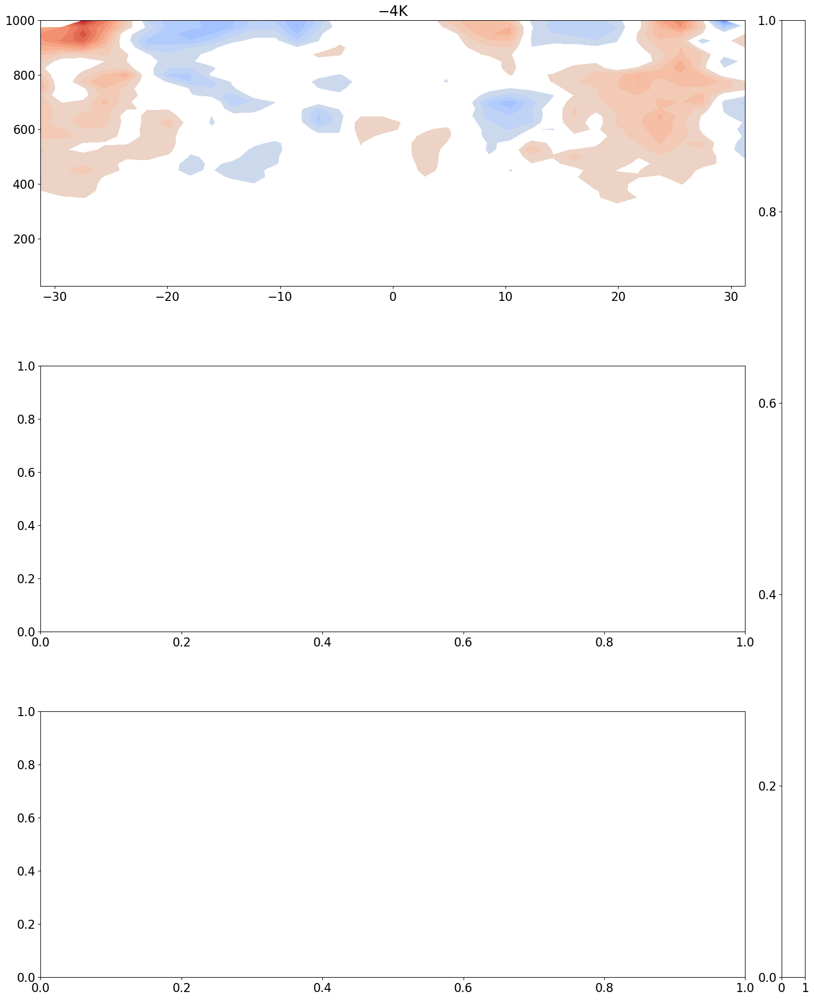

In [44]:
lat_spacing = 1
height_spacing = 2
plt.style.use("default")
plt.rcParams.update({"font.size": 16})

contourf_variable = 'Meridional Moisture Advection'
contour_variable = 'Moisture'

fig = plt.figure(figsize=(16, 20))
gs = GridSpec(3, 2, width_ratios=[30, 1], height_ratios=[1, 1, 1], figure=fig)
gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.3, wspace=0.1)

axes = []
axes.append(fig.add_subplot(gs[0,0]))
axes.append(fig.add_subplot(gs[1,0]))
axes.append(fig.add_subplot(gs[2,0]))
cbar_ax = fig.add_subplot(gs[:, 1])
for index, experiment in enumerate(experiments_list):

    zonal_mean_contourf_data = 1000*SECONDS_PER_DAY*multi_experiment_variables_regressed[contourf_variable].where(
        multi_experiment_significant_indices[contourf_variable]
    ).mean(dim='lon').T

    zonal_mean_contour_data = 1000*multi_experiment_variables_regressed[contour_variable].where(
        multi_experiment_significant_indices[contour_variable]
    ).mean(dim='lon')

    zonal_mean_zonal_wind = multi_experiment_variables_regressed['Zonal Wind'].where(
        multi_experiment_significant_indices['Zonal Wind']
    ).mean(dim='lon')
    zonal_mean_zonal_wind /= np.nanmax(np.abs(zonal_mean_zonal_wind))

    zonal_mean_vertical_wind = multi_experiment_variables_regressed['Vertical Wind'].where(
        multi_experiment_significant_indices['Vertical Wind']
    ).mean(dim='lon')
    zonal_mean_vertical_wind /= np.nanmax(np.abs(zonal_mean_vertical_wind))

    axes[index].set_title(f"{experiments_array.sel(experiment=experiment)['name'].item()}")

    im = axes[index].contourf(
        zonal_mean_contourf_data.lat,
        zonal_mean_contourf_data.plev,
        zonal_mean_contourf_data.sel(experiment=experiment).T,
        cmap=mjo.modified_colormap('coolwarm', 'white', 0.05, 0.05),
        levels=21,
        norm=mcolors.CenteredNorm(vcenter=0)
    )
            # Add colorbar
    cbar = fig.colorbar(
        im,
        cax=cbar_ax,
        label=zonal_mean_variable_data.attrs['units'],
        orientation="vertical",
    )
    cbar.ax.tick_params(labelsize=20)

    cs = axes[index].contour(
        zonal_mean_contour_data.lat,
        zonal_mean_contour_data.plev,
        zonal_mean_contour_data.sel(experiment=experiment).T,
        # cmap=mjo.modified_colormap('coolwarm', 'white', 0.05, 0.05),
        colors='k',
        levels=21,
        norm=mcolors.CenteredNorm(vcenter=0)
    )

    axes[index].quiver(
        zonal_mean_zonal_wind.lat[::lat_spacing],
        zonal_mean_vertical_wind.plev[::height_spacing],
        zonal_mean_zonal_wind.sel(experiment=experiment).T[::height_spacing, ::lat_spacing],
        -zonal_mean_vertical_wind.sel(experiment=experiment).T[::height_spacing, ::lat_spacing],
    )
    # axes[index].invert_yaxis()
    # Axis parameters
    axes[index].set_xlim(-30, 30)
    x_ticks = np.arange(-30, 30 + 10, 10)
    axes[index].set_xticks(x_ticks)
    # ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
    # ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
    axes[index].set_xlabel("Latitude")

    axes[index].set_ylim(100, 950)
    axes[index].set_yticks(np.arange(100, 1000, 100))
    axes[index].set_ylabel("Pressure (hPa)")
    axes[index].invert_yaxis()
    axes[index].set_aspect('auto')

fig.suptitle(
    'Zonal-mean MJO-regressed Moisture & Winds',
    x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
    ha='center',
    y=1.025
)

plt.show()

In [30]:
zonal_mean_contour_data.sel(experiment='4K')
zonal_mean_contourf_data.sel(experiment='4K')

<xarray.DataArray 'Meridional Moisture Advection' (plev: 40, lat: 34)> Size: 11kB
array([[ 1.19853362e-15,  1.01400456e-15,  7.87184725e-16, ...,
         1.16404269e-15,  1.99579100e-15,  1.71178520e-15],
       [-1.13151211e-15, -3.82312335e-15,  3.29297528e-16, ...,
         5.22790802e-15,  9.86359771e-16,  4.19974619e-15],
       [ 6.64728771e-15,  4.77085953e-15,  8.65111418e-18, ...,
         9.07000741e-15,  1.82641007e-14,  1.68882626e-14],
       ...,
       [-5.59647032e-10,  4.50103942e-10, -9.82263103e-11, ...,
         3.15196327e-11,  2.42921267e-10,  1.16367221e-09],
       [-5.20003947e-10, -1.62654747e-10, -3.55841004e-10, ...,
         7.93296784e-11,  3.29432637e-10,  1.37254051e-09],
       [            nan,             nan, -1.57831514e-09, ...,
        -2.38013022e-09,             nan,             nan]])
Coordinates:
    experiment  <U3 12B '4K'
  * lat         (lat) float64 272B -31.26 -29.37 -27.47 ... 27.47 29.37 31.26
  * plev        (plev) float64 320B 25.0 50.0 75.0 100.0 ... 950.0 975.0 1e+03
Attributes:
    units:        kg s$^{-1}$
    description:  Meridional Moisture Advection
    file_id:      meridional_advection
    short_name:   meridional_advection
    subset:       True
    rescaled:     True

         Regressions onto PC 1          
Saving plot as multi-experiment_zonal-mean_U_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_V_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_ω_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_T_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_Q_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_Z_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_MSE_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_QRL_regressed-on-PRCP-PC1.png
Saving plot as multi-experiment_zonal-mean_QRS_regressed-on-PRCP-PC1.png
         Regressions onto PC 2          
Saving plot as multi-experiment_zonal-mean_U_regressed-on-PRCP-PC2.png
Saving plot as multi-experiment_zonal-mean_V_regressed-on-PRCP-PC2.png
Saving plot as multi-experiment_zonal-mean_ω_regressed-on-PRCP-PC2.png
Saving plot as multi-experiment_zonal-mean_T_regressed-on-PR

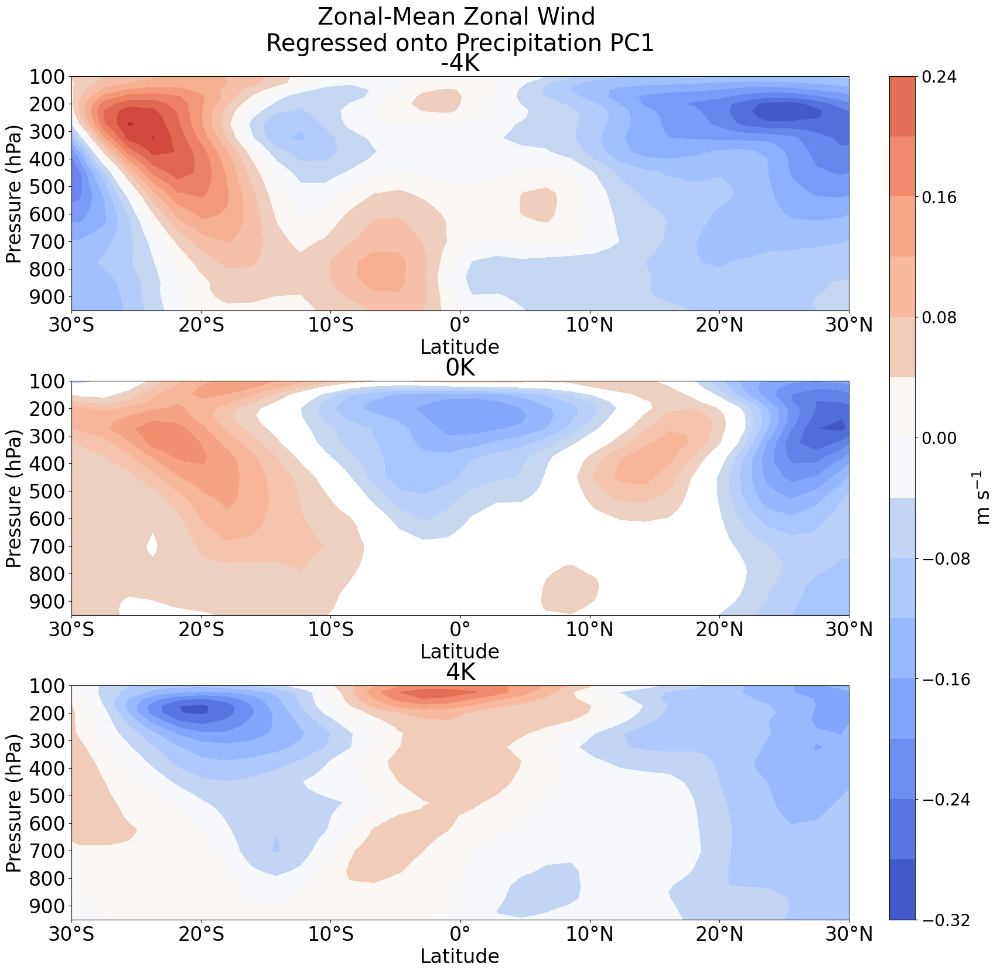

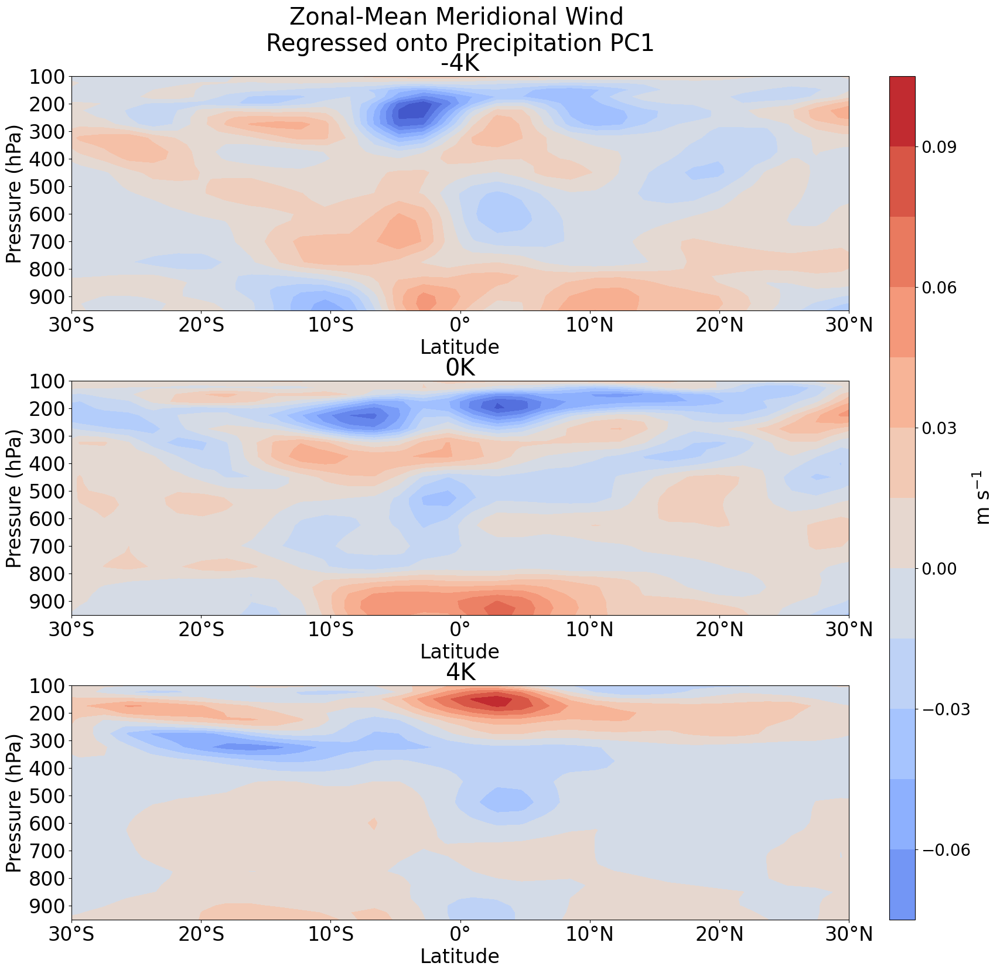

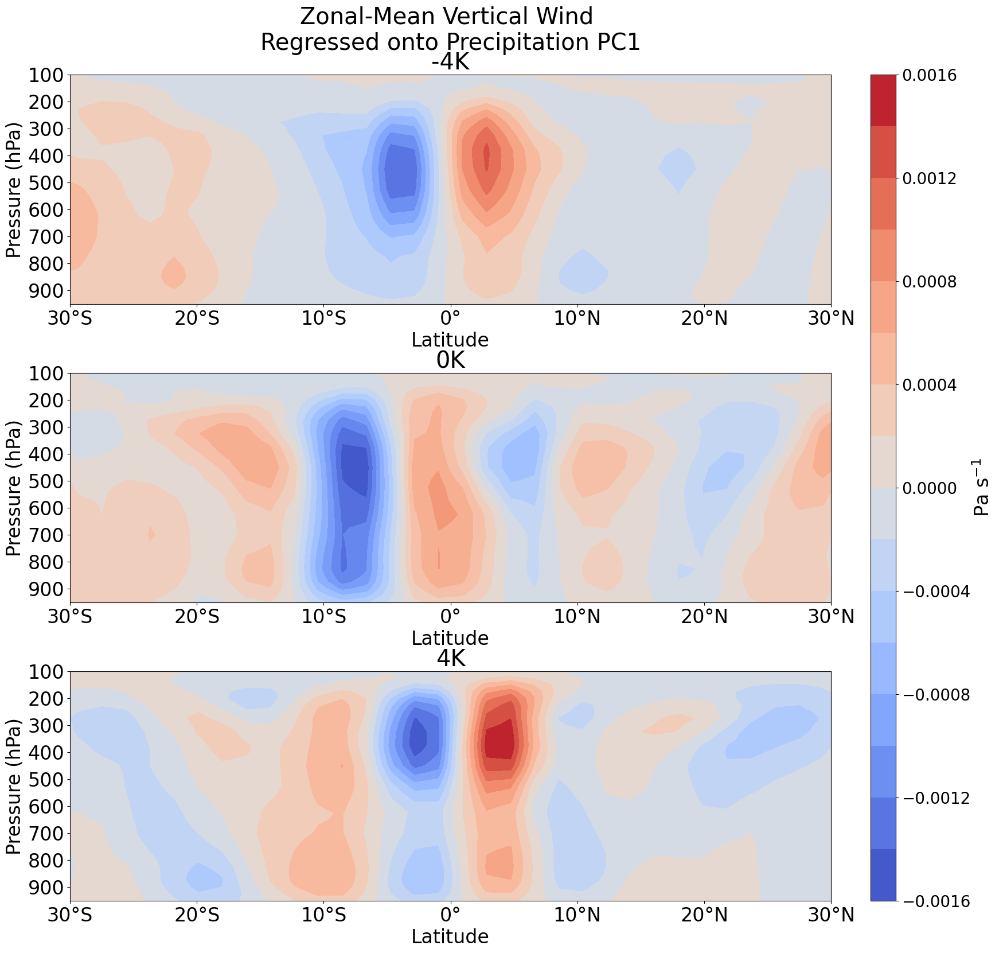

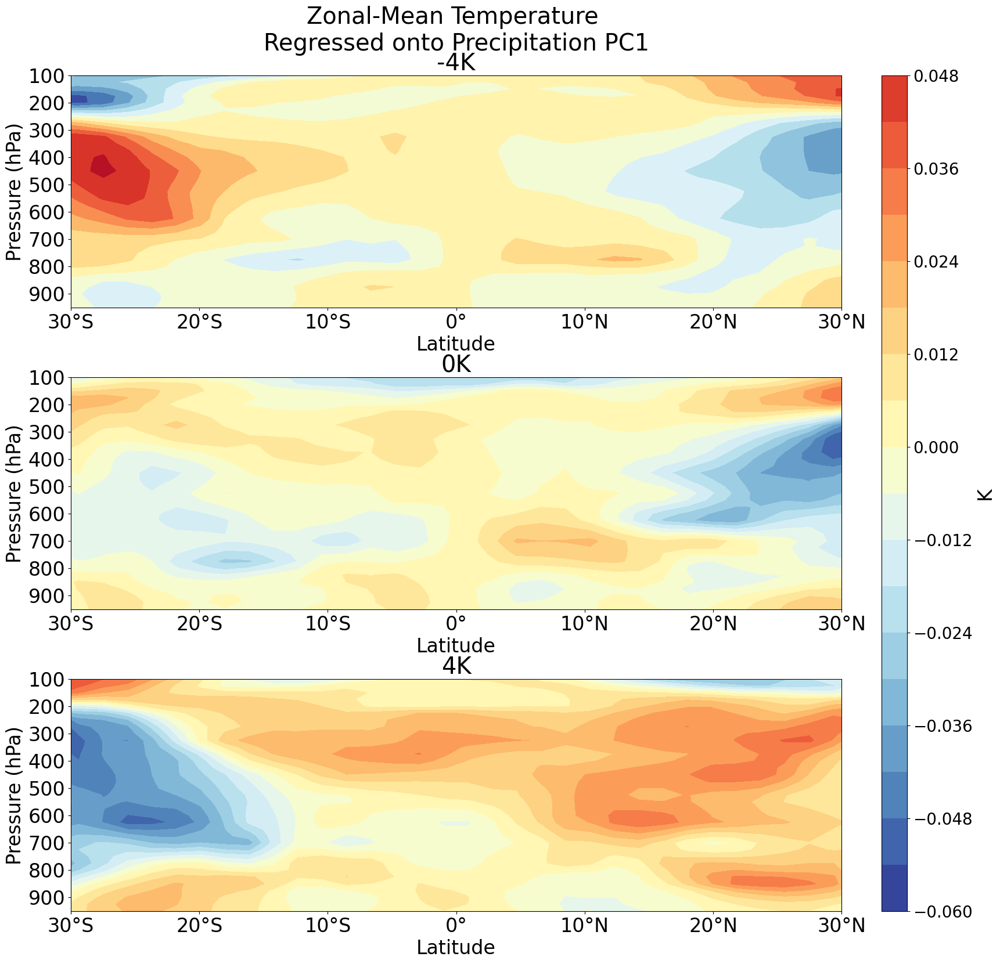

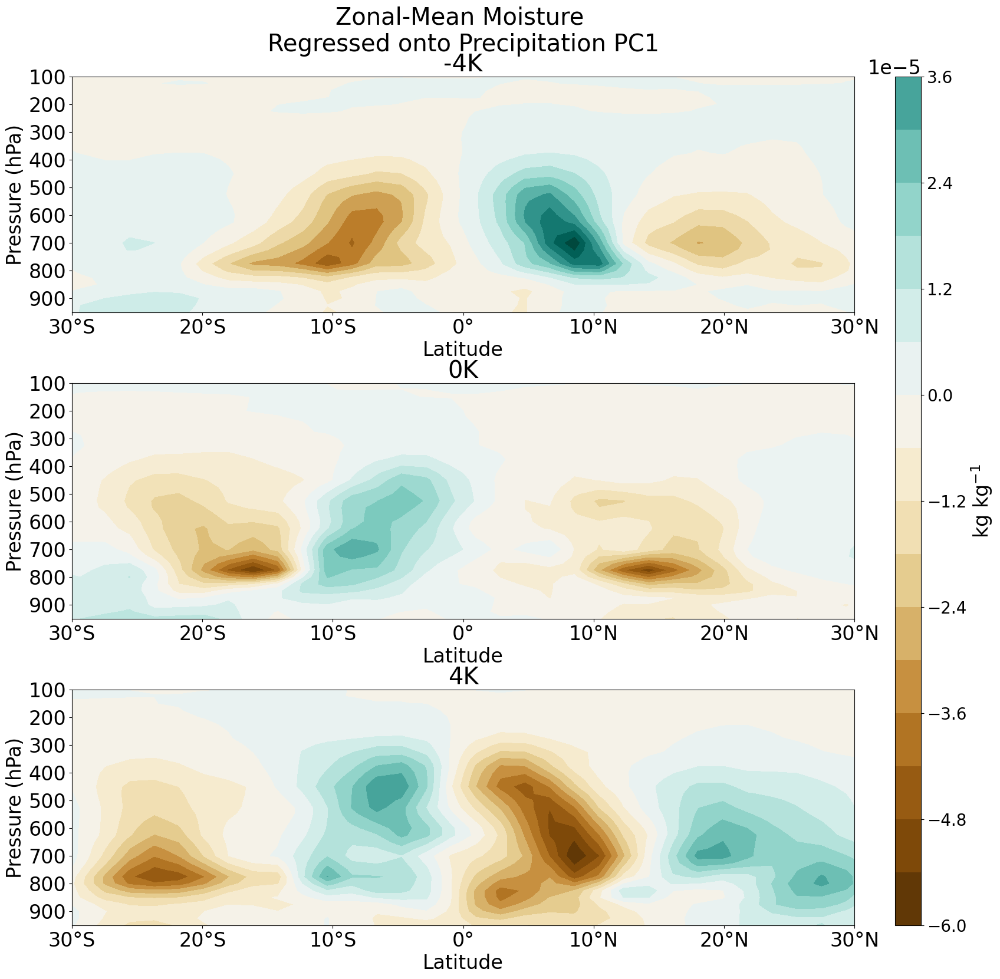

...

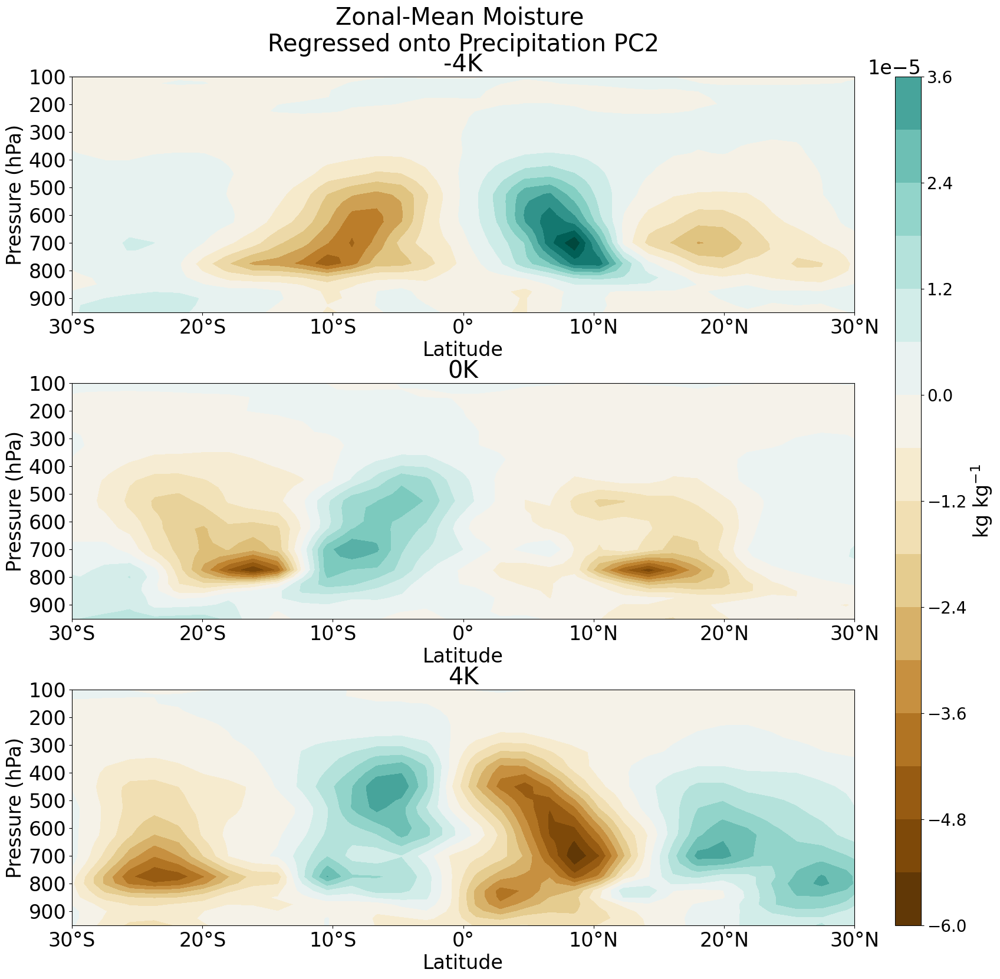

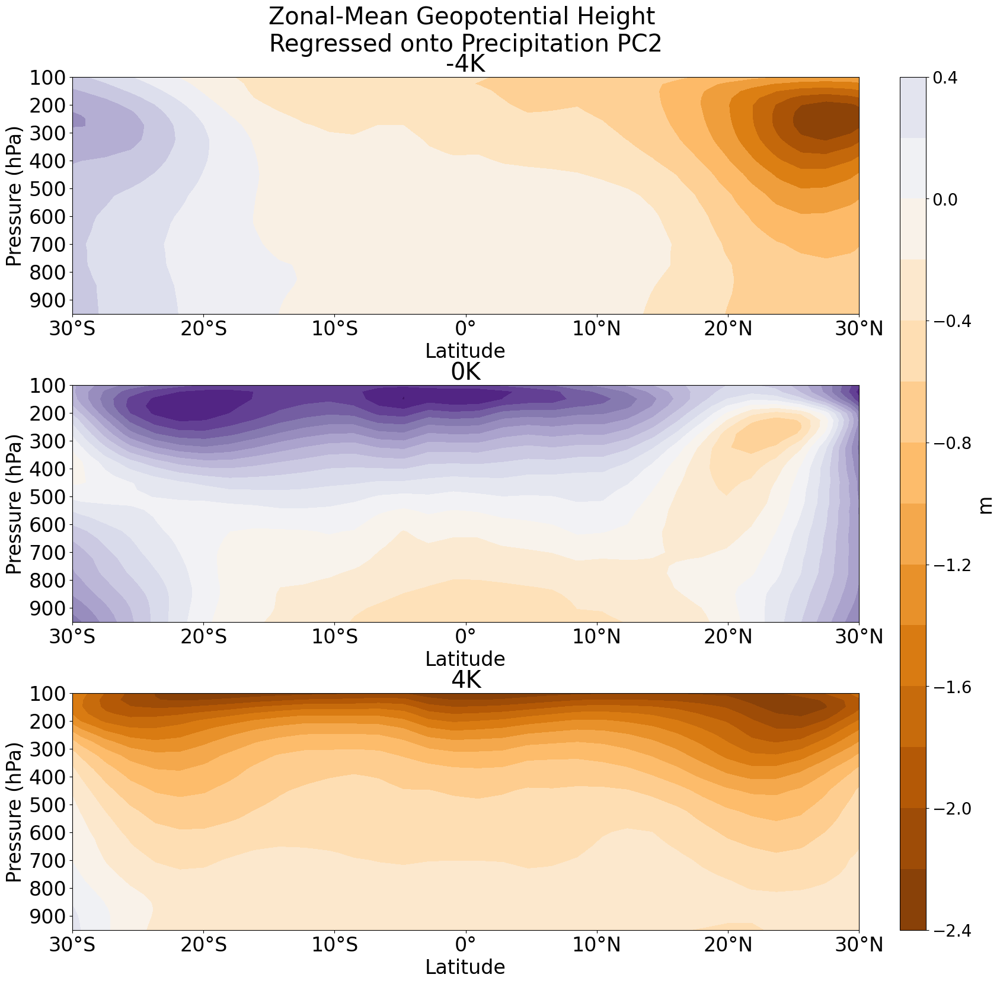

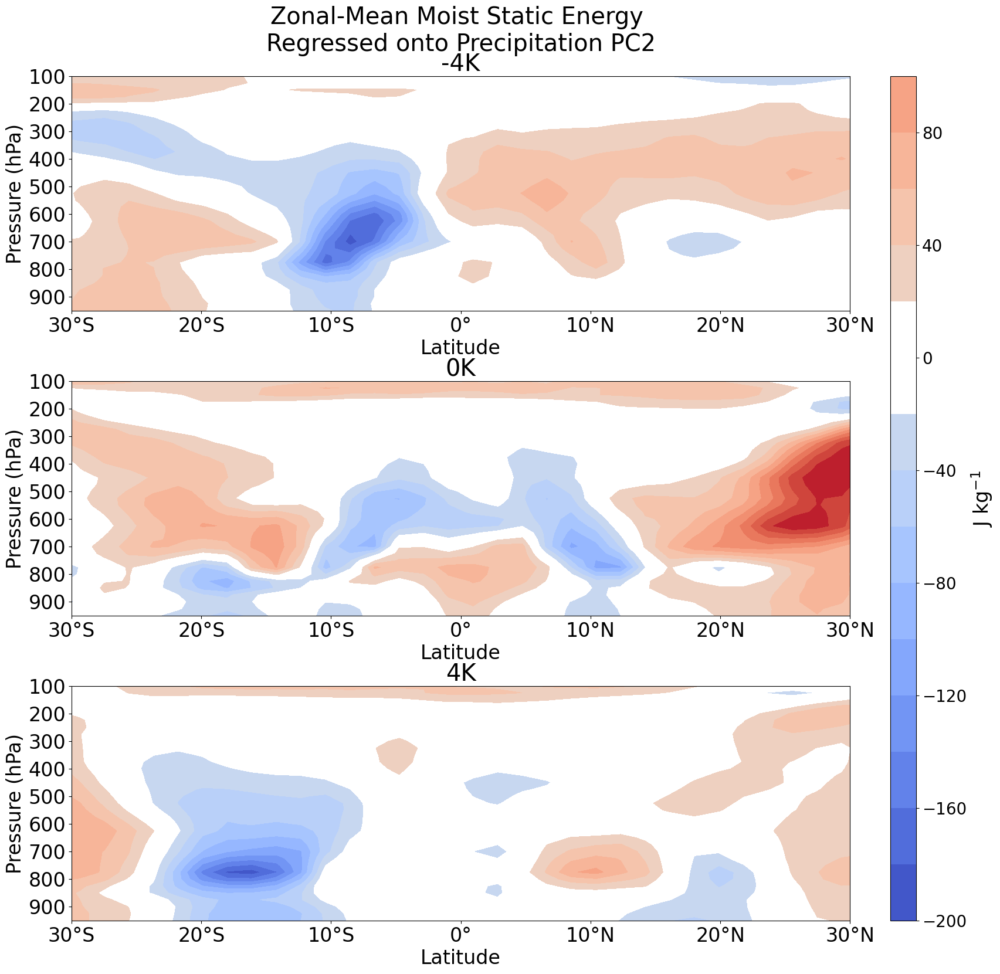

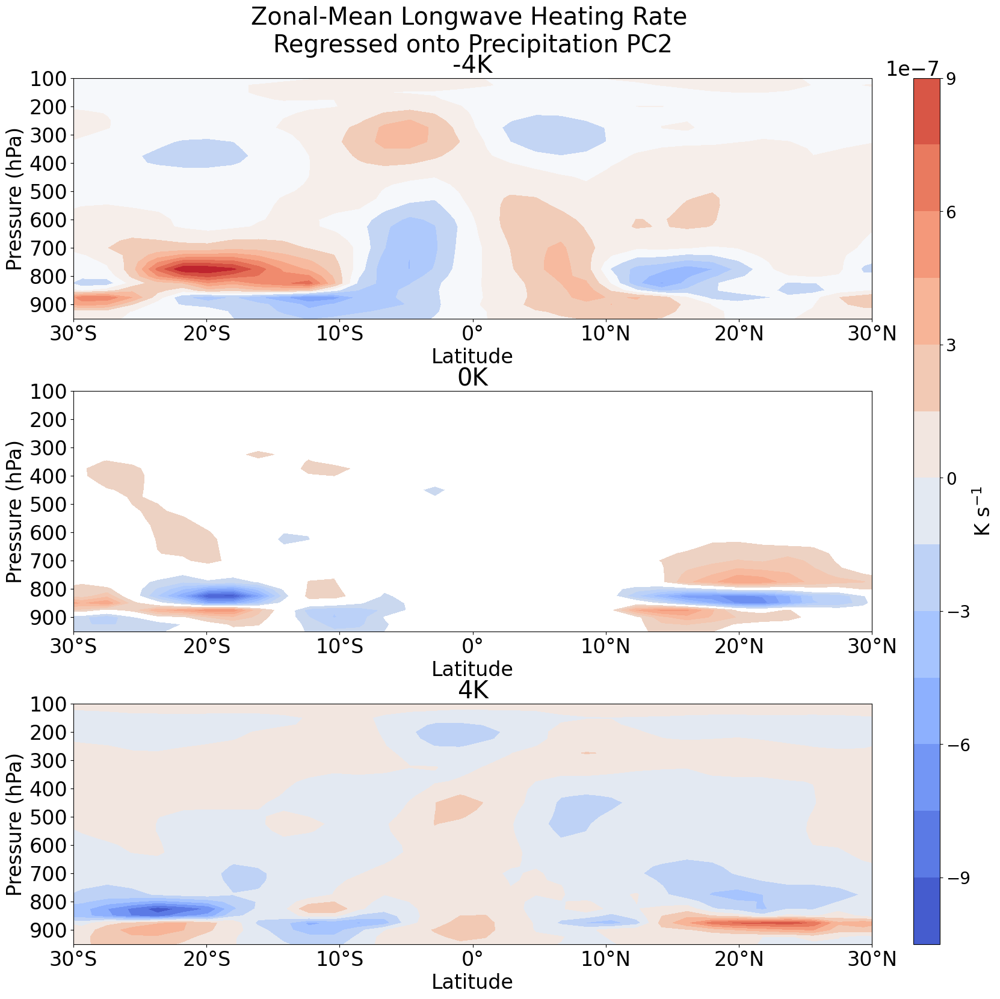

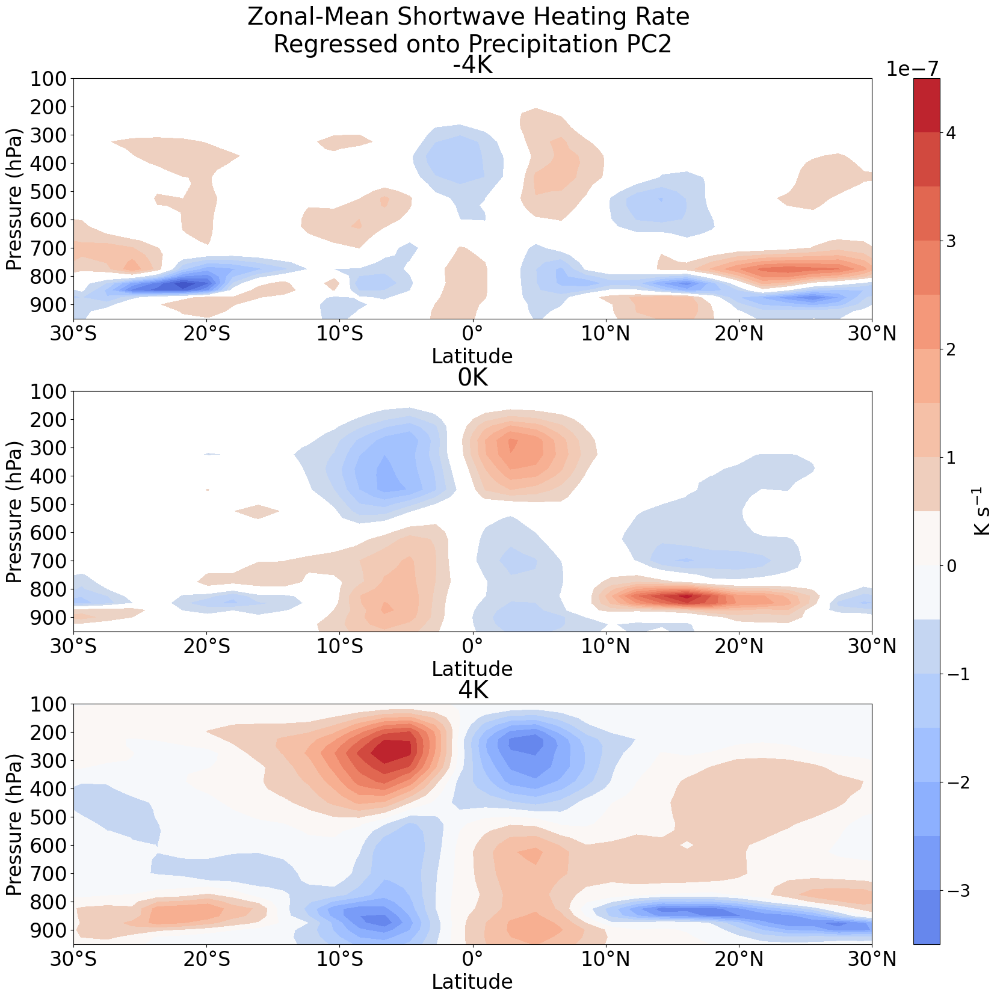

In [45]:
savefig=True
xr.set_options(keep_attrs=True)
meridional_mean_region = slice(-10,10)

for regression_PC in [1,2]:
    print(f'{f"Regressions onto PC {regression_PC}":^{str_width}}')
    print(f"{'='*str_width}")

    variables_to_plot = [
        multi_experiment_variables_regressed[regression_PC]['zonal wind'.title()],
        multi_experiment_variables_regressed[regression_PC]['meridional wind'.title()],
        multi_experiment_variables_regressed[regression_PC]['vertical wind'.title()],
        multi_experiment_variables_regressed[regression_PC]['temperature'.title()],
        multi_experiment_variables_regressed[regression_PC]['moisture'.title()],
        multi_experiment_variables_regressed[regression_PC]['geopotential height'.title()],
        multi_experiment_variables_regressed[regression_PC]['moist static energy'.title()],
        multi_experiment_variables_regressed[regression_PC]['longwave heating rate'.title()],
        multi_experiment_variables_regressed[regression_PC]['shortwave heating rate'.title()],
    ]

    for variable_data in variables_to_plot:

        zonal_mean_variable_data = variable_data.mean(dim='lon')

        grand_max = zonal_mean_variable_data.max()
        grand_min = zonal_mean_variable_data.min()

        plt.style.use("default")
        plt.rcParams.update({"font.size": 24})

        fig = plt.figure(figsize=(16, 16))
        gs = GridSpec(3, 2, width_ratios=[30, 1], height_ratios=[1, 1, 1], figure=fig)
        gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.3, wspace=0.1)

        axes = []
        axes.append(fig.add_subplot(gs[0,0]))
        axes.append(fig.add_subplot(gs[1,0]))
        axes.append(fig.add_subplot(gs[2,0]))
        cb_ax = fig.add_subplot(gs[:, 1])

        for ax, experiment in zip(axes, experiments_list):

            ax.set_title(f"{experiment}")

            # Plot data
            im = ax.contourf(
                zonal_mean_variable_data.lat,
                zonal_mean_variable_data.plev,
                zonal_mean_variable_data.sel(experiment=experiment).T,
                levels=16,
                norm=mcolors.CenteredNorm(vcenter=0),
                **{k: copy.deepcopy(v) for k, v in {
                    # "norm": plotting_attributes[zonal_mean_variable_data.name].get("norm"),
                    "cmap": plotting_attributes[zonal_mean_variable_data.name].get("d_cmap")
                }.items() if v is not None}
            )

            # Add colorbar
            cbar = fig.colorbar(
                im,
                cax=cb_ax,
                label=zonal_mean_variable_data.attrs['units'],
                orientation="vertical",
            )
            cbar.ax.tick_params(labelsize=20)

            # Axis parameters
            ax.set_xlim(-30, 30)
            x_ticks = np.arange(-30, 30+10, 10)
            ax.set_xticks(x_ticks)
            ax.set_xticklabels(tick_labeller(x_ticks, "lat"))
            # ax.xaxis.set_major_locator(mticker.MaxNLocator(5, prune="lower"))
            ax.set_xlabel("Latitude")

            ax.set_ylim(100, 950)
            ax.set_yticks(np.arange(100, 1000, 100))
            ax.set_ylabel("Pressure (hPa)")
            ax.invert_yaxis()

            ax.set_aspect('auto')

        fig.suptitle(
            (
                f"Zonal-Mean"
                + f" {variable_data.name.title()} \nRegressed onto {compositing_variable.name} PC{regression_PC}"
            ),
            x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
            ha='center',
            y=1.025
        )

        if not savefig:
            plt.show()
        else:
            save_string = (
                f"multi-experiment_zonal-mean"
              + f"_{zonal_mean_variable_data.attrs['file_id']}"
              + f"_regressed-on-{compositing_variable.attrs['file_id']}-PC{regression_PC}"
              + f".png"
                )
            print(f"Saving {variable_data.name} plot as {save_string}")
            plt.savefig(
                f"{output_directory}/regressions/latitude-height/{save_string}",
                dpi=500,
                bbox_inches="tight",
            )

print(f"{'='*40}")
print("Finished")

## Lag Regressions

### Lag regress variables

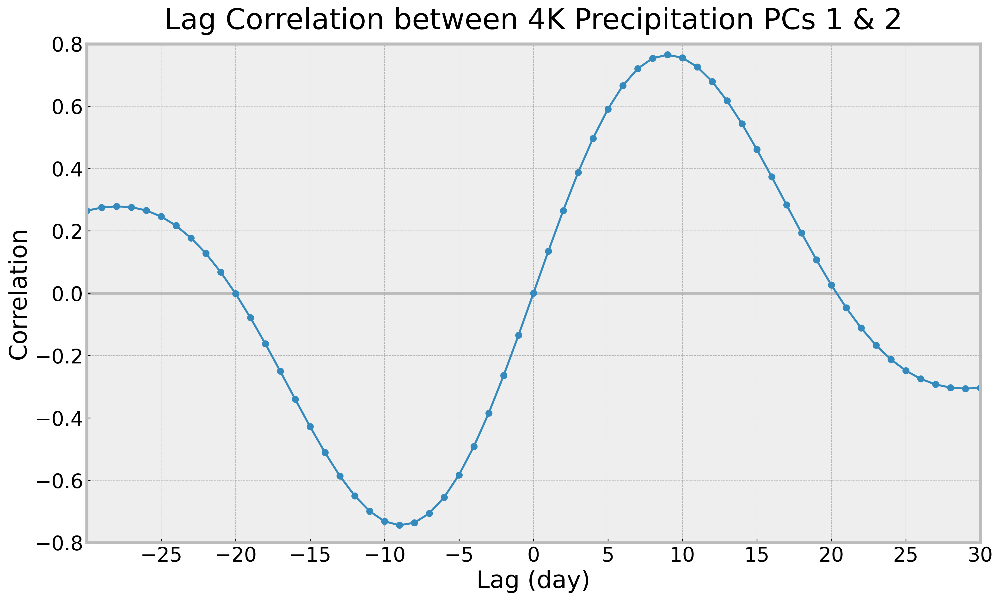

Finished


In [133]:
# output_directory = f"/glade/u/home/sressel/aquaplanet_analysis/output/"
# savefig = False

# PCs_to_use = [1, 2]

# correlation = []
# lag_days = np.arange(-30, 31)
# for lag in lag_days:
#     correlation.append(
#         np.correlate(
#             standardize_data(PC[PCs_to_use[0]-1]),
#             np.roll(standardize_data(PC[PCs_to_use[1]-1]), shift=lag),
#         )
#         / len(PC[0])
#     )

# plt.style.use("bmh")
# plt.rcParams.update({"font.size": 20})

# [fig, ax] = plt.subplots(figsize=(16, 9))
# ax.set_title(
#     f"Lag Correlation between {experiment} {compositing_variable.name} PCs {PCs_to_use[0]} & {PCs_to_use[1]}",
#     pad=15
# )

# ax.plot(lag_days, correlation, marker="o")
# ax.axhline(y=0, color="#bcbcbc", lw=3, zorder=-10)
# ax.set_ylim(-0.8, 0.8)
# ax.set_xlim(-30, 30)
# ax.set_yticks(np.arange(-0.8, 1, 0.2))
# ax.set_xticks(np.arange(-30, 35, 5))
# ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=13, prune="lower"))
# ax.set_xlabel("Lag (day)")
# ax.set_ylabel("Correlation")
# for spine in ax.spines.values():
#     spine.set_edgecolor("#bcbcbc")
#     spine.set_linewidth(3)

# if not savefig:
#     plt.show()
# else:
#     save_string = (
#         f"{experiment}"
#       + f"_{compositing_variable.attrs['file_id']}"
#       + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}"
#       + f"_PC-{PCs_to_use[0]}-{PCs_to_use[1]}_lag-correlation.png"
#         )
#     print(f"Saving plot as {save_string}")
#     plt.savefig(
#         f"{output_directory}/correlations/PC-lag-correlations/{save_string}",
#         dpi=500,
#         bbox_inches="tight",
#     )

# print(f"{'='*40}")
# print("Finished")

In [347]:
print(f"{'Lag Regressions':^{str_width}}")
print(f"{f'Regression Variable: {regression_variable}':^{str_width}}")
print(f"{'='*str_width}")

meridional_mean_region = slice(-10,10)
weights = np.cos(np.deg2rad(latitude))
weights.name = "weights"
lag_days = np.arange(-30, 31)
multi_experiment_lag_regression = {}
lag_regression_variable = 'Precipitation'

# Identify reference timeseries
reference_longitude = 180
reference_latitude = (
    multi_experiment_variables_mjo_filtered[lag_regression_variable]
).var(dim='time').mean(dim='lon').idxmax(dim='lat')

# Select the timeseries at the correct reference location for each experiment
selected_timeseries = []
for exp, lat in zip(multi_experiment_variables_mjo_filtered[lag_regression_variable].experiment, reference_latitude):

    experiment_reference_timeseries = multi_experiment_variables_mjo_filtered[lag_regression_variable].sel(
        experiment=exp, lat=lat, lon=reference_longitude
    )
    selected_timeseries.append(experiment_reference_timeseries)

# Combine all timeseries into a single DataArray if needed
reference_timeseries = xr.concat(selected_timeseries, dim="experiment")
reference_timeseries = reference_timeseries.drop_sel(time=missing_days, errors='ignore')

for index, (variable_name, variable_data) in enumerate(multi_experiment_variables_subset.items()):
    print(f'{f"({index+1}/{len(multi_experiment_variables_subset)}) {variable_name}...":<{str_width-1}}', end="")

    if not variable_name in variables_to_load:
        print(f"{variable_name} not in variables to load, skipping...")
        continue

    if 'plev' in variable_data.coords:
        multi_experiment_lag_regression[variable_name] = xr.DataArray(
            data=np.empty(
                (
                    len(experiments_list),
                    len(lag_days),
                    len(variable_data.lat),
                    len(variable_data.lon),
                    len(variable_data.plev)
                )
            ),
            dims=["experiment", "lag", "lat", "lon", "plev"],
            coords=dict(
                experiment=experiments_list,
                lag=lag_days,
                lat=variable_data.lat,
                lon=variable_data.lon,
                plev=variable_data.plev
            ),
            attrs = variable_data.attrs
        )
    else:
        multi_experiment_lag_regression[variable_name] = xr.DataArray(
            data=np.empty((len(experiments_list), len(lag_days), len(variable_data.lat), len(variable_data.lon))),
            dims=["experiment", "lag", "lat", "lon"],
            coords=dict(
                experiment=experiments_list,
                lag=lag_days,
                lat=variable_data.lat,
                lon=variable_data.lon
            ),
            attrs = variable_data.attrs
        )

    for lag_index, lag in enumerate(lag_days):
        multi_experiment_lag_regression[variable_name][:, lag_index] = np.einsum(
                'ij...,ij...->i...',
                standardize_data(variable_data, dim='time', unit_variance=False),
                np.roll(standardize_data(reference_timeseries), shift=lag),
            ) / len(reference_timeseries.time)
    print(rf"{'✔':>1}")

print(f"{'='*str_width}")
print("Finished")

            Lag Regressions             
Regression Variable: MJO-filtered Precipitation
(1/4) Precipitation...                 ✔
(2/4) Zonal Wind...                    Zonal Wind not in variables to load, skipping...
(3/4) Vertical Wind...                 Vertical Wind not in variables to load, skipping...
(4/4) Outgoing Longwave Radiation...   Outgoing Longwave Radiation not in variables to load, skipping...
Finished


### Plot lag-regressed variables

#### Lag-longitude

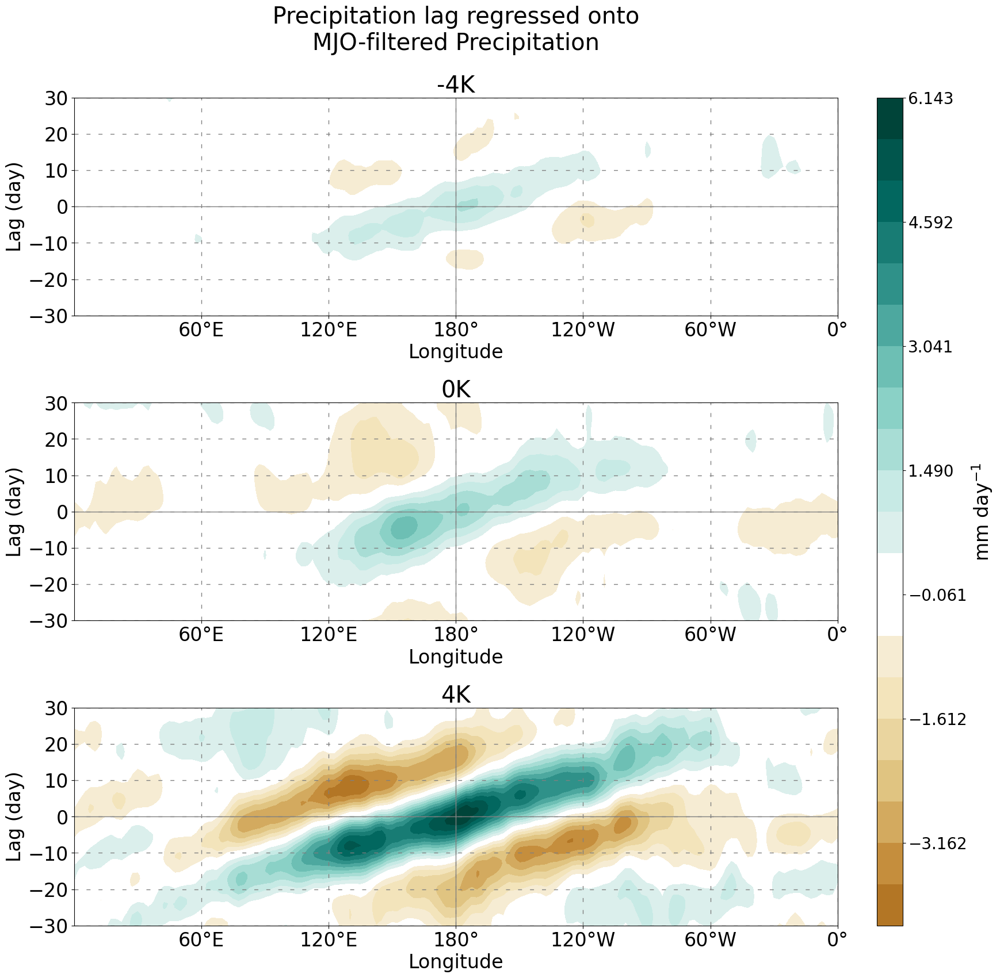

Finished


In [361]:
output_directory = f"/glade/u/home/sressel/aquaplanet_analysis/output/"
savefig=False

plt.style.use("default")
plt.rcParams.update({"font.size": 24})
multi_experiment_lag_regression['Precipitation'].name = 'Precipitation'
multi_experiment_lag_regression['Precipitation'] *= (15/multi_experiment_lag_regression['Precipitation'].sel()
variables_to_plot = [
    multi_experiment_lag_regression['precipitation'.title()],
    # scaled_multi_experiment_lag_regression['outgoing longwave radiation'.title()],
    # scaled_multi_experiment_lag_regression['zonal wind'.title()].sel(plev=200),
    # scaled_multi_experiment_lag_regression['zonal wind'.title()].sel(plev=850),
    # multi_experiment_lag_regression['vertical wind'.title()].sel(plev=500),
    # multi_experiment_variables_regressed['column temperature'.title()],
    # multi_experiment_variables_regressed['column water vapor'.title()],
    # multi_experiment_lag_regression['moist static energy'.title()].sel(plev=850),
    # multi_experiment_variables_regressed['column longwave heating'.title()],
    # multi_experiment_variables_regressed['column shortwave heating'.title()],
    # multi_experiment_lag_regression['latent heat flux'.title()],
    # multi_experiment_lag_regression['sensible heat flux'.title()],
]

print(f"{'='*str_width}")
for variable_data in variables_to_plot:
    grand_max = variable_data.max()
    grand_min = variable_data.min()

    fig = plt.figure(figsize=(16, 16))
    gs = GridSpec(3, 2, width_ratios=[30,1], height_ratios=[1,1,1], figure=fig)
    gs.update(top=0.95, bottom=0.05, left=0.05, right=0.95, hspace=0.4, wspace=0.1)

    axes = []
    axes.append(fig.add_subplot(gs[0,0]))
    axes.append(fig.add_subplot(gs[1,0]))
    axes.append(fig.add_subplot(gs[2,0]))
    cb_ax = fig.add_subplot(gs[:, 1])

    for ax, experiment in zip(axes, experiments_list):
        ax.set_title(f"{experiment}")

        # Add cyclic point
        cdata, clon = cutil.add_cyclic_point(
            # variable_data.sel(experiment=experiment, lat=slice(-10,10)).weighted(weights).mean(dim='lat'),
            variable_data.sel(experiment=experiment, lat=reference_latitude.sel(experiment=experiment)),
            coord=variable_data.lon,
        )

        # Plot data
        im = ax.contourf(
            clon,
            variable_data.lag,
            cdata,
            levels=np.linspace(grand_min, grand_max, 21),
            norm=mcolors.CenteredNorm(vcenter=0),
            **{k: copy.deepcopy(v) for k, v in {
                # "norm": plotting_attributes[variable_data.name].get('norm'),
                "cmap": plotting_attributes[variable_data.name].get('d_cmap')
            }.items() if v is not None}
        )

        # Add colorbar
        cbar = fig.colorbar(
            im,
            cax=cb_ax,
            label=variable_data.attrs['units'],
            orientation="vertical",
        )
        cbar.ax.tick_params(labelsize=20)

        # ax.plot(reference_longitude, reference_latitude.sel(experiment=experiment), marker='x', color='k', ms=14)
        ax.axhline(y=0, ls='-', color="grey", lw=1)
        ax.axvline(x=180, ls='-', color="grey", lw=1)

        # Axis parameters
        ax.set_aspect("auto")

        ax.set_xlim(0, 360)
        x_ticks = np.arange(0, 360 + 60, 60)
        ax.set_xticks(x_ticks)
        ax.set_xticklabels(tick_labeller(x_ticks, "lon"))
        ax.xaxis.set_major_locator(mticker.MaxNLocator(7, prune="lower"))
        ax.set_xlabel("Longitude")

        ax.set_ylim(-30, 30)
        y_ticks = np.arange(-30, 40, 10)
        ax.set_yticks(y_ticks)
        ax.set_ylabel("Lag (day)")

        # grid_kwargs = {"linewidth": 1, "linestyle": (0, (5, 10)), "color": "grey"}
        ax.grid(True, **grid_kwargs)

    fig.suptitle(
        (
            f"{(' ' + (str(variable_data.plev.values) + '-hPa') if 'plev' in variable_data.coords else '')}"
            + f" {variable_data.name} lag regressed onto \n{regression_variable}{(regression_index+1 if regression_variable == 'PCs' else '')}"
        ),
        x=(axes[0].get_position().x0 + axes[0].get_position().x1)/2,
        ha='center',
        y=1.05
    )

    if not savefig:
        plt.show()
    else:
        save_string = (
            f"multi-experiment_{variable_data.attrs['file_id']}"
          + f"{((str(variable_data.plev.values)) if 'plev' in variable_data.coords else '')}"
          + f"lag_regressed-on-{regression_variable.replace(' ', '-')}{(regression_index+1 if regression_variable == 'PCs' else '')}"
          + f".png"
            )
        print(
            f"Saving {(' ' + (str(variable_data.plev.values) + '-hPa') if 'plev' in variable_data.coords else '')} {variable_data.name} plot as {save_string}"
        )
        plt.savefig(
            f"{output_directory}/regressions/latitude-longitude/{save_string}",
            dpi=500,
            bbox_inches="tight",
        )

print(f"{'='*40}")
print("Finished")

#### Lag-Latitude

Variable: Precipitation
Computing correlations...
Correlations computed


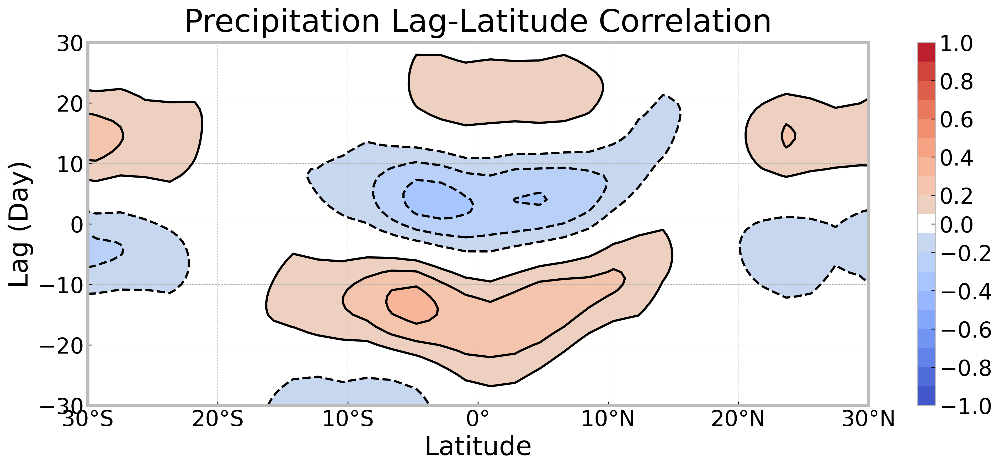

Variable: Outgoing Longwave Radiation
Computing correlations...
Correlations computed


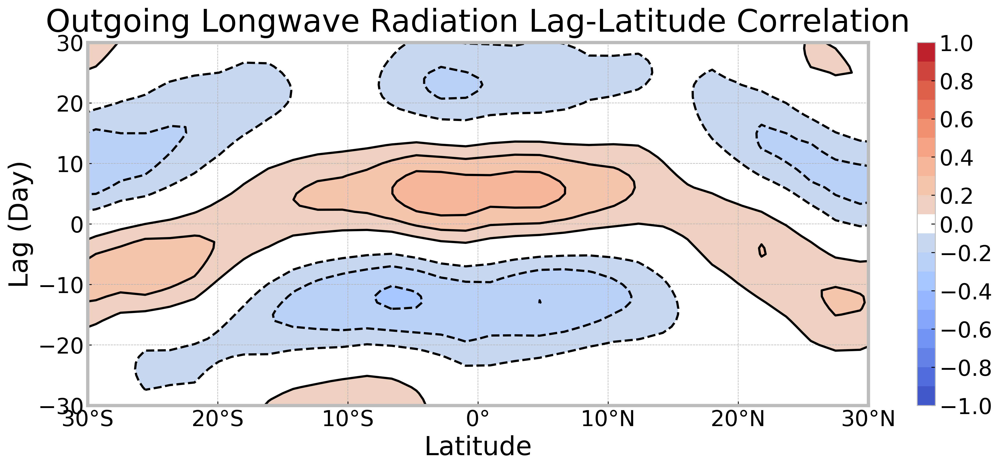

Variable: Zonal Wind
Computing correlations...
Correlations computed


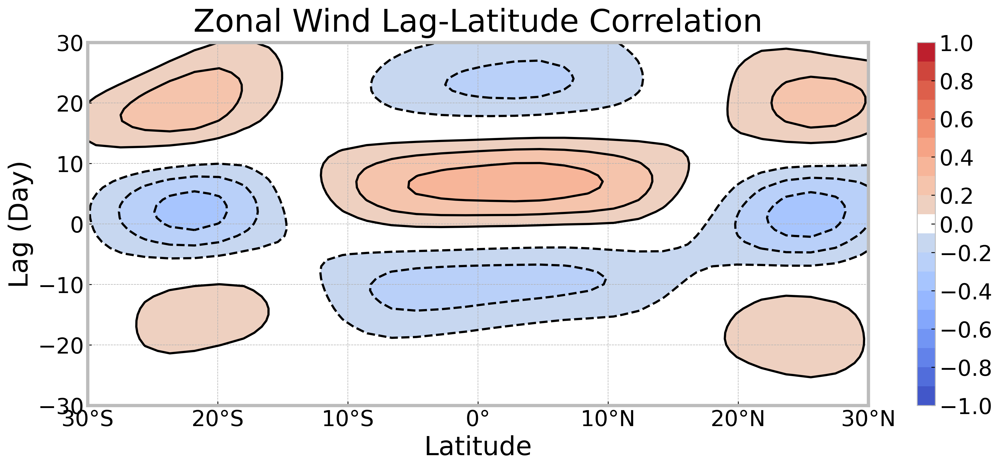

Variable: Zonal Wind
Computing correlations...
Correlations computed


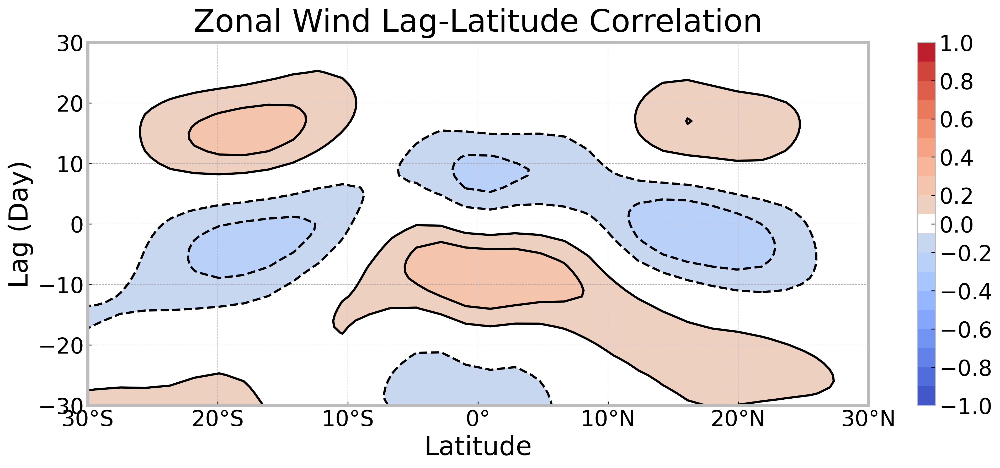

Variable: Vertical Wind
Computing correlations...
Correlations computed


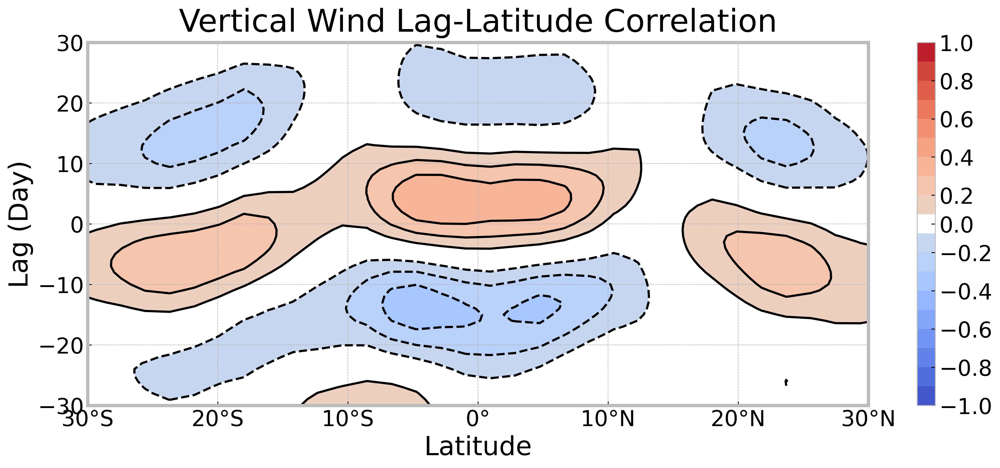

Variable: Column Temperature
Computing correlations...
Correlations computed


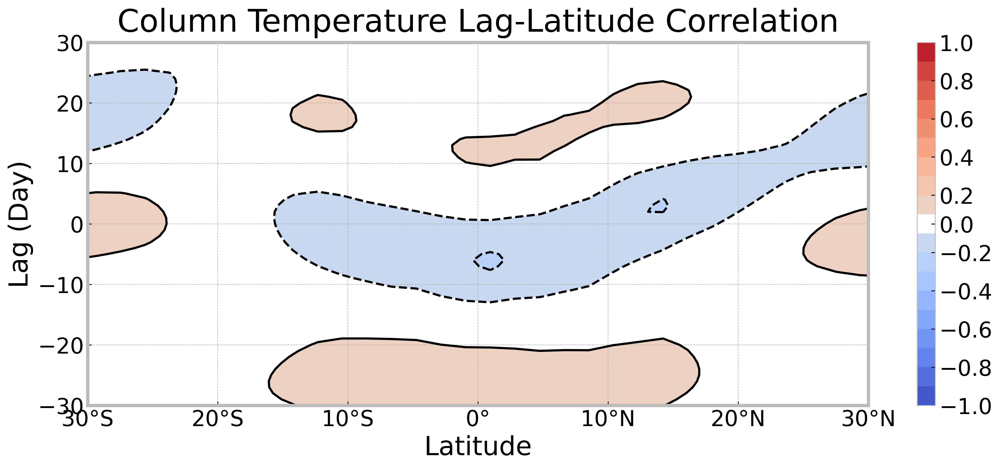

Variable: Column Water Vapor
Computing correlations...
Correlations computed


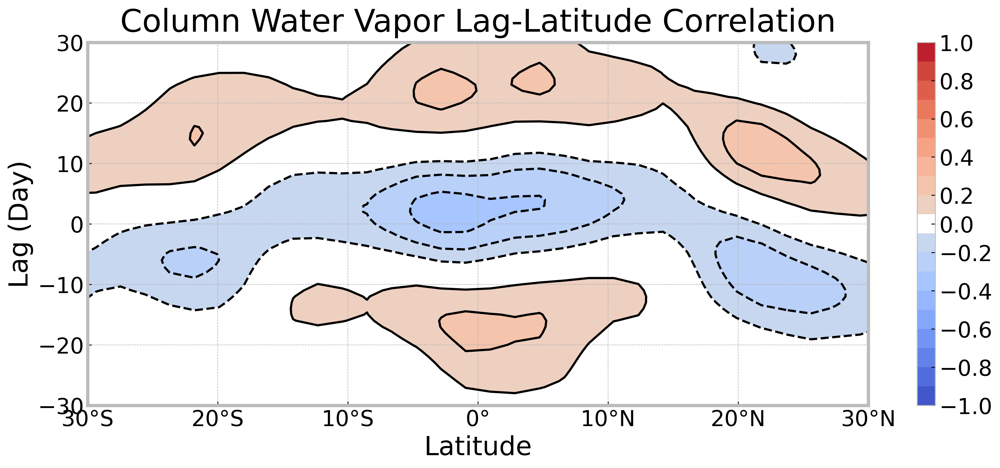

Finished


In [188]:
calculate_corr = True
plot_corr = True
savefig = False

lag_days = np.arange(-30, 31)
reference_lon = 180
meridional_mean_region = slice(-10, 10)
weights = np.cos(np.deg2rad(latitude))
weights.name = "weights"

variables_to_plot = [
    variables_filtered['precipitation'.title()],
    variables_filtered['outgoing longwave radiation'.title()],
    variables_filtered['zonal wind'.title()].sel(plev=200),
    variables_filtered['zonal wind'.title()].sel(plev=850),
    variables_filtered['vertical wind'.title()].sel(plev=500),
    variables_filtered['column temperature'.title()],
    variables_filtered['column water vapor'.title()],
]

if calculate_corr or 'lag_latitude_correlation' not in globals():
    lag_latitude_correlation = {}

for variable in variables_to_plot:
    print(f"Variable: {variable.name}")

    if calculate_corr:
        # lag_latitude_correlation[variable.name] = np.empty((len(lag_days), len(longitude)))
        lag_latitude_correlation[variable.name] = xr.DataArray(
            data=np.empty((len(lag_days), len(latitude))),
            dims=["lag", "lat"],
            coords=dict(
                lag=lag_days,
                lat=latitude
            )
        )

        # reference_time_series = variable.sel(lon=reference_lon, lat=meridional_mean_region).weighted(weights).mean(dim='lat')
        reference_time_series = PC[0]

        print("Computing correlations...")
        for lag_index, lag in enumerate(lag_days):
            lag_latitude_correlation[variable.name][lag_index] = np.einsum(
                    'ij,i->j',
                    standardize_data(variable.sel(lon=reference_lon)),
                    np.roll(standardize_data(reference_time_series), shift=lag),
                ) / len(reference_time_series)
        print("Correlations computed")

    if plot_corr:
        plt.style.use("bmh")
        plt.rcParams.update({"font.size": 20})
        [fig, ax] = plt.subplots(figsize=(16, 6))

        ax.set_title(
            f"{variable.name} Lag-Latitude Correlation",
            pad=10
        )

        levels = np.linspace(-1, 1, 21)

        im = ax.contourf(
            lag_latitude_correlation[variable.name].lat,
            lag_latitude_correlation[variable.name].lag,
            lag_latitude_correlation[variable.name],
            cmap=mjo.modified_colormap('coolwarm', 'white', 0.05, 0.05),
            levels=levels[levels != 0]
        )
        cbar = fig.colorbar(im)
        cbar.set_ticks(np.arange(-1, 1.2, 0.2))

        ax.contour(
            lag_latitude_correlation[variable.name].lat,
            lag_latitude_correlation[variable.name].lag,
            lag_latitude_correlation[variable.name],
            colors="k",
            levels=levels[levels != 0]
        )


        ax.set_xlim(-30, 30)
        ax.set_ylim(-30, 30)
        xtick_locations = np.arange(-30, 30 + 10, 10)
        ax.set_xticks(ticks=xtick_locations, labels=tick_labeller(xtick_locations, "lat"))
        # ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=7, prune="lower"))
        ax.set_xlabel("Latitude")
        ax.set_ylabel("Lag (Day)")

        for spine in ax.spines.values():
            spine.set_edgecolor("#bcbcbc")
            spine.set_linewidth(3)

        # plt.show()
        if not savefig:
            plt.show()
        else:
            save_string = (
                f"{experiment}"
                + f"_{compositing_variable.attrs['file_id']}"
                + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}"
                + f"_PC-{PCs_to_use[0]+1}-{PCs_to_use[1]+1}_lag-longitude-correlation.png"
            )
            print(f"Saving plot as {save_string}")
            plt.savefig(
                f"{output_directory}/correlations/lag-latitude/{save_string}",
                dpi=500,
                bbox_inches="tight",
            )

print(f"{'='*40}")
print("Finished")

#### Lag-Height

Variable: Zonal Wind
Computing correlations...
Correlations computed


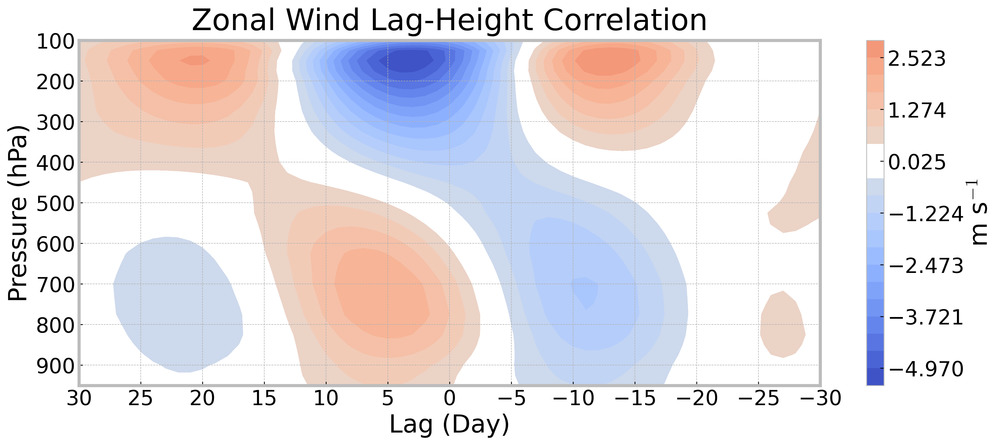

Variable: Meridional Wind
Computing correlations...
Correlations computed


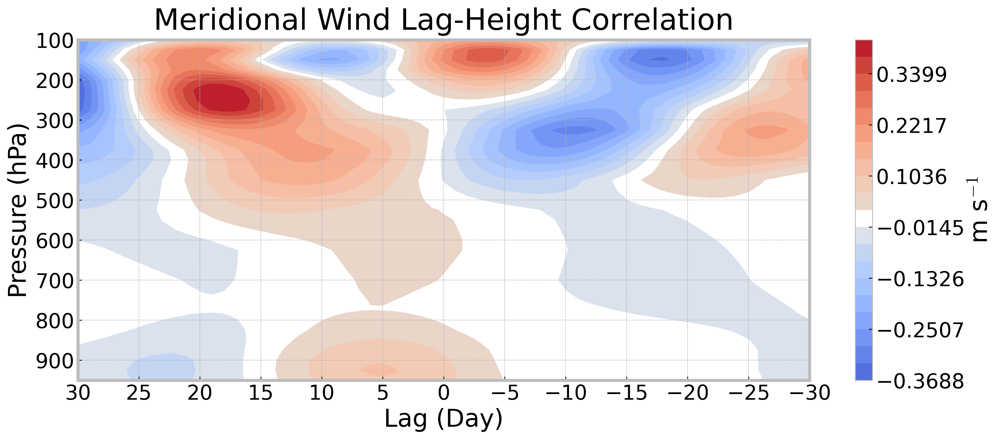

Variable: Vertical Wind
Computing correlations...
Correlations computed


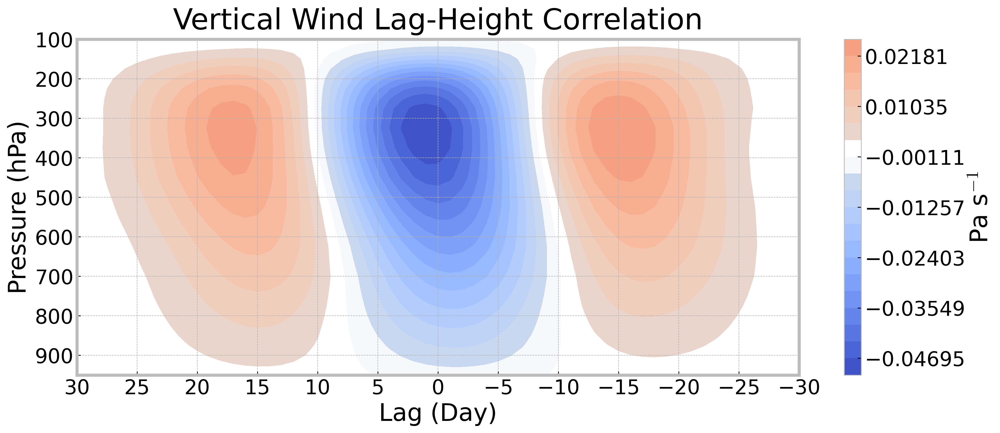

Variable: Temperature
Computing correlations...
Correlations computed


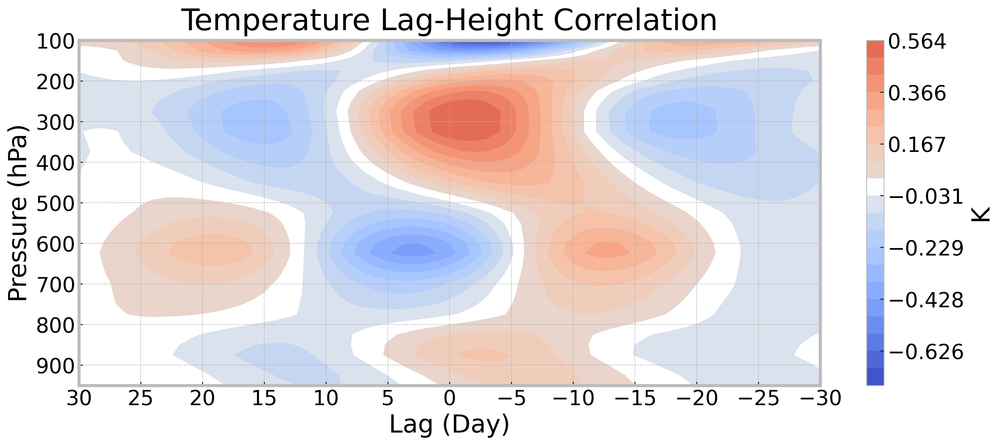

Variable: Moisture
Computing correlations...
Correlations computed


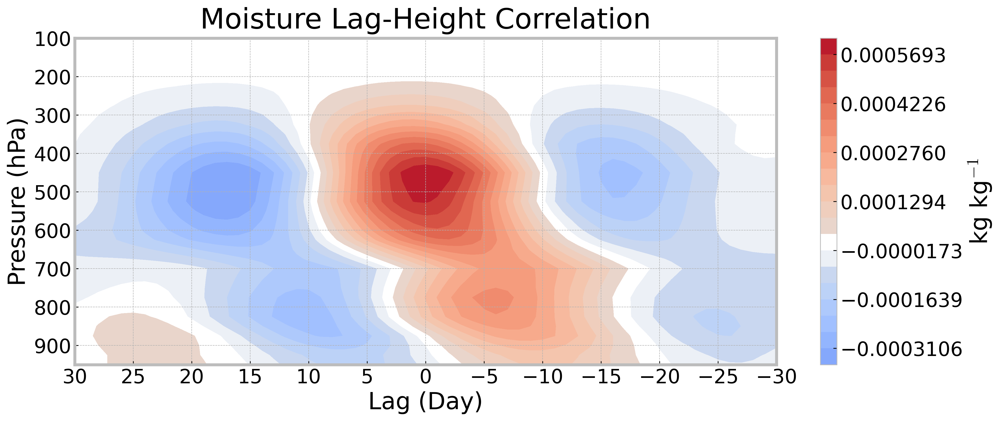

Variable: Geopotential Height
Computing correlations...
Correlations computed


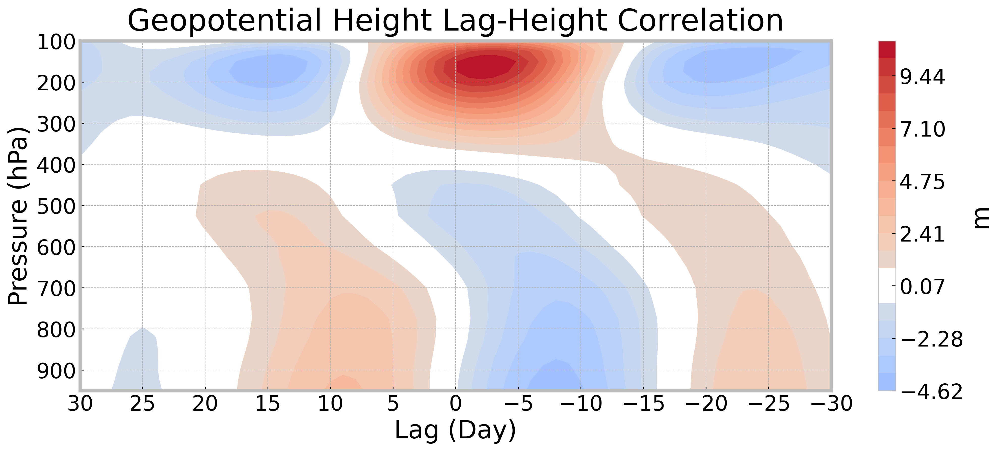

Variable: Moist Static Energy
Computing correlations...
Correlations computed


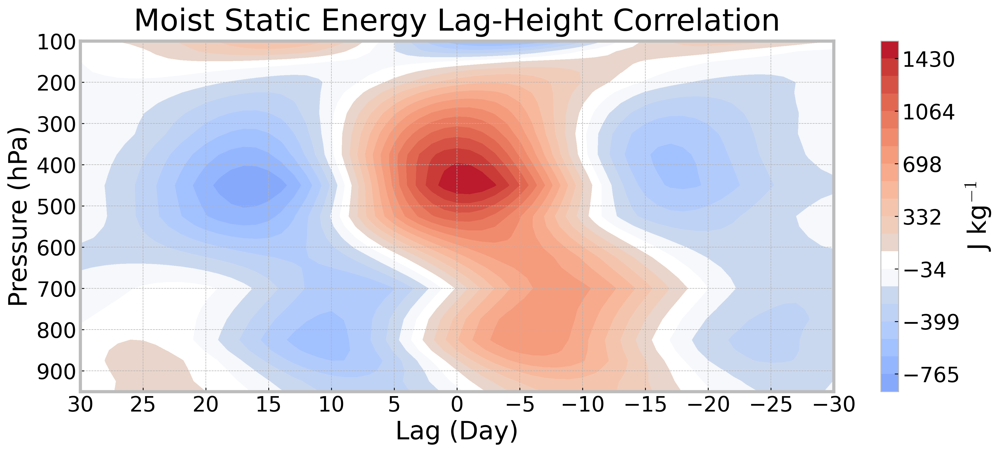

Variable: Longwave Heating Rate
Computing correlations...
Correlations computed


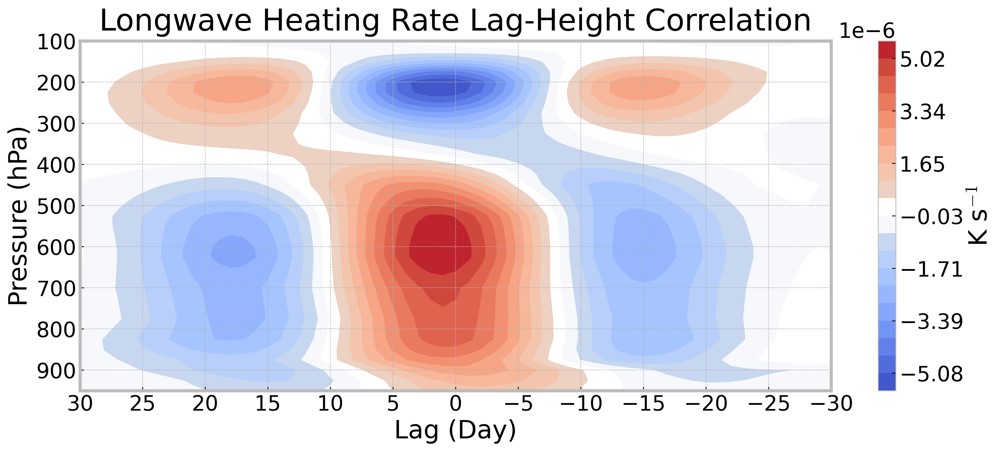

Variable: Shortwave Heating Rate
Computing correlations...
Correlations computed


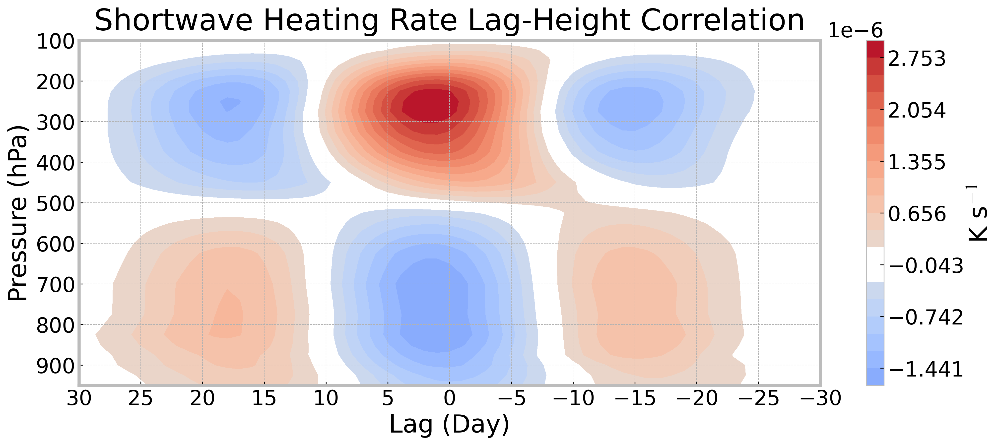

Finished


In [199]:
calculate_corr = True
plot_corr = True
savefig = False

lag_days = np.arange(-30, 31)
reference_lon = 180
meridional_mean_region = slice(-10, 10)
weights = np.cos(np.deg2rad(latitude))
weights.name = "weights"

variables_to_plot = [
    variables_filtered['zonal wind'.title()],
    variables_filtered['meridional wind'.title()],
    variables_filtered['vertical wind'.title()],
    variables_filtered['temperature'.title()],
    variables_filtered['moisture'.title()],
    variables_filtered['geopotential height'.title()],
    variables_filtered['moist static energy'.title()],
    variables_filtered['longwave heating rate'.title()],
    variables_filtered['shortwave heating rate'.title()],
]

if calculate_corr or 'lag_height_correlation' not in globals():
    lag_height_correlation = {}

for variable in variables_to_plot:
    print(f"Variable: {variable.name}")

    if calculate_corr:
        lag_height_correlation[variable.name] = xr.DataArray(
            data=np.empty((len(lag_days), len(pressure_levels))),
            dims=["lag", "plev"],
            coords=dict(
                lag=lag_days,
                plev=pressure_levels
            )
        )

        # reference_time_series = variable.sel(lon=reference_lon, lat=meridional_mean_region, plev=500).weighted(weights).mean(dim='lat')
        reference_time_series = variables_filtered['Precipitation'].sel(
            lon=reference_lon, lat=meridional_mean_region
        ).weighted(weights).mean(dim='lat')
        # reference_time_series = PC[0]

        print("Computing correlations...")
        for lag_index, lag in enumerate(lag_days):
            lag_height_correlation[variable.name][lag_index] = np.einsum(
                    'ij,i->j',
                    # standardize_data(variable.sel(lon=reference_lon, lat=meridional_mean_region).weighted(weights).mean(dim='lat')),
                    variable.sel(lon=reference_lon, lat=meridional_mean_region).weighted(weights).mean(dim='lat'),
                    np.roll(standardize_data(reference_time_series), shift=lag),
                ) / len(reference_time_series)
        print("Correlations computed")

    if plot_corr:
        plt.style.use("bmh")
        plt.rcParams.update({"font.size": 20})
        [fig, ax] = plt.subplots(figsize=(16, 6))

        ax.set_title(
            f"{variable.name} Lag-Height Correlation",
            pad=10
        )

        # levels = np.linspace(-1, 1, 21)
        levels = np.linspace(
            lag_height_correlation[variable.name].min(),
            lag_height_correlation[variable.name].max(),
            21
        )

        im = ax.contourf(
            lag_height_correlation[variable.name].lag,
            lag_height_correlation[variable.name].plev,
            lag_height_correlation[variable.name].T,
            cmap=mjo.modified_colormap('coolwarm', 'white', 0.05, 0.05),
            norm=mcolors.CenteredNorm(vcenter=0),
            levels=levels[levels != 0]
        )
        cbar = fig.colorbar(im)
        cbar.set_label(f"{variable.attrs['units']}")
        # cbar.set_ticks(np.arange(-1, 1.2, 0.2))

        # ax.contour(
        #     lag_height_correlation[variable.name].lag,
        #     lag_height_correlation[variable.name].plev,
        #     lag_height_correlation[variable.name].T,
        #     colors="k",
        #     levels=levels[levels != 0]
        # )

        ax.set_xlim(-30, 30)
        ax.set_xticks(np.arange(-30, 35, 5))
        ax.invert_xaxis()
        # ax.xaxis.set_major_locator(mticker.MaxNLocator(nbins=7, prune="lower"))
        ax.set_xlabel("Lag (Day)")

        ax.set_ylim(100, 950)
        ax.set_yticks(np.arange(100, 1000, 100))
        ax.set_ylabel("Pressure (hPa)")
        ax.invert_yaxis()

        for spine in ax.spines.values():
            spine.set_edgecolor("#bcbcbc")
            spine.set_linewidth(3)

        # plt.show()
        if not savefig:
            plt.show()
        else:
            save_string = (
                f"{experiment}"
                + f"_{compositing_variable.attrs['file_id']}"
                + f"{((str(compositing_variable.plev.values)) if 'plev' in compositing_variable.coords else '')}"
                + f"_PC-{PCs_to_use[0]+1}-{PCs_to_use[1]+1}_lag-longitude-correlation.png"
            )
            print(f"Saving plot as {save_string}")
            plt.savefig(
                f"{output_directory}/correlations/lag-longitude/{save_string}",
                dpi=500,
                bbox_inches="tight",
            )

print(f"{'='*40}")
print("Finished")